# Community Deception

Connect Google Drive to access the dataset.

In [1]:
# from google.colab import drive
# drive.mount('/content/drive')

## Install Pytorch Geometric

If we are on Kaggle we need to run the following cells to install Pytorch Geometric

In [2]:
import torch
import os

os.environ["TORCH"] = torch.__version__

# On Colab we can have TORCH+CUDA on os.environ["TORCH"]

# Check if there is the cuda version on TORCH
if torch.cuda.is_available():
    print("CUDA is available")
    print(torch.version.cuda)
    if "+" not in os.environ["TORCH"]:
        os.environ["TORCH"] += "+cu" + \
            torch.version.cuda.replace(".", "")

print(os.environ["TORCH"])

CUDA is available
11.8
2.0.0+cu118


Install torch geometric and optional dependencies:

In [3]:
! pip install torch_geometric
# Optional dependencies:
# ! pip install pyg_lib torch_scatter torch_sparse torch_cluster torch_spline_conv -f https://data.pyg.org/whl/torch-${TORCH}+${CUDA}.html
# ! pip install pyg_lib torch_scatter torch_sparse torch_cluster torch_spline_conv -f https://data.pyg.org/whl/torch-2.0.0+cu118.html
# ! pip install pyg_lib torch_scatter torch_sparse torch_cluster torch_spline_conv -f https://data.pyg.org/whl/torch-${TORCH}.html
! pip install pyg_lib torch_scatter torch_sparse -f https://data.pyg.org/whl/torch-${TORCH}.html

# Graph
! pip install igraph
! pip install cdlib[C]
! pip install karateclub

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 661.6/661.6 kB 19.8 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for torch_geometric: filename=torch_geometric-2.3.1-py3-none-any.whl size=910454 sha256=123a5c5993aef2d4f60fc1cdac73cd6ef613695382e262156096a0642c805336
  Stored in directory: /root/.cache/pip/wheels/ac/dc/30/e2874821ff308ee67dcd7a66dbde912411e19e35a1addda028
Successfully built torch_geometric
Looking in links: https://data.pyg.org/whl/torch-2.0.0+cu118.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 22.3 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.2/10.2 MB 74.6 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.8/4.8 MB 78.1 MB/s eta 0:00:00:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 230.3/230.3 kB 8.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 263.1/263.1 kB 19

**IMPORTANT!!!**
After the libraries installation, restart the runtime and start executing the cells below

## Import Libraries

In [40]:
# Import torch and os another time to reset the colab enviroment after PyG installation
import torch
import os
import gc

# Typing
from typing import List, Tuple, Set
from collections import Counter, namedtuple

# Deep Learning
from torch_geometric.utils import from_networkx
from torch_geometric.data import Data
from torch_geometric.data import Batch
from torch_geometric.nn import GCNConv, GATConv
from torch_geometric.nn import global_mean_pool
from torch.distributions import MultivariateNormal

import torch
import torch.nn as nn
import torch.nn.functional as F

import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import scipy

# Graph
from karateclub import GL2Vec
from cdlib import algorithms
import cdlib
import networkx as nx
import igraph as ig


# Misc
from enum import Enum
from tqdm import trange
import math
import random
import json

# Plot
import matplotlib.pyplot as plt
plt.style.use('default')

## Utils

In [41]:
class FilePaths(Enum):
    """Class to store file paths for data and models"""
    # ° Local
    # DATASETS_DIR = 'dataset/data'
    # LOG_DIR    = 'src/logs/'
    # TEST_DIR = 'test/'
    # ° Kaggle
    DATASETS_DIR = '/kaggle/input/network-community'
    LOG_DIR = '/kaggle/working/logs/'
    TEST_DIR = '/kaggle/working/test/'
    # ° Google Colab
    # DATASETS_DIR = "/content/drive/MyDrive/Sapienza/Tesi/Datasets"
    # LOG_DIR = "/content/drive/MyDrive/Sapienza/Tesi/Logs/"
    # TEST_DIR = "/content/drive/MyDrive/Sapienza/Tesi/Test/"

    # Dataset file paths
    KAR = DATASETS_DIR + '/kar.mtx'
    DOL = DATASETS_DIR + '/dol.mtx'
    MAD = DATASETS_DIR + '/mad.mtx'
    LESM = DATASETS_DIR + '/lesm.mtx'
    POLB = DATASETS_DIR + '/polb.mtx'
    WORDS = DATASETS_DIR + '/words.mtx'
    ERDOS = DATASETS_DIR + '/erdos.mtx'
    POW = DATASETS_DIR + '/pow.mtx'
    FB_75 = DATASETS_DIR + '/fb-75.mtx'
    DBLP = DATASETS_DIR + '/dblp.mtx'
    ASTR = DATASETS_DIR + '/astr.mtx'
    AMZ = DATASETS_DIR + '/amz.mtx'
    YOU = DATASETS_DIR + '/you.mtx'
    ORK = DATASETS_DIR + '/ork.mtx'


class HyperParams(Enum):
    """Hyperparameters for the Environment"""
    # Numeber of possible action with BETA=30, is 30% of the edges
    BETA = 10
    # ° Hyperparameters  Testing ° #
    # Weight to balance the penalty in the reward
    LAMBDA = [0.001, 0.01, 0.1, 1, 10]    # Weight to balance the two metrics in the definition of the penalty
    ALPHA = [0.1, 0.3, 0.5, 0.7, 0.9]

    """ Graph Encoder Parameters """""
    EMBEDDING_DIM = 128

    """ Agent Parameters"""
    # Networl Architecture
    HIDDEN_SIZE_1 = 32
    HIDDEN_SIZE_2 = 32

    # Hyperparameters for the ActorCritic
    EPS_CLIP = np.finfo(np.float32).eps.item()  # 0.2
    BEST_REWARD = 0.7  # -np.inf
    # ° Hyperparameters  Testing ° #
    LR = [1e-4, 1e-3, 1e-2, 1e-1]
    GAMMA = [0.3, 0.5, 0.7, 0.9]


    """ Training Parameters """
    # Number of episodes to collect experience
    MAX_EPISODES = 1000#0
    # Dictonary for logging
    LOG_DICT = {
        'train_reward': [],
        # Number of steps per episode
        'train_steps': [],
        # Average reward per step
        'train_avg_reward': [],
        # Average Actor loss per episode
        'a_loss': [],
        # Average Critic loss per episode
        'v_loss': [],
        # set max number of training episodes
        'train_episodes': MAX_EPISODES,
    }

    """Graph Generation Parameters"""
    N_NODE = 10000
    TAU1 = 3
    TAU2 = 1.5
    MU = 0.1             # TODO: Test also 0.3 and 0.6
    AVERAGE_DEGREE = 5
    MIN_COMMUNITY = 20
    SEED= 10


class DetectionAlgorithms(Enum):
    """
    Enum class for the detection algorithms
    """
    LOUV = "louvain"
    WALK = "walktrap"
    GRE = "greedy"
    INF = "infomap"
    LAB = "label_propagation"
    EIG = "eigenvector"
    BTW = "edge_betweenness"
    SPIN = "spinglass"
    OPT = "optimal"
    SCD = "scalable_community_detection"


class Utils:
    """Class to store utility functions"""

    @staticmethod
    def import_mtx_graph(file_path: str) -> nx.Graph:
        """
        Import a graph from a .mtx file

        Parameters
        ----------
        file_path : str
            File path of the .mtx file

        Returns
        -------
        nx.Graph
            Graph imported from the .mtx file
        """
        try:
            graph_matrix = scipy.io.mmread(file_path)
            graph = nx.Graph(graph_matrix)
            for node in graph.nodes:
                # graph.nodes[node]['name'] = node
                graph.nodes[node]['num_neighbors'] = len(
                    list(graph.neighbors(node)))
            return graph
        except Exception as exception:
            print("Error: ", exception)
            return None

    @staticmethod
    def generate_lfr_benchmark_graph(
        n: int=HyperParams.N_NODE.value,
        tau1: float=HyperParams.TAU1.value,
        tau2: float=HyperParams.TAU2.value,
        mu: float=HyperParams.MU.value,
        average_degree: float=HyperParams.AVERAGE_DEGREE.value,
        min_community: int=HyperParams.MIN_COMMUNITY.value,
        seed: int=HyperParams.SEED.value)->Tuple[nx.Graph, str]:
        """
        Generate a LFR benchmark graph for community detection algorithms.

        Parameters
        ----------
        n : int, optional
            _description_, by default 250
        tau1 : float, optional
            _description_, by default 3
        tau2 : float, optional
            _description_, by default 1.5
        mu : float, optional
            _description_, by default 0.1
        average_degree : float, optional
            _description_, by default 5
        min_community : int, optional
            _description_, by default 20
        seed : int, optional
            _description_, by default 10

        Returns
        -------
        nx.Graph
            Synthetic graph generated with the LFR benchmark
        file_path : str
            Path to the file where the graph is saved
        """
        graph = nx.generators.community.LFR_benchmark_graph(
            n=n,
            tau1=tau1,
            tau2=tau2,
            mu=mu,
            average_degree=average_degree,
            min_community=min_community,
            seed=seed)
        file_path = FilePaths.DATASETS_DIR.value + f"/lfr_benchmark_mu-{mu}.mtx"
        nx.write_edgelist(graph, file_path, data=False)
        # Delete community attribute from the nodes to handle PyG compatibility
        for node in graph.nodes:
            if 'community' in graph.nodes[node]:
                del graph.nodes[node]['community']
        for edge in graph.edges:
            graph.edges[edge]['weight'] = 1
        return graph, file_path

    @staticmethod
    def check_dir(path: str):
        """
        Check if the directory exists, if not create it.

        Parameters
        ----------
        path : str
            Path to the directory
        """
        if not os.path.exists(path):
            os.makedirs(path)

    @staticmethod
    def plot_training(
        log: dict,
        env_name: str,
        detection_algorithm: str,
        file_path: str,
        window_size: int=100):
        """Plot the training results

        Parameters
        ----------
        log : dict
            Dictionary containing the training logs
        env_name : str
            Name of the environment
        detection_algorithm : str
            Name of the detection algorithm
        file_path : str
            Path to save the plot
        window_size : int, optional
            Size of the rolling window, by default 100
        """
        def plot_time_series(
            list_1: List[float],
            list_2: List[float],
            label_1: str,
            label_2: str,
            color_1: str,
            color_2: str,
            file_name: str):
            _, ax1 = plt.subplots()
            color = 'tab:'+color_1
            ax1.set_xlabel("Episode")
            ax1.set_ylabel(label_1, color=color)
            ax1.plot(list_1, color=color)
            ax1.tick_params(axis='y', labelcolor=color)

            ax2 = ax1.twinx()
            color = 'tab:'+color_2
            ax2.set_ylabel(label_2, color=color)
            ax2.plot(list_2, color=color)
            ax2.tick_params(axis='y', labelcolor=color)

            plt.title(
                f"Training on {env_name} graph with {detection_algorithm} algorithm")
            plt.savefig(file_name)
            plt.show()

        plot_time_series(
            log['train_avg_reward'],
            log['train_steps'],
            'Avg Reward',
            'Steps per Epoch',
            'blue',
            'orange',
            file_path+"/training_reward.png",
        )
        plot_time_series(
            log["a_loss"],
            log["v_loss"],
            'Actor Loss',
            'Critic Loss',
            'green',
            'red',
            file_path+"/training_loss.png",
        )

        # Compute the rolling windows of the time series data using NumPy
        rolling_data_1 = np.convolve(np.array(log["train_avg_reward"]),
            np.ones(window_size) / window_size, mode='valid')
        rolling_data_2 = np.convolve(np.array(log["train_steps"]),
            np.ones(window_size) / window_size, mode='valid')
        plot_time_series(
            rolling_data_1,
            rolling_data_2,
            'Avg Reward',
            'Steps per Epoch',
            'blue',
            'orange',
            file_path+"/training_rolling_reward.png",
        )
        # Compute the rolling windows of the time series data using NumPy
        rolling_data_1 = np.convolve(np.array(log["a_loss"]),
            np.ones(window_size) / window_size, mode='valid')
        rolling_data_2 = np.convolve(np.array(log["v_loss"]),
            np.ones(window_size) / window_size, mode='valid')
        plot_time_series(
            rolling_data_1,
            rolling_data_2,
            'Actor Loss',
            'Critic Loss',
            'green',
            'red',
            file_path+"/training_rolling_loss.png",
        )


    @staticmethod
    def save_training(
            log: dict,
            env_name: str,
            detection_algorithm: str,
            file_path: str):
        """Plot the training results

        Parameters
        ----------
        log : dict
            Dictionary containing the training logs
        env_name : str
            Name of the environment
        detection_algorithm : str
            Name of the detection algorithm
        file_path : str
            Path to save the plot
        """
        file_name = f"{file_path}/results.json"
        with open(file_name, "w", encoding="utf-8") as f:
            json.dump(log, f, indent=4)


In [42]:
# Create paths
Utils.check_dir(FilePaths.LOG_DIR.value)
Utils.check_dir(FilePaths.TEST_DIR.value)

## Community Algorithms

### Communities Detection

In [43]:
class CommunityDetectionAlgorithm(object):
    """Class for the community detection algorithms using CDLIB"""
    def __init__(self, alg_name: str) -> None:
        """
        Initialize the DetectionAlgorithm object

        Parameters
        ----------
        alg_name : str
            The name of the algorithm
        """
        self.alg_name = alg_name

    def compute_community(self, graph: nx.Graph) -> cdlib.NodeClustering:
        """Compute the community partition of the graph

        Parameters
        ----------
        graph : nx.Graph
            Input graph

        Returns
        -------
        cdlib.NodeClustering
            Cdlib NodeClustering object
        """
        # Rename DetectionAlgorithms Enum to da for convenience
        da = DetectionAlgorithms
        # Choose the algorithm
        if self.alg_name == da.LOUV.value:
            return algorithms.louvain(graph)
        elif self.alg_name == da.WALK.value:
            return algorithms.walktrap(graph)
        elif self.alg_name == da.GRE.value:
            return algorithms.greedy_modularity(graph)
        elif self.alg_name == da.INF.value:
            return algorithms.infomap(graph)
        # elif self.alg_name == da.LAB.value:
        #    # ! Return a EdgeClustering object
        #    return algorithms.label_propagation(graph)
        elif self.alg_name == da.EIG.value:
            return algorithms.eigenvector(graph)
        # elif self.alg_name == da.BTW.value:
        #     return self.compute_btw(graph, args)
        elif self.alg_name == da.SPIN.value:
            return algorithms.spinglass(graph)
        # elif self.alg_name == da.OPT.value:
        #    return self.compute_opt(graph, args)
        # elif self.alg_name == da.SCD.value:
        #    return self.compute_scd(graph)
        else:
            raise ValueError('Invalid algorithm name')

### Normalized Mutual Information Score

In [44]:

class NormalizedMutualInformation(object):
    @staticmethod
    def calculate_confusion_matrix(
            communities_old: List[List[int]],
            communities_new: List[List[int]]) -> Counter:
        """
        Calculate the confusion matrix between two sets of communities.
        Where the element (i, j) of the confusion matrix is the number of shared
        members between an initially detected community C_i and the community
        C_j after deception.

        Parameters
        ----------
        communities_old : List[List[int]]
            Communities before deception
        communities_new : List[List[int]]
            Communities after deception

        Returns
        -------
        confusion_matrix : Counter
            Confusion matrix
        """
        confusion_matrix = Counter()
        #° Avoid to process the same community twice
        #BUG ZeroDivisionError if we use this optimization
        #BUG processed_new = set()
        for i, old in enumerate(communities_old):
            for j, new in enumerate(communities_new):
                #BUG if j not in processed_new:
                intersection = len(set(old) & set(new))
                confusion_matrix[(i, j)] = intersection
                #BUG    if intersection > 0:
                #BUG        processed_new.add(j)
        return confusion_matrix

    @staticmethod
    def calculate_sums(confusion_matrix: Counter) -> Tuple[Counter, Counter, int]:
        """
        Calculate the row sums, column sums and total sum of a confusion matrix.

        Parameters
        ----------
        confusion_matrix : Counter
            Confusion matrix

        Returns
        -------
        (row_sums, col_sums, total_sum) : Tuple[Counter, Counter, int]
            Tuple containing the row sums, column sums and total sum of the
            confusion matrix.
        """
        row_sums = Counter()
        col_sums = Counter()
        total_sum = 0
        for (i, j), value in confusion_matrix.items():
            row_sums[i] += value
            col_sums[j] += value
            total_sum += value
        return row_sums, col_sums, total_sum

    def compute_nmi(
            self,
            communities_old: List[List[int]],
            communities_new: List[List[int]]) -> float:
        """
        Calculate the normalized mutual information between two sets of
        Communities.

        Parameters
        ----------
        communities_old : List[List[int]]
            List of communities before deception
        communities_new : List[List[int]]
            List of communities after deception

        Returns
        -------
        nmi : float
            Normalized mutual information, value between 0 and 1.
        """
        confusion_matrix = self.calculate_confusion_matrix(
            communities_old, communities_new)
        row_sums, col_sums, total_sum = self.calculate_sums(confusion_matrix)

        # Numerator
        nmi_numerator = 0
        for (i, j), n_ij in confusion_matrix.items():
            n_i = row_sums[i]
            n_j = col_sums[j]
            try:
                nmi_numerator += n_ij * math.log((n_ij * total_sum) / (n_i * n_j))
            except ValueError:
                # We could get a math domain error if n_ij is 0
                continue

        # Denominator
        nmi_denominator = 0
        for i, n_i in row_sums.items():
            nmi_denominator += n_i * math.log(n_i / total_sum)
        for j, n_j in col_sums.items():
            nmi_denominator += n_j * math.log(n_j / total_sum)
        # Normalized mutual information
        nmi_score = -2 * nmi_numerator / nmi_denominator
        return nmi_score

## Enviroment

In [45]:
class GraphEnvironment(object):
    """Enviroment where the agent will act, it will be a graph with a community"""

    def __init__(
            self, 
            graph: nx.Graph, 
            env_name: str,
            community_detection_algorithm: str,
            beta: float = HyperParams.BETA.value) -> None:
        """Constructor for Graph Environment
        Parameters
        ----------
        graph : nx.Graph
            Graph to use for the environment
        env_name : str
            Name of the environment, i.e. name of the dataset
        community_detection_algorithm : str
            Name of the community detection algorithm to use
        beta : float, optional
            Percentage of edges to remove, by default HyperParams.BETA.value
        """
        self.graph = graph
        # Save the original graph to restart the rewiring process at each episode
        self.original_graph = graph.copy()
        # Save the graph state before the action, used to compute the metrics
        self.old_graph = None
        # Get the Number of connected components
        self.n_connected_components = nx.number_connected_components(graph)
        
        assert beta >= 0 and beta <= 100, "Beta must be between 0 and 100"
        # Percentage of edges to remove
        self.beta = beta
        # Weights for the reward and the penalty
        self.lambda_metric = None # lambda_metric
        self.alpha_metric = None # alpha_metric
        # Name of the environment and the community detection algorithm
        self.env_name = env_name
        self.detection_alg = community_detection_algorithm
        
        # Community Algorithms objects
        self.detection = CommunityDetectionAlgorithm(community_detection_algorithm)
        
        # Metrics
        # self.deception = DeceptionScore(self.community_target)
        # self.safeness = Safeness(self.graph, self.community_target, self.node_target)
        # self.nmi = NormalizedMutualInformation()
        self.old_metric_value = 0
        
        # Compute the community structure of the graph, before the action,
        # i.e. before the deception
        self.original_community_structure = self.detection.compute_community(graph)
        # ! It is a NodeClustering object
        self.old_community_structure = self.original_community_structure

        # Choose one of the communities found by the algorithm, as initial 
        # community we choose the community with the highest number of nodes
        self.community_target = max(
            self.original_community_structure.communities, key=len)
        # Index of the target community in the list of communities
        self.idx_community_target = self.original_community_structure.communities.index(
            self.community_target)
        # Choose a node randomly from the community, as initial node to remove
        self.node_target = self.community_target[random.randint(0, len(self.community_target)-1)]
        
        # Compute the edge budget for the graph
        self.edge_budget = self.get_edge_budget()
        # Amount of budget used
        self.used_edge_budget = 0
        # Max Rewiring Steps during an episode, set a limit to avoid infinite episodes
        # in case the agent does not find the target node
        self.max_steps = self.graph.number_of_edges()#*2
        # Whether the budget for the graph rewiring is exhausted, or the target
        # node does not belong to the community anymore
        self.stop_episode = False
        self.rewards = 0
        # Reward of the previous step
        self.old_rewards = 0
        
        # Compute the set of possible actions
        self.possible_actions = self.get_possible_actions()
        # Length of the list of possible actions to add
        self.len_add_actions = len(self.possible_actions["ADD"])
        
        # Print the environment information
        print("* Community Detection Algorithm:", self.detection_alg)
        print("* Number of communities found:",
            len(self.original_community_structure.communities))
        print("* Initial Community Target:", self.community_target)
        print("* Initial Index of the Community Target:", self.idx_community_target)
        print("* Initial Nodes Target:", self.node_target)
        print("* Number of possible actions:", 
            len(self.possible_actions["ADD"]) + len(self.possible_actions["REMOVE"]))
        print("* Rewiring Budget:", self.edge_budget, "=",
            self.beta, "*", self.graph.number_of_edges(), "/ 100",)
        print("*", "-"*58, "\n")

    ############################################################################
    #                       GETTERS FUNCTIONS                                  #
    ############################################################################
    def get_edge_budget(self) -> int:
        """
        Computes the edge budget for each graph

        Returns
        -------
        int
            Edge budgets of the graph
        """
        return int(math.ceil((self.graph.number_of_edges() * self.beta / 100)))
    
    def get_metrics(self) -> float:
        """
        Compute the metrics and return the penalty to subtract from the reward

        Returns
        -------
        penalty: float
            Penalty to subtract from the reward
        """
        # Compute the new Community Structure after the action
        self.new_community_structure = self.detection.compute_community(
            self.graph)
        # Search the index of the target community in the new list of communities
        self.idx_community_target = self.get_community_target_idx(
            self.new_community_structure.communities,
            self.community_target)
        
        # ° Distance between community structures
        community_metric = self.new_community_structure.normalized_mutual_information(
            self.old_community_structure).score
        # We want to maximize the NMI, so we subtract it from 1
        community_metric = 1 - community_metric
        
        # ° Distance between graphs
        # graph_metric = nx.graph_edit_distance(self.graph, self.old_graph)
        # Faster approximation of the graph edit distance
        # graph_metric = next(nx.optimize_graph_edit_distance(self.graph, self.old_graph))

        # Normalize the graph edit distance using a null graph:
        #   GED(G1,G2)/[GED(G1,G0) + GED(G2,G0)]
        # with G0 = null graph
        # g_dist_1 = next(nx.optimize_graph_edit_distance(self.graph, nx.null_graph()))
        # g_dist_2 = next(nx.optimize_graph_edit_distance(self.old_graph, nx.null_graph()))
        # graph_metric /= (g_dist_1 + g_dist_2)
        
        # TEST
        def jaccard_similarity(g: nx.Graph, h: nx.Graph) -> float:
            """Compute the Jaccard Similarity between two graphs"""
            i = set(g).intersection(h)
            return round(len(i) / (len(g) + len(h) - len(i)), 3)
        
        graph_metric = jaccard_similarity(self.graph.edges(), self.old_graph.edges())
        # We want to maximize the Jaccard Similarity, so we subtract it from 1
        graph_metric = 1 - graph_metric
        
        # ° Compute metrics with the weight alpha
        assert self.alpha_metric is not None, "Alpha metric is None, must be set in grid search"
        metric = self.alpha_metric * community_metric + (1 - self.alpha_metric) * graph_metric

        # ° Subtract the metric value of the previous step
        metric -= self.old_metric_value
        # Update with the new values
        self.old_metric_value = metric
        self.old_community_structure = self.new_community_structure
        return metric

    def get_reward(self) -> Tuple[float, bool]:
        """
        Computes the reward for the agent, it is a 0-1 value function, if the
        target node still belongs to the community, the reward is 0 minus the
        penalty, otherwise the reward is 1 minus the penalty.

        Returns
        -------
        reward : float
            Reward of the agent
        done : bool
            Whether the episode is finished, if the target node does not belong
            to the community anymore, the episode is finished
        """
        assert self.lambda_metric is not None, "Lambda metric is None, must be set in grid search"
        
        # Compute the metric to subtract from the reward
        metric = self.get_metrics()
        
        communities_list = self.new_community_structure.communities
        if self.node_target in communities_list[self.idx_community_target]:
            # if the intersection between the target community and the new
            # community target contains all the nodes of the original target 
            # community the node still belongs to the community
            if set(communities_list[self.idx_community_target]).issuperset(
                    set(self.community_target)):
                # The episode is not finished            
                reward = -self.lambda_metric * metric
                return reward, False
            # If the new community target does not contain all the nodes of the
            # original target community, the node does not belong to the community
            # anymore, the episode is finished
            pass
        reward = 1 - (self.lambda_metric * metric)
        return reward, True
    
    def get_community_target_idx(
                self,
                community_structure: List[List[int]],
                community_target: List[int]) -> int:
        """
        Returns the index of the target community in the list of communities.
        As the target community after a rewiring action we consider the community
        with the highest number of nodes equal to the initial community.
        
        Parameters
        ----------
        community_structure : List[List[int]]
            List of communities
        community_target : List[int]
            Community of node we want to remove from it
        
        Returns
        -------
        max_list_idx : int
            Index of the target community in the list of communities
        """
        max_count = 0
        max_list_idx = 0
        for i, lst in enumerate(community_structure):
            count = sum(1 for x in lst if x in community_target)
            if count > max_count:
                max_count = count
                max_list_idx = i
        return max_list_idx

    def get_possible_actions(self) -> dict:
        """
        Returns all the possible actions that can be applied to the graph
        given a source node (self.node_target). The possible actions are:
            - Add an edge between the source node and a node outside the community
            - Remove an edge between the source node and a node inside the community
        
        Returns
        -------
        self.possible_actions : dict
            Dictionary containing the possible actions that can be applied to
            the graph. The dictionary has two keys: "ADD" and "REMOVE", each
            key has a list of tuples as value, where each tuple is an action.
        """
        possible_actions = {"ADD": set(), "REMOVE": set()}
        # Helper functions to check if a node is in/out-side the community

        def in_community(node):
            return node in self.community_target

        def out_community(node):
            return node not in self.community_target

        u = self.node_target
        for v in self.graph.nodes():
            if u == v:
                continue
            # We can remove an edge iff both nodes are in the community
            if in_community(u) and in_community(v):
                if self.graph.has_edge(u, v):
                    if (v, u) not in possible_actions["REMOVE"]:
                        possible_actions["REMOVE"].add((u, v))
            # We can add an edge iff one node is in the community and the other is not
            elif (in_community(u) and out_community(v)) \
                    or (out_community(u) and in_community(v)):
                # Check if there is already an edge between the two nodes
                if not self.graph.has_edge(u, v):
                    if (v, u) not in possible_actions["ADD"]:
                        possible_actions["ADD"].add((u, v))
        return possible_actions
    
    ############################################################################
    #                       EPISODE RESET FUNCTIONS                            #
    ############################################################################
    def reset(self) -> Data:
        """
        Reset the environment

        Returns
        -------
        adj_matrix : torch.Tensor
            Adjacency matrix of the graph
        """
        self.used_edge_budget = 0
        self.stop_episode = False
        self.rewards = 0
        self.old_rewards = 0
        self.graph = self.original_graph.copy()
        self.old_graph = None
        self.old_metric_value = 0
        self.old_community_structure = self.original_community_structure
        self.possible_actions = self.get_possible_actions()
        
        # Change the target community and the target node at each episode
        self.change_target_community()

        return self.graph
        # Return a PyG Data object
        # self.data_pyg = from_networkx(self.graph)
        # # Initialize the node features
        # # self.data_pyg.x = torch.randn([self.data_pyg.num_nodes, HyperParams.STATE_DIM.value])
        # self.data_pyg.x = torch.eye(self.data_pyg.num_nodes, dtype=torch.float)
        # # Initialize the batch
        # self.data_pyg.batch = torch.zeros(self.data_pyg.num_nodes).long()
        # return self.data_pyg
    
    def change_target_node(self, node_target: int=None) -> None:
        """
        Change the target node to remove from the community

        Parameters
        ----------
        node_target : int, optional
            Node to remove from the community, by default None
        """
        if node_target is None:
            # Choose a node randomly from the community
            idx_node = random.randint(0, len(self.community_target)-1)
            self.node_target = self.community_target[idx_node]
        else:
            self.node_target = node_target
    
    def change_target_community(
        self, 
        community: List[int]=None, 
        idx_community: int=None,
        node_target: int=None) -> None:
        """
        Change the target community from which we want to hide the node

        Parameters
        ----------
        community : List[int]
            Community of node we want to remove from it
        idx_community : int
            Index of the community in the list of communities
        """
        if community is None:
            # Choose a community randomly from the list of communities
            self.idx_community_target = random.randint(
                0, len(self.original_community_structure.communities)-1)
            self.community_target = self.original_community_structure.communities[
                self.idx_community_target]
        else:
            self.community_target = community
            self.idx_community_target = idx_community
        self.change_target_node(node_target=node_target)
    
    ############################################################################
    #                      EPISODE STEP FUNCTIONS                              #
    ############################################################################
    def step(self, action: int) -> Tuple[nx.Graph, float, bool]:
        """
        Step function for the environment
        
        Parameters
        ----------
        action : int
            Integer representing a node in the graph, it will be the destination
            node of the rewiring action (out source node is always the target node).
            
        Returns
        -------
        self.graph : nx.Graph
            Graph state after the action
        self.rewards : float
            Reward of the agent
        self.stop_episode : bool
            Whether the episode is finished, if the target node does not belong
            to the community anymore, or the budget for the graph rewiring is
            exhausted, the episode is finished
        """
        # ° ---- ACTION ---- ° #
        # Save the graph state before the action, used to compute the metrics
        self.old_graph = self.graph.copy()
        # Take action, add/remove the edge between target node and the model output
        budget_consumed = self.apply_action(action)
        # Set a negative reward if the action has not been applied
        if budget_consumed == 0:
            self.rewards = -2
            # The state is the same as before
            # return self.data_pyg, self.rewards, self.stop_episode
            return self.graph, self.rewards, self.stop_episode
        
        # ° ---- REWARD ---- ° #
        self.rewards, done = self.get_reward()
        # If the target node does not belong to the community anymore, 
        # the episode is finished
        if done:
            self.stop_episode = True
        
        # ° ---- BUDGET ---- ° #
        # Compute used budget
        self.used_edge_budget += budget_consumed
        # If the budget for the graph rewiring is exhausted, stop the episode
        if self.edge_budget - self.used_edge_budget < 1:
            self.stop_episode = True
            # If the budget is exhausted, and the target node still belongs to
            # the community, the reward is negative
            if not done:
                self.rewards = -1
        
        return self.graph, self.rewards, self.stop_episode
        # # ° ---- PyG Data ---- ° #
        # # OLD CODE
        # # data = from_networkx(self.graph)
        # # data.x = self.data_pyg.x
        # # data.batch = self.data_pyg.batch
        # # self.data_pyg = data
        
        # # Avoid to use from_networkx, in my test is slower than the following code
        # # to compute the edge_index
        # edge_list = nx.to_edgelist(self.graph)
        # # remove weights
        # edge_list = [[e[0], e[1]] for e in edge_list]
        # edge_list += [[e[1], e[0]] for e in edge_list]
        # # order the list, first by first element, then by second element
        # edge_list = sorted(edge_list, key=lambda x: (x[0], x[1]))
        # # Create tensor
        # edge_list = torch.tensor(edge_list)
        # edge_list_t = torch.transpose(edge_list, 0, 1)
        # del edge_list
        # self.data_pyg.edge_index = edge_list_t
        # return self.data_pyg, self.rewards, self.stop_episode
    
    def apply_action(self, action: int) -> int:
        """
        Applies the action to the graph, if there is an edge between the two 
        nodes, it removes it, otherwise it adds it

        Parameters
        ----------
        action : int
            Integer representing a node in the graph, it will be the destination
            node of the rewiring action (out source node is always the target node).
        
        Returns
        -------
        budget_consumed : int
            Amount of budget consumed, 1 if the action has been applied, 0 otherwise
        """
        action = (self.node_target, action)   
        # We need to take into account both the actions (u,v) and (v,u)
        action_reversed = (action[1], action[0])
        if action in self.possible_actions["ADD"]:
            self.graph.add_edge(*action, weight=1)
            self.possible_actions["ADD"].remove(action)
            return 1
        elif action_reversed in self.possible_actions["ADD"]:
            self.graph.add_edge(*action_reversed, weight=1)
            self.possible_actions["ADD"].remove(action_reversed)
            return 1
        elif action in self.possible_actions["REMOVE"]:
            self.graph.remove_edge(*action)
            self.possible_actions["REMOVE"].remove(action)
            return 1
        elif action_reversed in self.possible_actions["REMOVE"]:
            self.graph.remove_edge(*action_reversed)
            self.possible_actions["REMOVE"].remove(action_reversed)
            return 1
        return 0


## Model

### Network

#### Encoder

In [46]:
class GraphEncoder(nn.Module):
    def __init__(
        self,
        in_feature,
        num_layers=2):
        super(GraphEncoder, self).__init__()

        # self.conv_layers = nn.ModuleList()
        # self.conv_layers.append(GCNConv(in_feature, in_feature))
        # self.conv_layers.append(GATConv(in_feature, in_feature))
        # for _ in range(num_layers - 1):
        #     # self.conv_layers.append(GCNConv(in_feature, in_feature))
        #     self.conv_layers.append(GATConv(in_feature, in_feature))

        self.relu = nn.LeakyReLU()
        # self.relu = nn.ReLU()
        self.conv1 = GCNConv(in_feature, 64)
        self.linear1 = nn.Linear(64, 32)
        self.tanh = nn.Tanh()

    def forward(self,  graph: Data) -> torch.Tensor:
        x, edge_index, batch = graph.x, graph.edge_index, graph.batch
        x = self.conv1(x, edge_index)
        x = self.relu(x)
        embedding = global_mean_pool(x, batch)
        embedding = self.linear1(embedding)
        embedding = self.tanh(embedding)
        # print(embedding.shape)
        return embedding

    # NOTE Torch Geometric MessagePassing, it takes as input the edge list
    # def forward(self, graph: Data) -> torch.Tensor:
    #     x, edge_index, batch = graph.x, graph.edge_index, graph.batch

    #     for conv in self.conv_layers:
    #         x = conv(x, edge_index)
    #         x = self.relu(x)
    #     # embedding = global_mean_pool(x, batch)
    #     # self.is_nan(x, "x")
    #     return x
    #     # embedding = x + graph.x
    #     # return embedding


#### Actor

In [47]:
class ActorNetwork(nn.Module):
    """Actor Network"""

    def __init__(
            self,
            state_dim: int,
            hidden_size_1: int,
            hidden_size_2: int,
            action_dim: int):
        super(ActorNetwork, self).__init__()

        # self.graph_encoder = GraphEncoder(state_dim)
        # self.conv1 = GCNConv(state_dim, state_dim)

        self.lin1 = nn.Linear(state_dim, hidden_size_1)
        self.lin2 = nn.Linear(hidden_size_1, hidden_size_2)
        self.lin3 = nn.Linear(hidden_size_2, action_dim)

        # self.relu = nn.LeakyReLU()
        self.relu = nn.ReLU()
        # self.tanh = nn.Tanh()

    def forward(self, data: torch.Tensor)->torch.Tensor:
        # out = F.relu(self.conv1(data.x, data.edge_index))
        # x = out + data.x
        x = F.relu(self.lin1(data))
        # x = F.relu(self.lin1(x))
        x = F.relu(self.lin2(x))
        x = self.lin3(x)
        return x

#### Critic

In [48]:
class CriticNetwork(nn.Module):
    def __init__(
            self,
            state_dim: int,
            hidden_size_1: int,
            hidden_size_2: int):
        super(CriticNetwork, self).__init__()

        # self.graph_encoder = GraphEncoder(state_dim)
        # self.conv1 = GCNConv(state_dim, state_dim)

        self.lin1 = nn.Linear(state_dim, hidden_size_1)
        self.lin2 = nn.Linear(hidden_size_1, hidden_size_2)
        self.lin3 = nn.Linear(hidden_size_2, 1)

        # self.relu = nn.LeakyReLU()
        self.relu = nn.ReLU()
        # self.relu = F.relu
        # self.tanh = nn.Tanh()

    def forward(self, data: torch.Tensor)->torch.Tensor:
        # out = F.relu(self.conv1(data.x, data.edge_index))
        # x = out + data.x
        # x = torch.sum(x, dim=0)
        x = self.relu(self.lin1(data))
        # x = self.relu(self.lin1(x))
        x = self.relu(self.lin2(x))
        x = self.lin3(x)
        return x

#### A2C

In [49]:
class ActorCritic(nn.Module):
    """ActorCritic Network"""

    def __init__(
        self,
        state_dim: int,
        hidden_size_1: int,
        hidden_size_2: int,
        action_dim: int,
        graph: nx.Graph):
        super(ActorCritic, self).__init__()
        self.actor = ActorNetwork(
            state_dim=state_dim,
            hidden_size_1=hidden_size_1,
            hidden_size_2=hidden_size_2,
            action_dim=action_dim
        )
        self.critic = CriticNetwork(
            state_dim=state_dim,
            hidden_size_1=hidden_size_1,
            hidden_size_2=hidden_size_2
        )
        self.device = torch.device(
            'cuda:0' if torch.cuda.is_available() else 'cpu')

        # Embedding dimension == 128 by defualt
        self.model = GL2Vec(dimensions=state_dim)
        # print("* Start Fit Graph Embedding")
        self.model.fit([graph])
        # print("* End Fit Graph Embedding")

    def forward(self, graph: nx.Graph, jitter=1e-20) -> Tuple[torch.Tensor, torch.Tensor]:
        """
        Forward pass, computes action and value

        Parameters
        ----------
        graph : nx.Graph
            Graph state
        jitter : float, optional
            Jitter value, by default 1e-20

        Returns
        -------
        Tuple[torch.Tensor, torch.Tensor]
            Tuple of concentration and value
        """
        # Compute embedding
        state = torch.tensor(self.model.infer([graph])).to(self.device)
        # Actor
        probs = self.actor(state)
        # Adds jitter to ensure numerical stability
        # Use softplus to ensure concentration is positive
        concentration = F.softplus(probs).reshape(-1) + jitter
        # Critic
        value = self.critic(state)
        return concentration, value


### Agent

In [50]:
class Agent:
    def __init__(
            self,
            env: GraphEnvironment,
            state_dim: int = HyperParams.EMBEDDING_DIM.value,
            hidden_size_1: int = HyperParams.HIDDEN_SIZE_1.value,
            hidden_size_2: int = HyperParams.HIDDEN_SIZE_2.value,
            lr: List[float] = HyperParams.LR.value,
            gamma: List[float] = HyperParams.GAMMA.value,
            lambda_metrics: List[float] = HyperParams.LAMBDA.value,
            alpha_metrics: List[float] = HyperParams.ALPHA.value,
            eps: float = HyperParams.EPS_CLIP.value,
            best_reward: float = HyperParams.BEST_REWARD.value):
        """
        Initialize the agent.

        Parameters
        ----------
        env : GraphEnvironment
            Environment to train the agent on
        state_dim : int
            Dimensions of the state, i.e. length of the feature vector
        hidden_size_1 : int
            First A2C hidden layer size
        hidden_size_2 : int
            Second A2C hidden layer size
        action_dim : int
            Dimensions of the action (it is set to 1, to return a tensor N*1)
        lr : List[float]
            List of Learning rate, each element of the list is a learning rate
        gamma : List[float]
            List of gamma parameter, each element of the list is a gamma
        lambda_metrics : List[float]
            List of lambda parameter, each element of the list is a lambda used
            to balance the reward and the penalty
        alpha_metrics : List[float]
            List of alpha parameter, each element of the list is a alpha used
            to balance the two penalties
        eps : List[float]
            Value for clipping the loss function, each element of the list is a
            clipping value
        best_reward : float, optional
            Best reward, by default 0.8
        """
        self.env = env
        self.state_dim = state_dim
        self.hidden_size_1 = hidden_size_1
        self.hidden_size_2 = hidden_size_2
        self.action_dim = self.env.graph.number_of_nodes()
        self.policy = ActorCritic(
            state_dim=state_dim,
            hidden_size_1=hidden_size_1,
            hidden_size_2=hidden_size_2,
            action_dim=self.action_dim,
            graph=self.env.graph
        )

        # Hyperparameters
        self.lr_list = lr
        self.gamma_list = gamma
        self.lambda_metrics = lambda_metrics
        self.alpha_metrics = alpha_metrics
        self.eps = eps
        self.best_reward = best_reward

        # Parameters set in the grid search
        self.lr = None
        self.gamma = None
        self.lambda_metric = None
        self.alpha_metric = None
        self. optimizers = dict()

        # Training variables
        self.obs = None
        self.episode_reward = 0
        self.done = False
        self.step = 0
        self.SavedAction = namedtuple('SavedAction', ['log_prob', 'value'])
        self.saved_actions = []
        self.rewards = []

        # Set device
        self.device = torch.device(
            'cuda:0' if torch.cuda.is_available() else 'cpu')
        self.policy.to(self.device)

        # Initialize lists for logging, it contains: avg_reward, avg_steps per episode
        self.log_dict = HyperParams.LOG_DICT.value
        # PAth for save the model and the log
        self.file_path = FilePaths.TEST_DIR.value +\
            self.env.env_name + '/' +\
            self.env.detection_alg + '/'

        # Print model architecture
        print("*", "-"*18, " Model Architecture ", "-"*18)
        print("* Embedding dimension: ", self.state_dim)
        print("* A2C Hidden layer 1 size: ", self.hidden_size_1)
        print("* A2C Hidden layer 2 size: ", self.hidden_size_2)
        print("* Actor Action dimension: ", self.action_dim)

    ############################################################################
    #                            GRID SEARCH                                   #
    ############################################################################
    def grid_search(self) -> None:
        """Perform grid search on the hyperparameters"""
        for lr in self.lr_list:
            for gamma in self.gamma_list:
                for lambda_metric in self.lambda_metrics:
                    for alpha_metric in self.alpha_metrics:
                        # Change Hyperparameters
                        self.reset_hyperparams(lr, gamma, lambda_metric, alpha_metric)
                        # Configure optimizers with the current learning rate
                        self.configure_optimizers()
                        # Training
                        log = self.training()
                        # Save results
                        file_path = self.file_path +\
                            f"lr-{lr}/gamma-{gamma}/"+\
                            f"lambda-{lambda_metric}/alpha-{alpha_metric}"
                        self.save_plots(log, file_path)
                        gc.collect()

    def reset_hyperparams(
        self,
        lr: float,
        gamma: float,
        lambda_metric: float,
        alpha_metric: float) -> None:
        """
        Reset hyperparameters

        Parameters
        ----------
        lr : float
            Learning rate
        gamma : float
            Gamma parameter
        lambda_metric : float
            Lambda parameter used to balance the reward and the penalty
        alpha_metric : float
            Alpha parameter used to balance the two penalties
        """
        self.lr = lr
        self.gamma = gamma
        self.lambda_metric = lambda_metric
        self.env.lambda_metric = lambda_metric
        self.alpha_metric = alpha_metric
        self.env.alpha_metric = alpha_metric
        self.print_hyperparams()

        self.log_dict['train_reward'] = list()
        self.log_dict['train_steps'] = list()
        self.log_dict['train_avg_reward'] = list()
        self.log_dict['a_loss'] = list()
        self.log_dict['v_loss'] = list()
        self.saved_actions = []
        self.rewards = []

        self.obs = None
        self.episode_reward = 0
        self.done = False
        self.step = 0
        self.optimizers = dict()

    def print_hyperparams(self):
        print("*", "-"*18, "Model Hyperparameters", "-"*18)
        print("* Learning rate: ", self.lr)
        print("* Gamma parameter: ", self.gamma)
        print("* Lambda Metric: ", self.lambda_metric)
        print("* Alpha Metric: ", self.alpha_metric)
        print("* Value for clipping the loss function: ", self.eps)

    def configure_optimizers(self) -> None:
        """
        Configure optimizers

        Returns
        -------
        optimizers : dict
            Dictionary of optimizers
        """
        actor_params = list(self.policy.actor.parameters())
        critic_params = list(self.policy.critic.parameters())
        self.optimizers['a_optimizer'] = torch.optim.Adam(
            actor_params, lr=self.lr)
        self.optimizers['c_optimizer'] = torch.optim.Adam(
            critic_params, lr=self.lr)

    ############################################################################
    #                               TRAINING                                   #
    ############################################################################

    def training(self) -> dict:
        """
        Train the agent on the environment, change the target node every 10
        episodes and the target community every 100 episodes. The episode ends
        when the target node is isolated from the target community, or when the
        maximum number of steps is reached.

        Returns
        -------
        log_dict : dict
            Dictionary containing the training logs
        """
        epochs = trange(self.log_dict['train_episodes'])  # epoch iterator
        self.policy.train()  # set model in train mode
        for i_episode in epochs:
            self.obs = self.env.reset()
            self.episode_reward = 0
            self.done = False
            self.step = 0

            # Rewiring the graph until the target node is isolated from the
            # target community
            while not self.done and self.step < self.env.max_steps:
                self.rewiring()

            # perform on-policy backpropagation
            self.a_loss, self.v_loss = self.training_step()

            # Send current statistics to screen
            epochs.set_description(
                f"* Episode {i_episode+1} " +
                f"| Avg Reward: {self.episode_reward/self.step:.2f} " +
                f"| Avg Steps: {self.step} " +
                f"| Actor Loss: {self.a_loss:.2f} " +
                f"| Critic Loss: {self.v_loss:.2f}")

            # Checkpoint best performing model
            if self.episode_reward >= self.best_reward:
                self.save_checkpoint()
                self.best_reward = self.episode_reward

            # Log
            self.log_dict['train_reward'].append(self.episode_reward)
            self.log_dict['train_steps'].append(self.step)
            self.log_dict['train_avg_reward'].append(
                self.episode_reward/self.step)
            self.log_dict['a_loss'].append(self.a_loss)
            self.log_dict['v_loss'].append(self.v_loss)

        self.log(self.log_dict)
        return self.log_dict

    def rewiring(self, test=False) -> None:
        """
        Rewiring step, select action and take step in environment.

        Parameters
        ----------
        test : bool, optional
            If True, print rewiring action, by default False
        """
        # Select action: return a list of the probabilities of each action
        action_rl = self.select_action(self.obs)
        # print("Action:", action_rl)
        torch.cuda.empty_cache()
        # Take action in environment
        self.obs, reward, self.done = self.env.step(action_rl)
        # Print rewiring action if we are testing
        if test:
            # Define the edge to be rewired, also his reverse
            edge = (self.env.node_target, action_rl)
            edge_reverse = (action_rl, self.env.node_target)
            if edge in self.env.possible_actions or\
                    edge_reverse in self.env.possible_actions:
                # Remove edge
                if edge in self.env.graph.edges() or\
                        edge_reverse in self.env.graph.edges():
                    print(f"Remove: {edge} | Reward: {reward}")
                # Add edge
                if edge not in self.env.graph.edges() or\
                        edge_reverse not in self.env.graph.edges():
                    print(f"Add: {edge} | Reward: {reward}")
            # Node is isolated from community
            if self.done:
                print(f"Node {self.env.node_target} is isolated from " +
                      f"community {self.env.community_target}")
        else:
            # Update reward
            self.episode_reward += reward
            # Store the transition in memory
            self.rewards.append(reward)
            self.step += 1

    def select_action(self, state: Data) -> int:
        """
        Select action, given a state, using the policy network.

        Parameters
        ----------
        state : Data
            Graph state

        Returns
        -------
        action: int
            Integer representing a node in the graph, it will be the destination
            node of the rewiring action
        """
        concentration, value = self.policy(state)
        dist = torch.distributions.Categorical(concentration)
        action = dist.sample()
        self.saved_actions.append(
            self.SavedAction(dist.log_prob(action), value))
        return int(action.item())

    def training_step(self) -> Tuple[float, float]:
        """
        Perform a single training step of the A2C algorithm, which involves
        computing the actor and critic losses, taking gradient steps, and
        resetting the rewards and action buffer.

        Returns
        -------
        mean_a_loss : float
            Mean actor loss
        mean_v_loss : float
            Mean critic loss
        """
        R = 0
        saved_actions = self.saved_actions
        policy_losses = []  # list to save actor (policy) loss
        value_losses = []  # list to save critic (value) loss
        returns = []  # list to save the true values

        # calculate the true value using rewards returned from the environment
        for r in self.rewards[::-1]:
            # calculate the discounted value
            R = r + self.gamma * R
            # insert to the beginning of the list
            returns.insert(0, R)

        # Normalize returns by subtracting mean and dividing by standard deviation
        # NOTE: May cause NaN problem
        if len(returns) > 1:
            returns = torch.tensor(returns)
            returns = (returns - returns.mean()) / (returns.std() + self.eps)
        else:
            returns = torch.tensor(returns)

        # Computing losses
        for (log_prob, value), R in zip(saved_actions, returns):
            # Difference between true value and estimated value from critic
            advantage = R - value.item()
            # calculate actor (policy) loss
            policy_losses.append(-log_prob * advantage)
            # calculate critic (value) loss using L1 smooth loss
            value_losses.append(F.smooth_l1_loss(
                value, torch.tensor([R]).to(self.device)))

        # take gradient steps
        self.optimizers['a_optimizer'].zero_grad()
        a_loss = torch.stack(policy_losses).sum()
        a_loss.backward()
        self.optimizers['a_optimizer'].step()

        self.optimizers['c_optimizer'].zero_grad()
        v_loss = torch.stack(value_losses).sum()
        v_loss.backward()
        self.optimizers['c_optimizer'].step()

        mean_a_loss = torch.stack(policy_losses).mean().item()
        mean_v_loss = torch.stack(value_losses).mean().item()

        # reset rewards and action buffer
        del self.rewards[:]
        del self.saved_actions[:]
        return mean_a_loss, mean_v_loss

    ############################################################################
    #                               TEST                                       #
    ############################################################################
    def test(self):
        """Hide a given node from a given community"""
        # Load best performing model
        self.load_checkpoint()
        # Set model in evaluation mode
        self.policy.eval()
        # Get the PyG graph
        self.obs = self.env.reset()
        # self.episode_reward = 0
        # self.done = False
        # self.step = 0
        while not self.done:
            self.rewiring(test=True)

    ############################################################################
    #                            CHECKPOINTING                                 #
    ############################################################################
    def save_plots(self, log: dict, file_path: str) -> None:
        """
        Save training plots and logs

        Parameters
        ----------
        log : dict
            Dict containing the training logs
        file_path : str
            Path to the directory where to save the plots and the logs
        """
        Utils.check_dir(file_path)
        Utils.save_training(
            log,
            self.env.env_name,
            self.env.detection_alg,
            file_path)
        Utils.plot_training(
            log,
            self.env.env_name,
            self.env.detection_alg,
            file_path)

    def save_checkpoint(self):
        """Save checkpoint"""
        log_dir = self.file_path +\
            f"lr-{self.lr}/gamma-{self.gamma}/" +\
            f"lambda-{self.lambda_metric}/alpha-{self.alpha_metric}"
        # Check if the directory exists, otherwise create it
        Utils.check_dir(log_dir)
        path = f'{log_dir}/model.pth'
        checkpoint = dict()
        checkpoint['model'] = self.policy.state_dict()
        for key, value in self.optimizers.items():
            checkpoint[key] = value.state_dict()
        torch.save(checkpoint, path)

    def load_checkpoint(self):
        """Load checkpoint"""
        log_dir = self.file_path +\
            f"lr-{self.lr}/gamma-{self.gamma}/" +\
            f"lambda-{self.lambda_metric}/alpha-{self.alpha_metric}"
        # log_dir = log_dir + env_name  # + '/' + detection_alg
        path = f'{log_dir}/model.pth'
        checkpoint = torch.load(path)
        self.policy.load_state_dict(checkpoint['model'])
        for key, _ in self.optimizers.items():
            self.optimizers[key].load_state_dict(checkpoint[key])

    def log(self, log_dict: dict):
        """Log data

        Parameters
        ----------
        log_dict : dict
            Dictionary containing the data to be logged
        """
        # log_dir = log_dir + env_name  # + '/' + detection_alg
        log_dir = self.file_path +\
            f"lr-{self.lr}/gamma-{self.gamma}/" +\
            f"lambda-{self.lambda_metric}/alpha-{self.alpha_metric}"
        Utils.check_dir(log_dir)
        path = f'{log_dir}/model.pth'
        torch.save(log_dict, path)


## Execution

******************** Setup Information ********************
* Graph Name: kar
* Graph with 34 nodes and 78 edges
* Community Detection Algorithm: infomap
* Number of communities found: 3
* Initial Community Target: [8, 14, 15, 18, 20, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33]
* Initial Index of the Community Target: 0
* Initial Nodes Target: 18
* Number of possible actions: 19
* Rewiring Budget: 8 = 10 * 78 / 100
* ---------------------------------------------------------- 

* ------------------  Model Architecture  ------------------
* Embedding dimension:  128
* A2C Hidden layer 1 size:  32
* A2C Hidden layer 2 size:  32
* Actor Action dimension:  34
* ------------------ Model Hyperparameters ------------------
* Learning rate:  0.0001
* Gamma parameter:  0.3
* Lambda Metric:  0.001
* Alpha Metric:  0.1
* Value for clipping the loss function:  1.1920928955078125e-07


* Episode 1000 | Avg Reward: 0.50 | Avg Steps: 2 | Actor Loss: -0.05 | Critic Loss: 0.25: 100%|██████████| 1000/1000 [02:04<00:00,  8.05it/s]


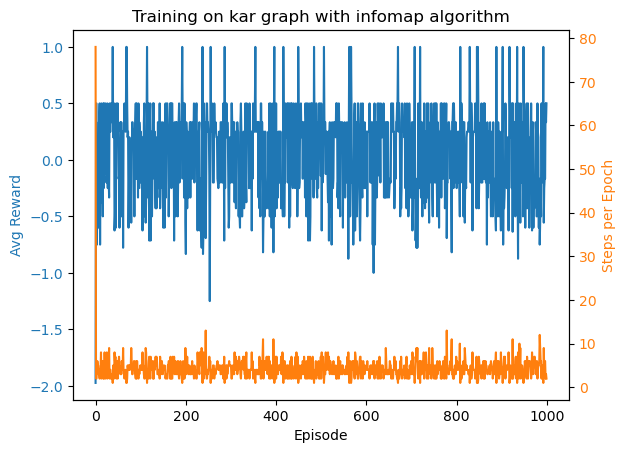

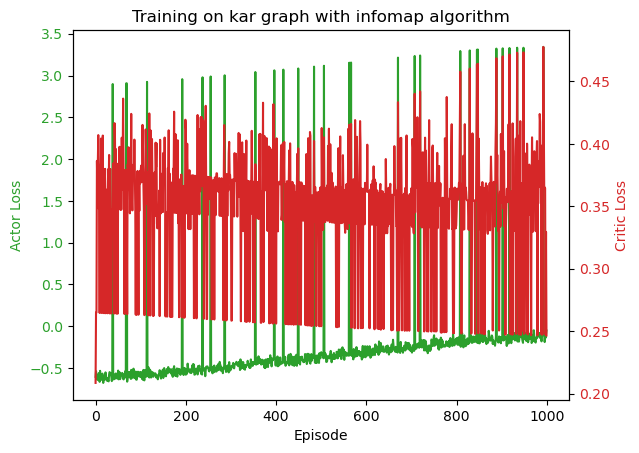

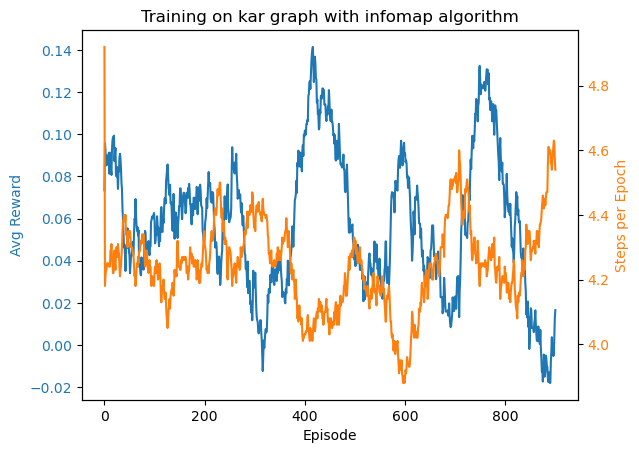

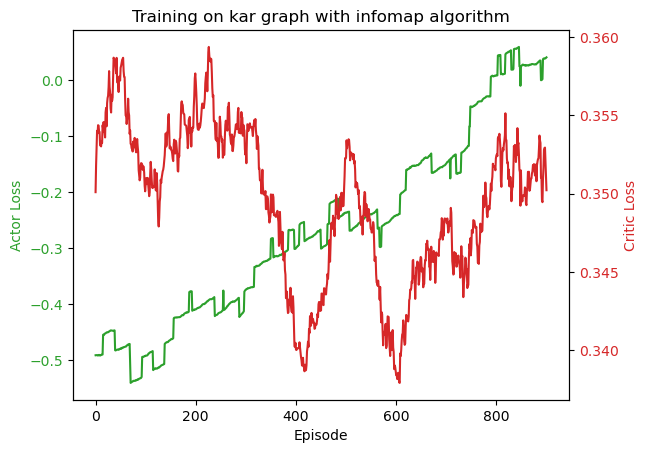

* ------------------ Model Hyperparameters ------------------
* Learning rate:  0.0001
* Gamma parameter:  0.3
* Lambda Metric:  0.001
* Alpha Metric:  0.3
* Value for clipping the loss function:  1.1920928955078125e-07


* Episode 1000 | Avg Reward: 0.20 | Avg Steps: 5 | Actor Loss: -0.07 | Critic Loss: 0.35: 100%|██████████| 1000/1000 [01:52<00:00,  8.90it/s]


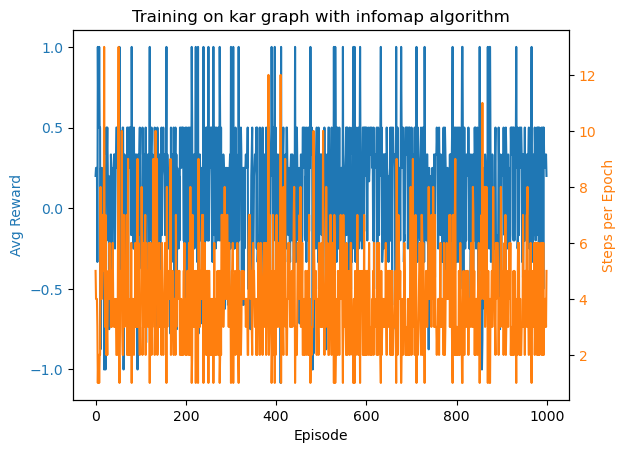

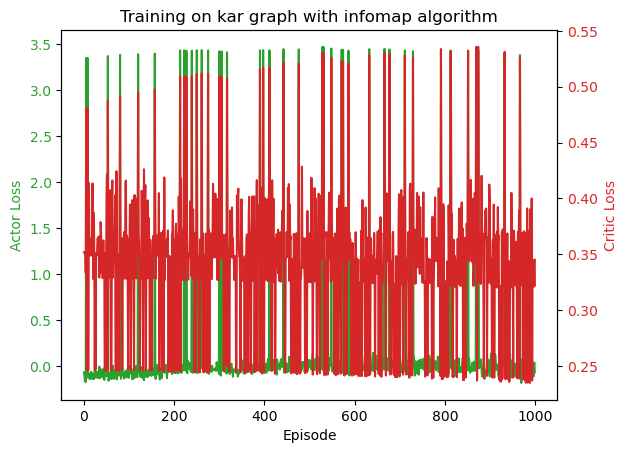

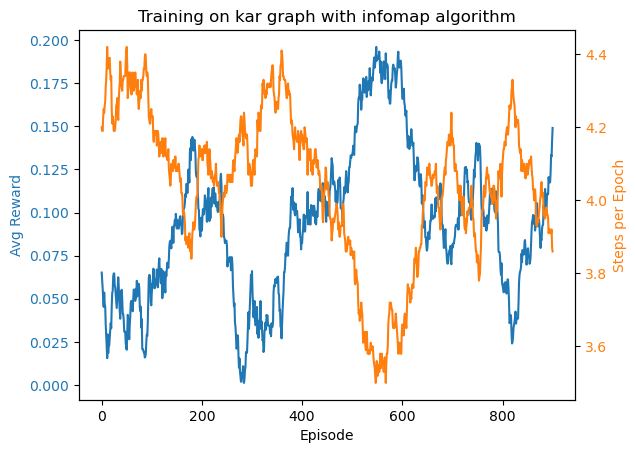

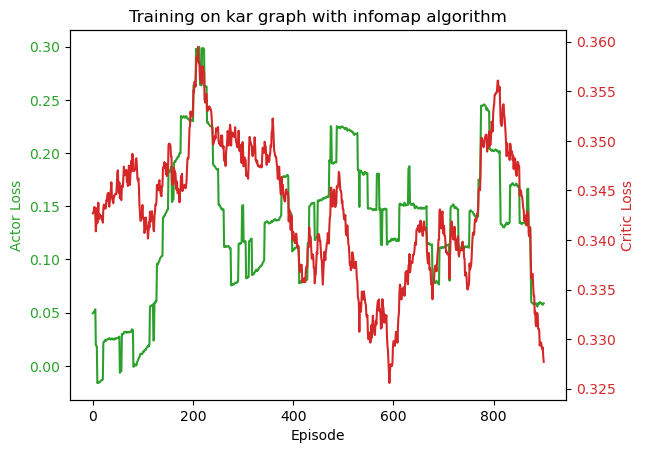

* ------------------ Model Hyperparameters ------------------
* Learning rate:  0.0001
* Gamma parameter:  0.3
* Lambda Metric:  0.001
* Alpha Metric:  0.5
* Value for clipping the loss function:  1.1920928955078125e-07


* Episode 1000 | Avg Reward: 0.17 | Avg Steps: 6 | Actor Loss: 0.05 | Critic Loss: 0.34: 100%|██████████| 1000/1000 [01:49<00:00,  9.16it/s] 


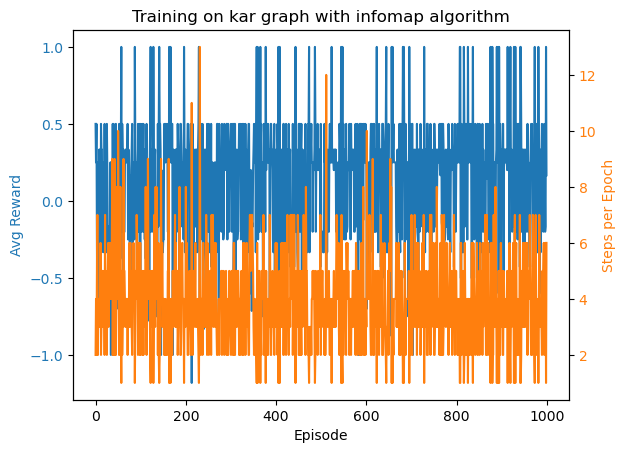

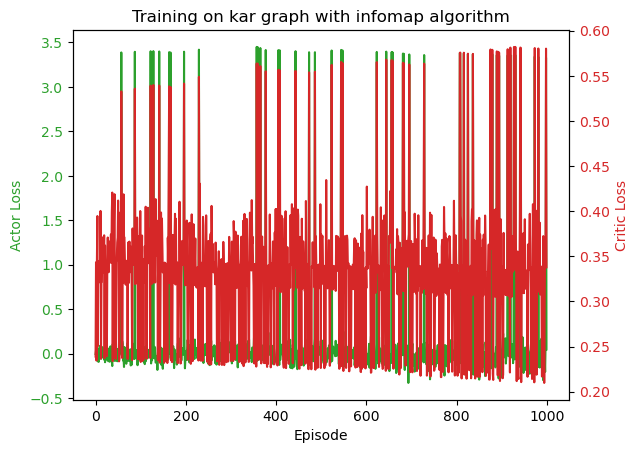

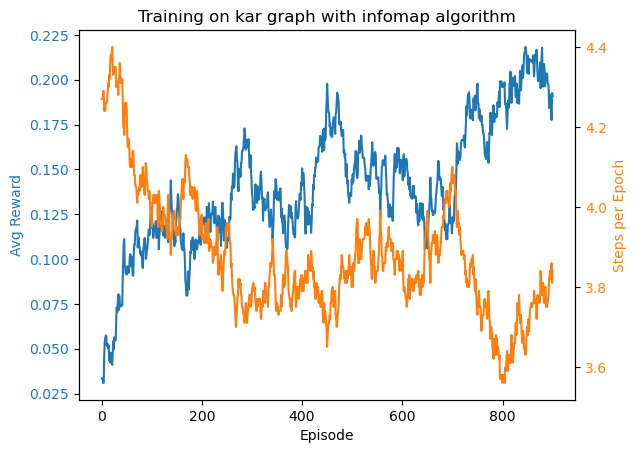

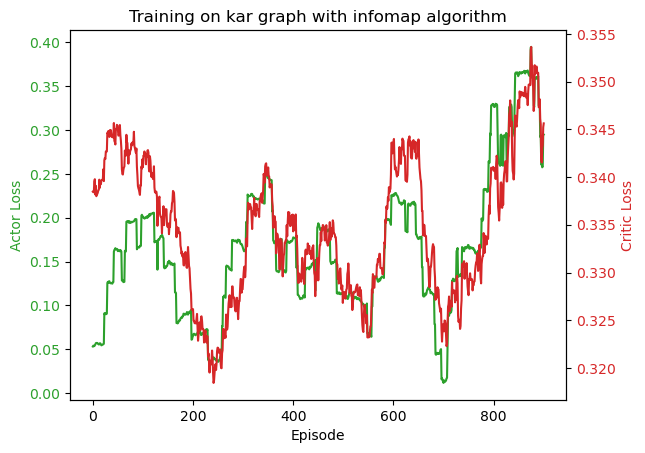

* ------------------ Model Hyperparameters ------------------
* Learning rate:  0.0001
* Gamma parameter:  0.3
* Lambda Metric:  0.001
* Alpha Metric:  0.7
* Value for clipping the loss function:  1.1920928955078125e-07


* Episode 1000 | Avg Reward: 0.17 | Avg Steps: 6 | Actor Loss: -0.15 | Critic Loss: 0.33: 100%|██████████| 1000/1000 [01:43<00:00,  9.68it/s]


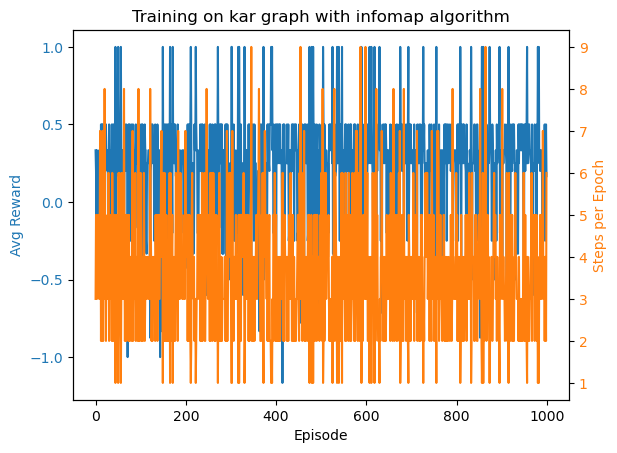

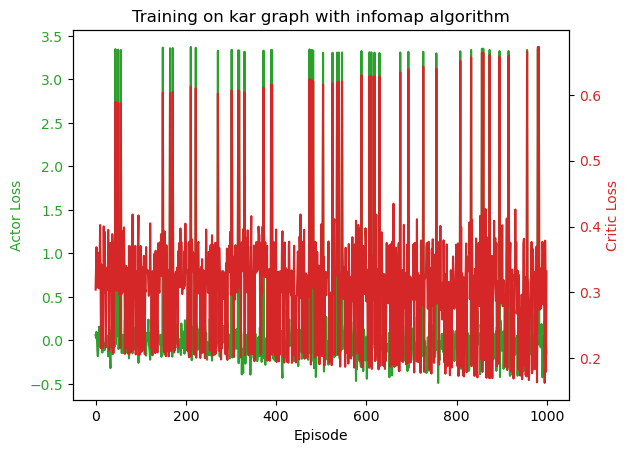

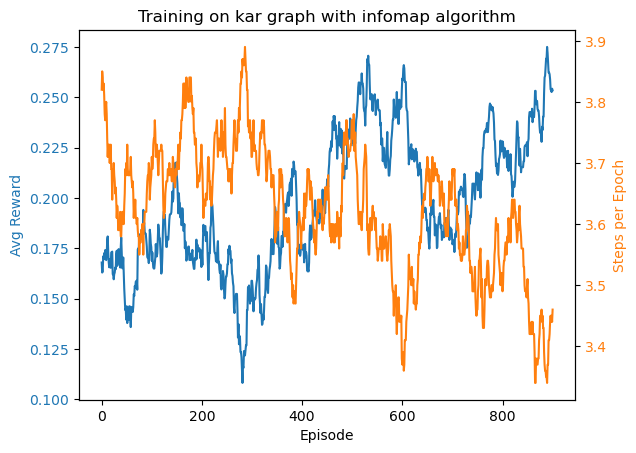

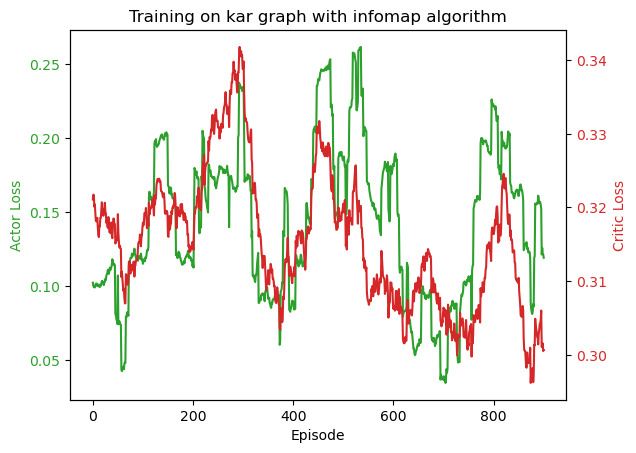

* ------------------ Model Hyperparameters ------------------
* Learning rate:  0.0001
* Gamma parameter:  0.3
* Lambda Metric:  0.001
* Alpha Metric:  0.9
* Value for clipping the loss function:  1.1920928955078125e-07


* Episode 1000 | Avg Reward: 0.25 | Avg Steps: 4 | Actor Loss: -0.03 | Critic Loss: 0.31: 100%|██████████| 1000/1000 [01:37<00:00, 10.22it/s]


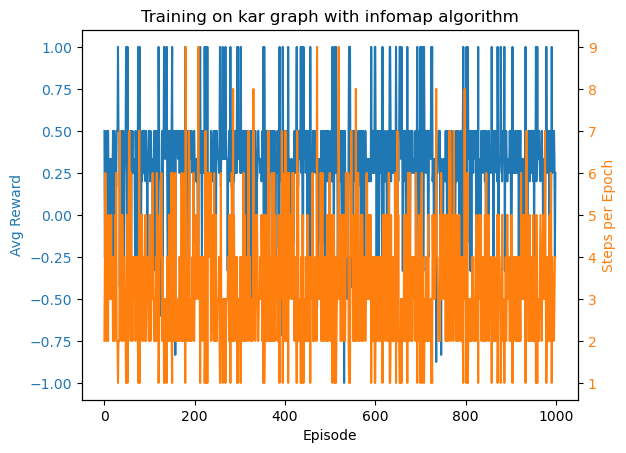

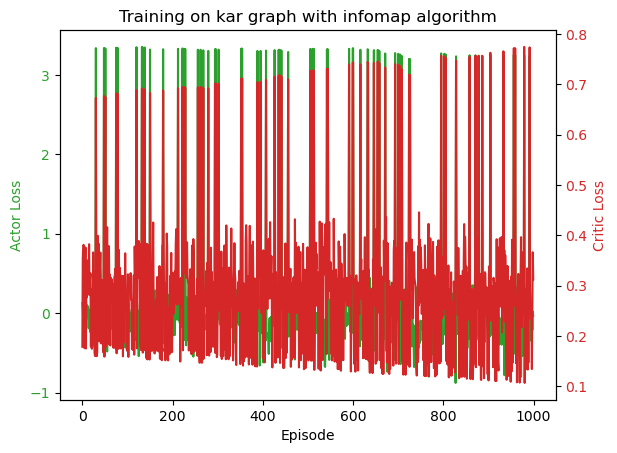

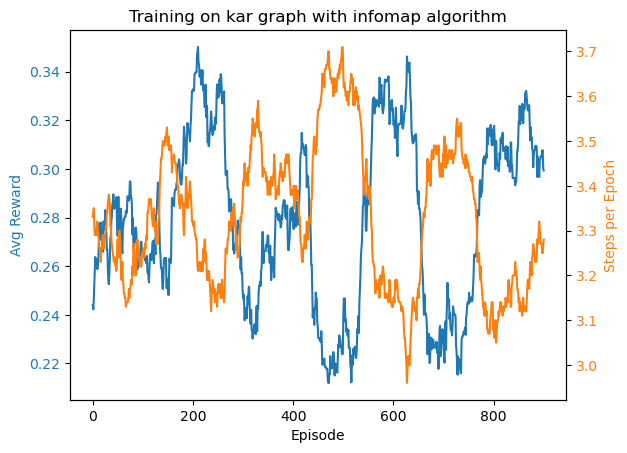

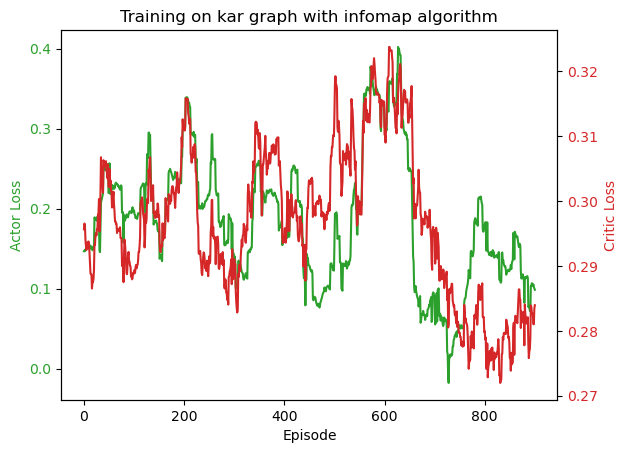

* ------------------ Model Hyperparameters ------------------
* Learning rate:  0.0001
* Gamma parameter:  0.3
* Lambda Metric:  0.01
* Alpha Metric:  0.1
* Value for clipping the loss function:  1.1920928955078125e-07


* Episode 1000 | Avg Reward: 0.33 | Avg Steps: 3 | Actor Loss: -0.33 | Critic Loss: 0.22: 100%|██████████| 1000/1000 [01:38<00:00, 10.16it/s]


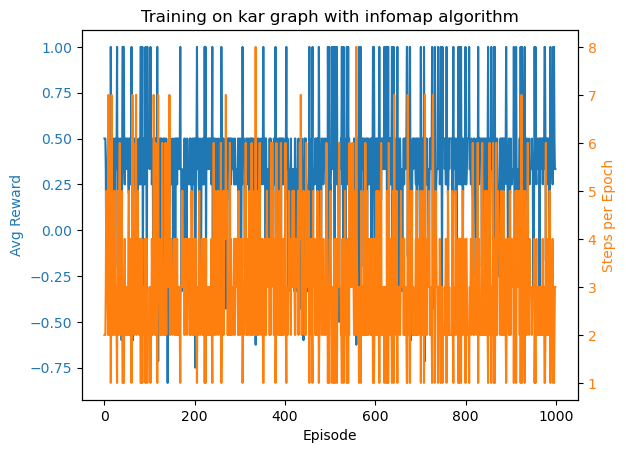

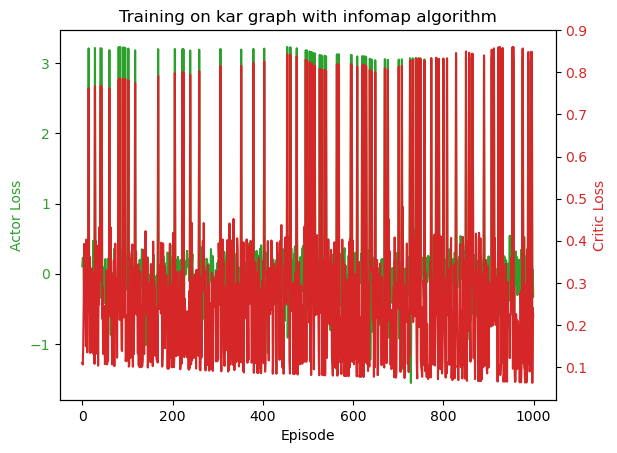

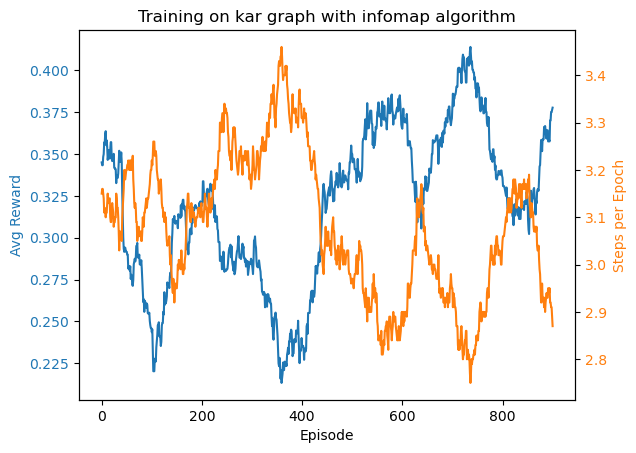

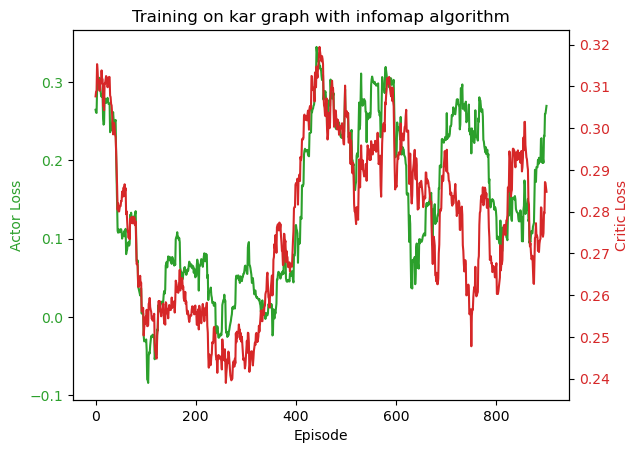

* ------------------ Model Hyperparameters ------------------
* Learning rate:  0.0001
* Gamma parameter:  0.3
* Lambda Metric:  0.01
* Alpha Metric:  0.3
* Value for clipping the loss function:  1.1920928955078125e-07


* Episode 1000 | Avg Reward: 0.50 | Avg Steps: 2 | Actor Loss: 0.04 | Critic Loss: 0.08: 100%|██████████| 1000/1000 [01:29<00:00, 11.22it/s]


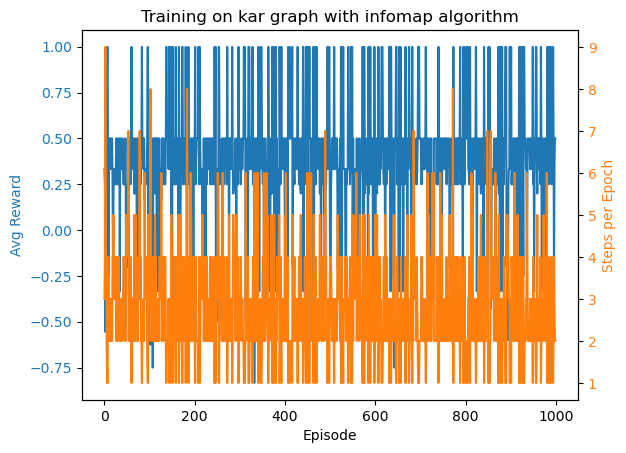

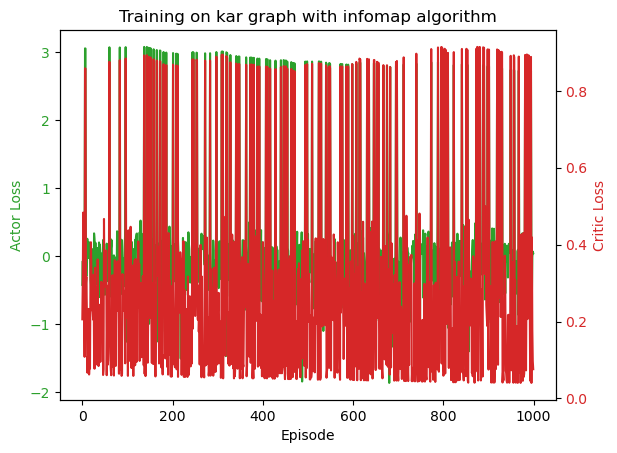

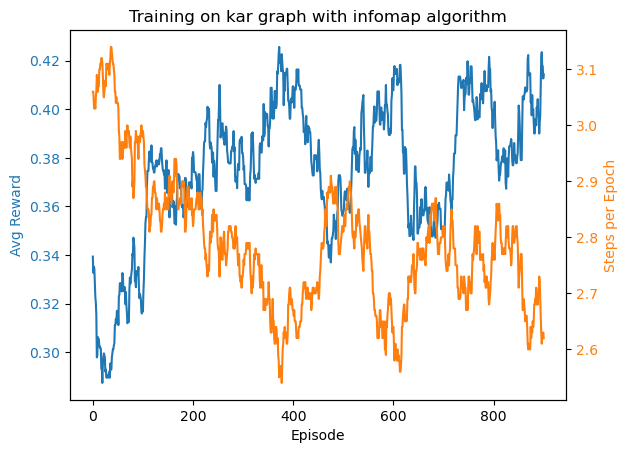

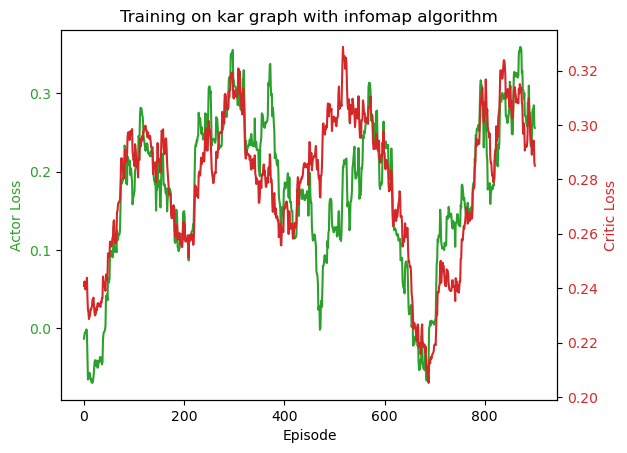

* ------------------ Model Hyperparameters ------------------
* Learning rate:  0.0001
* Gamma parameter:  0.3
* Lambda Metric:  0.01
* Alpha Metric:  0.5
* Value for clipping the loss function:  1.1920928955078125e-07


* Episode 1000 | Avg Reward: 0.50 | Avg Steps: 2 | Actor Loss: -0.35 | Critic Loss: 0.08: 100%|██████████| 1000/1000 [01:18<00:00, 12.79it/s]


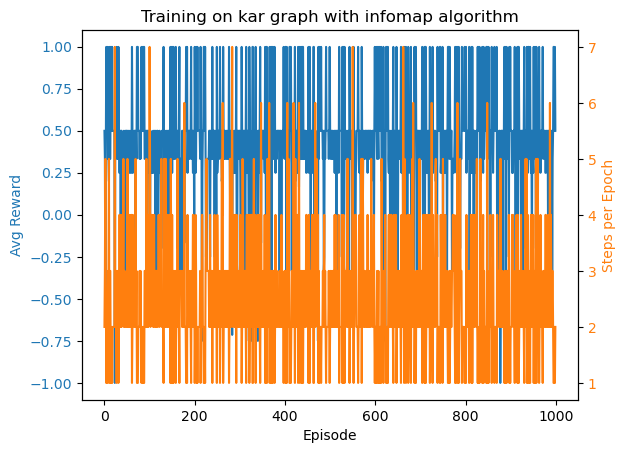

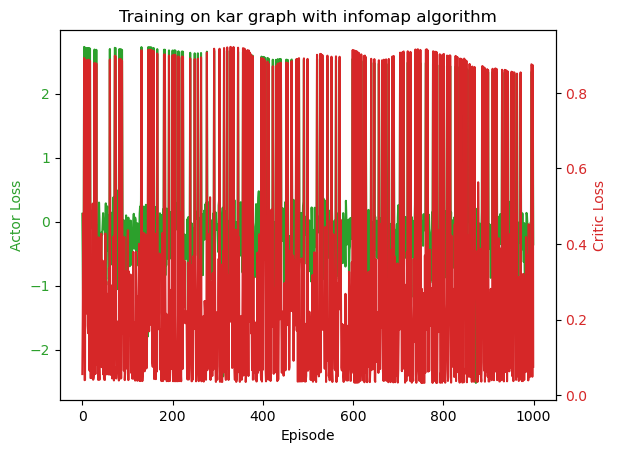

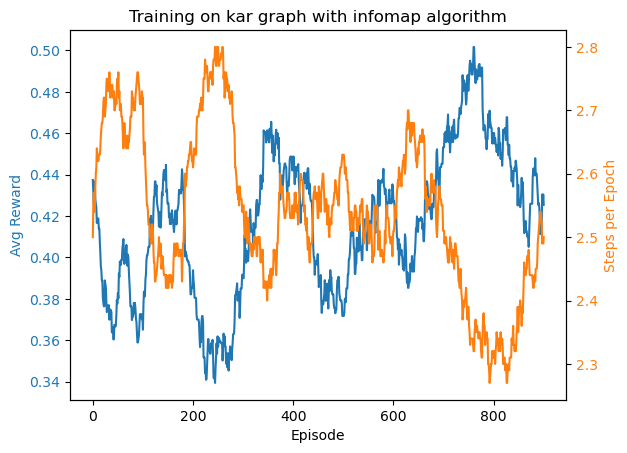

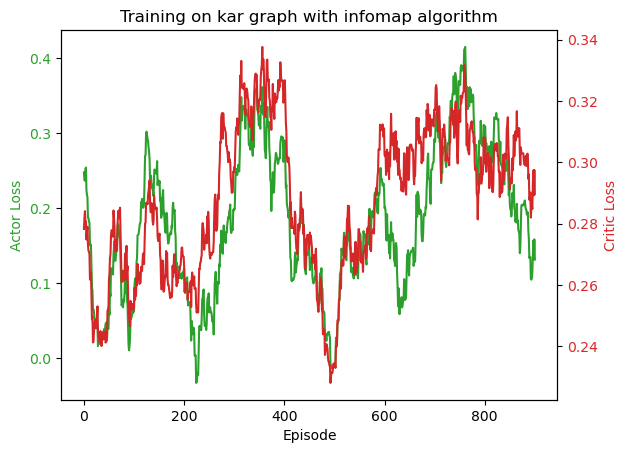

* ------------------ Model Hyperparameters ------------------
* Learning rate:  0.0001
* Gamma parameter:  0.3
* Lambda Metric:  0.01
* Alpha Metric:  0.7
* Value for clipping the loss function:  1.1920928955078125e-07


* Episode 1000 | Avg Reward: 0.50 | Avg Steps: 2 | Actor Loss: -0.45 | Critic Loss: 0.06: 100%|██████████| 1000/1000 [01:09<00:00, 14.38it/s]


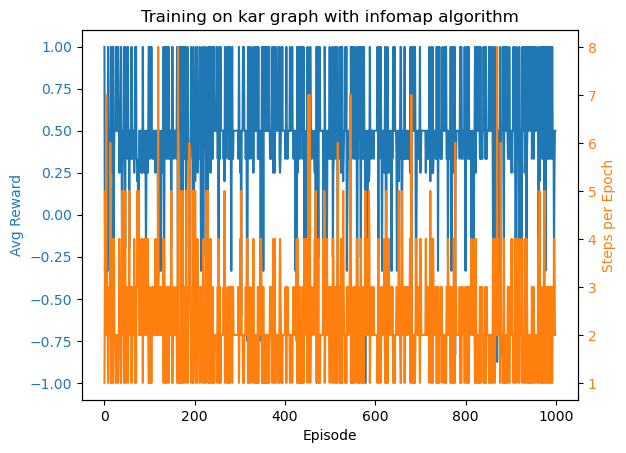

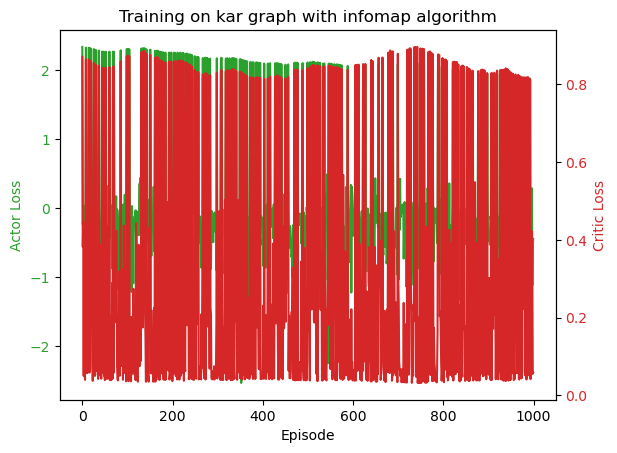

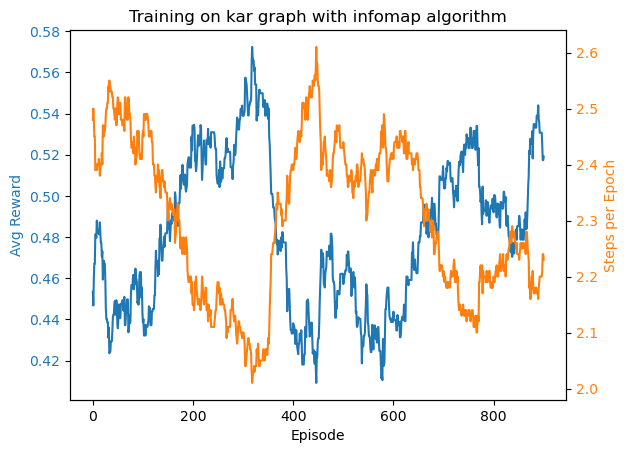

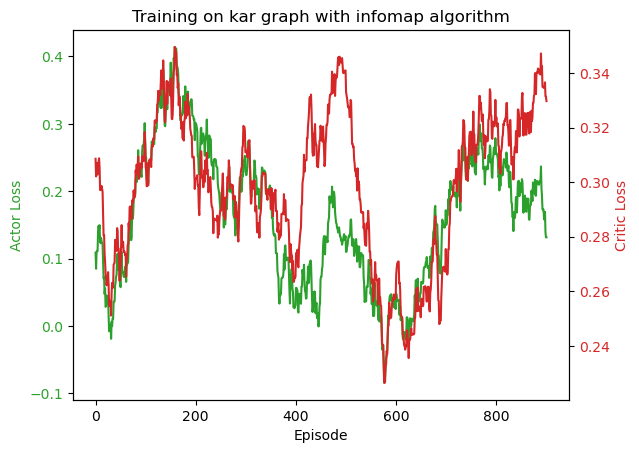

* ------------------ Model Hyperparameters ------------------
* Learning rate:  0.0001
* Gamma parameter:  0.3
* Lambda Metric:  0.01
* Alpha Metric:  0.9
* Value for clipping the loss function:  1.1920928955078125e-07


* Episode 1000 | Avg Reward: 1.00 | Avg Steps: 1 | Actor Loss: 1.47 | Critic Loss: 0.75: 100%|██████████| 1000/1000 [01:05<00:00, 15.25it/s]


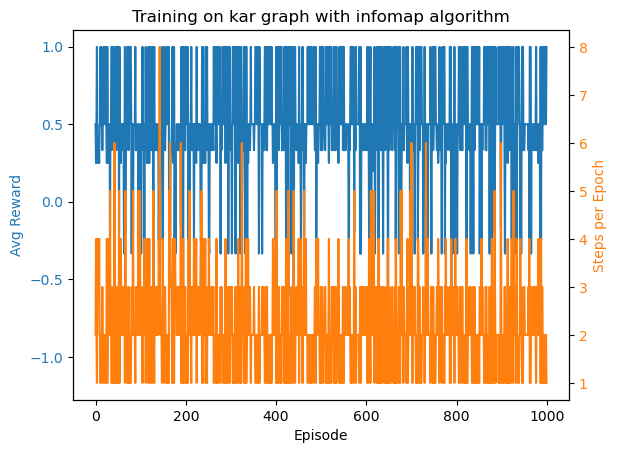

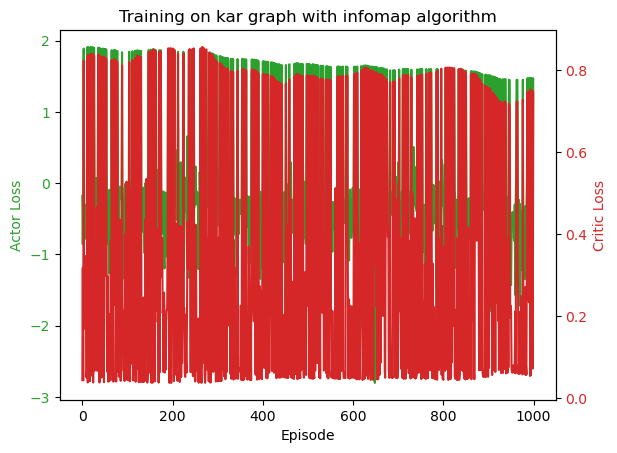

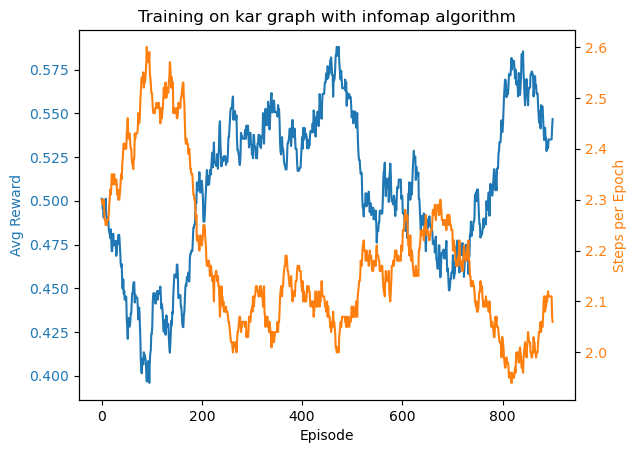

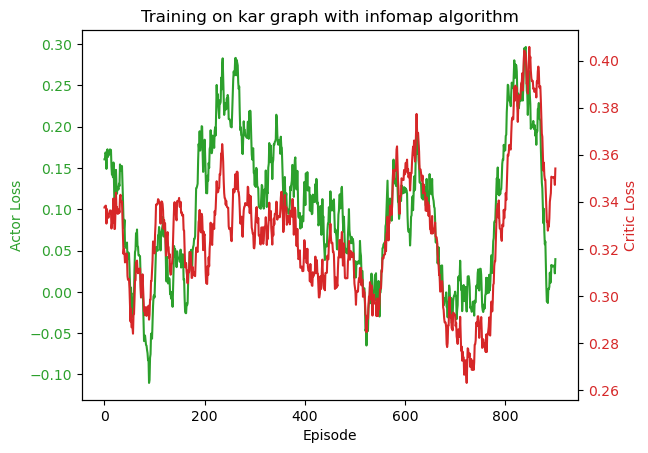

* ------------------ Model Hyperparameters ------------------
* Learning rate:  0.0001
* Gamma parameter:  0.3
* Lambda Metric:  0.1
* Alpha Metric:  0.1
* Value for clipping the loss function:  1.1920928955078125e-07


* Episode 1000 | Avg Reward: 0.50 | Avg Steps: 2 | Actor Loss: -0.47 | Critic Loss: 0.09: 100%|██████████| 1000/1000 [01:02<00:00, 15.89it/s]


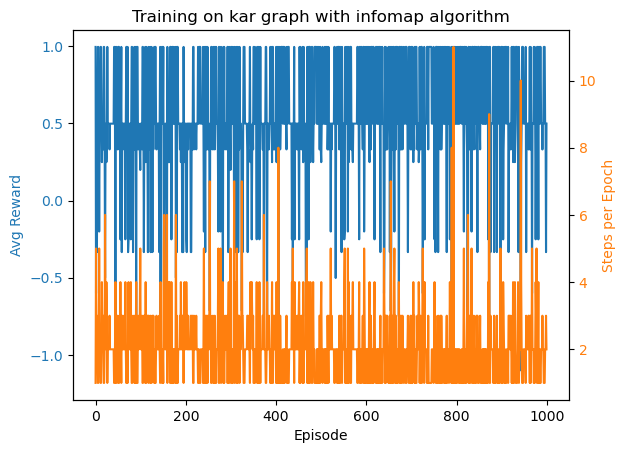

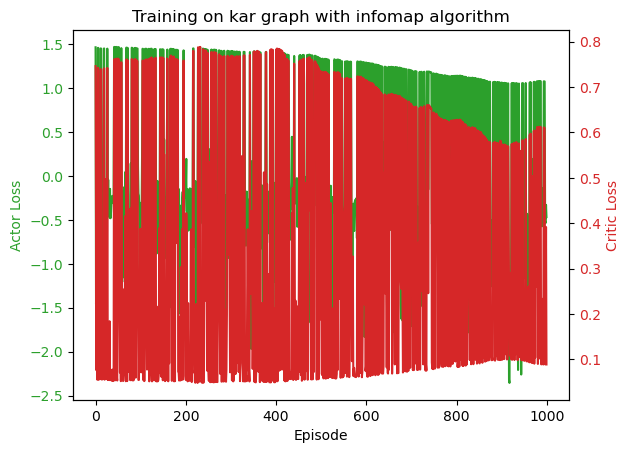

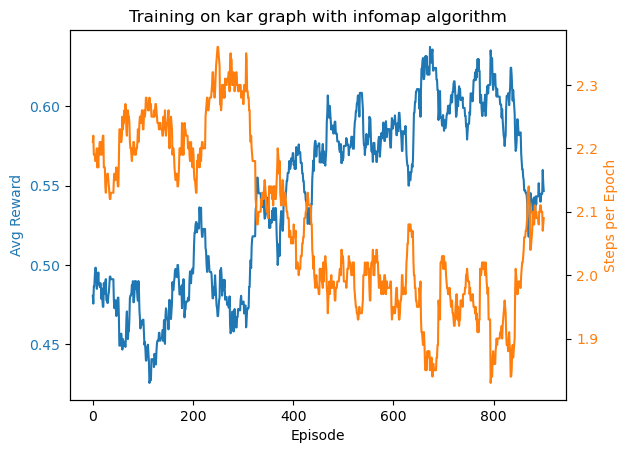

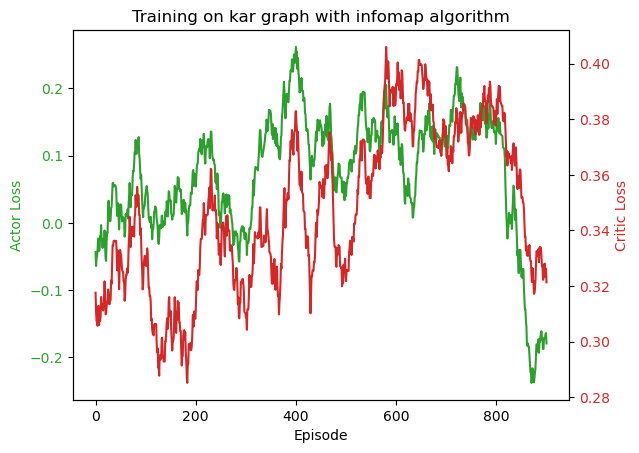

* ------------------ Model Hyperparameters ------------------
* Learning rate:  0.0001
* Gamma parameter:  0.3
* Lambda Metric:  0.1
* Alpha Metric:  0.3
* Value for clipping the loss function:  1.1920928955078125e-07


* Episode 1000 | Avg Reward: 0.50 | Avg Steps: 2 | Actor Loss: -0.68 | Critic Loss: 0.15: 100%|██████████| 1000/1000 [00:57<00:00, 17.50it/s]


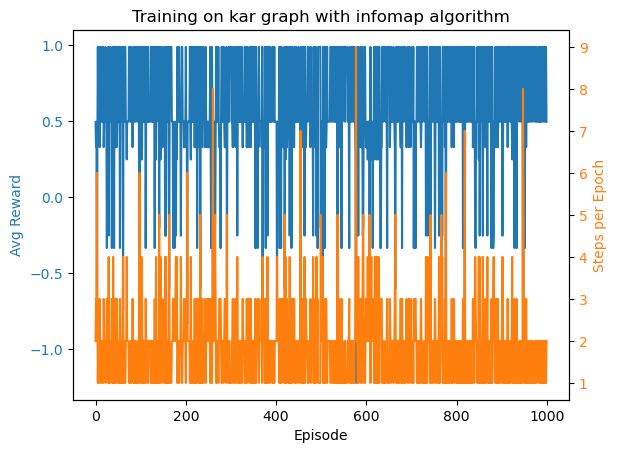

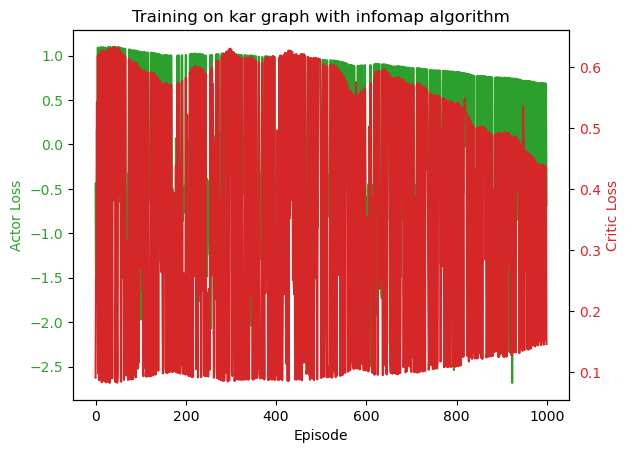

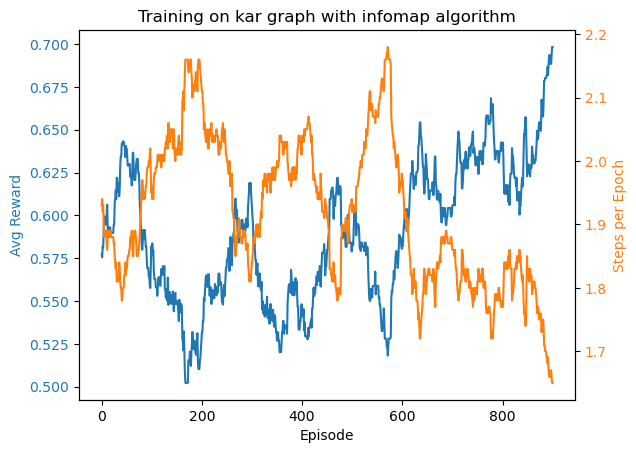

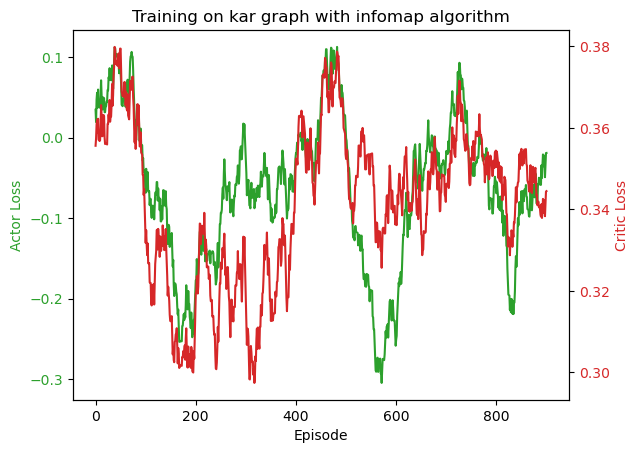

* ------------------ Model Hyperparameters ------------------
* Learning rate:  0.0001
* Gamma parameter:  0.3
* Lambda Metric:  0.1
* Alpha Metric:  0.5
* Value for clipping the loss function:  1.1920928955078125e-07


* Episode 1000 | Avg Reward: 0.50 | Avg Steps: 2 | Actor Loss: -2.01 | Critic Loss: 0.19: 100%|██████████| 1000/1000 [00:57<00:00, 17.43it/s]


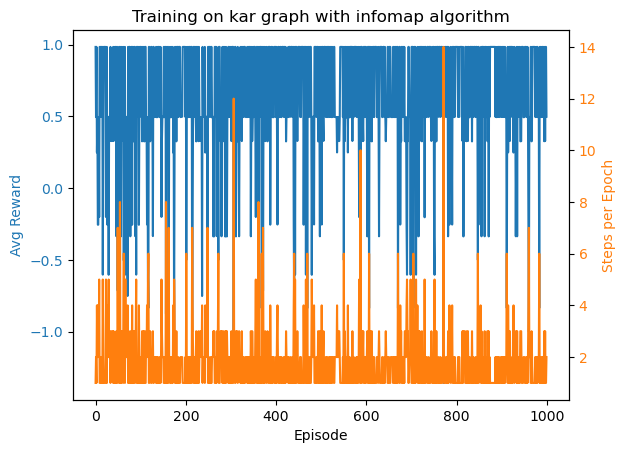

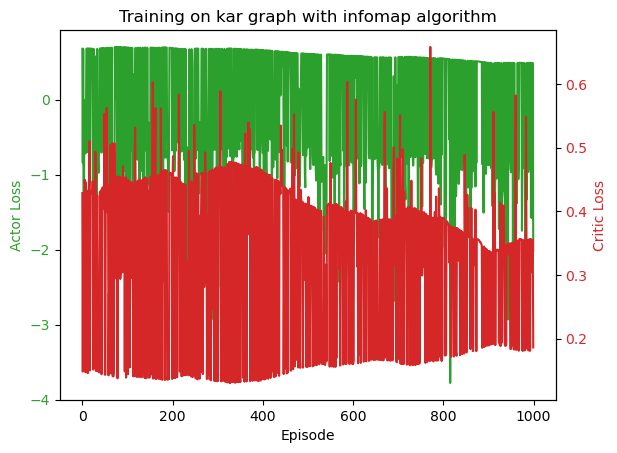

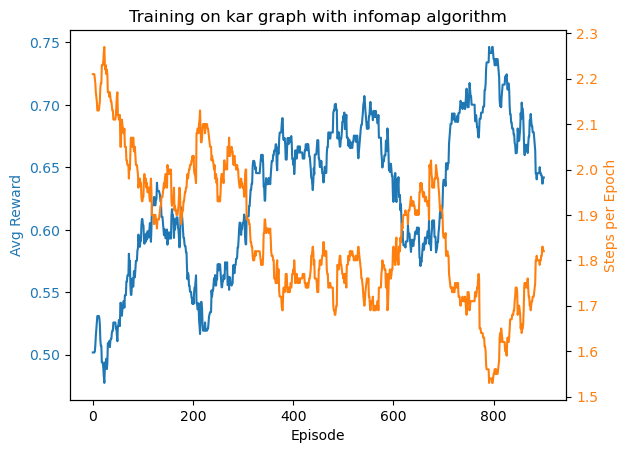

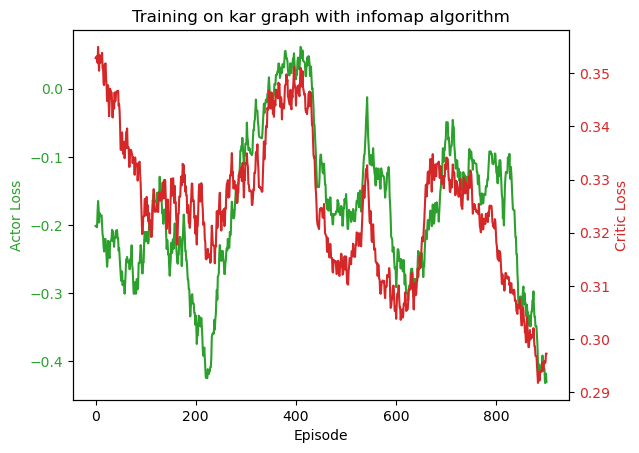

* ------------------ Model Hyperparameters ------------------
* Learning rate:  0.0001
* Gamma parameter:  0.3
* Lambda Metric:  0.1
* Alpha Metric:  0.7
* Value for clipping the loss function:  1.1920928955078125e-07


* Episode 1000 | Avg Reward: 0.98 | Avg Steps: 1 | Actor Loss: 0.32 | Critic Loss: 0.27: 100%|██████████| 1000/1000 [00:53<00:00, 18.75it/s]


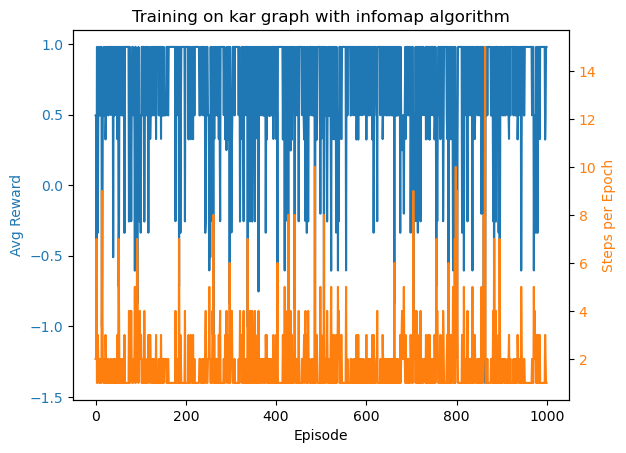

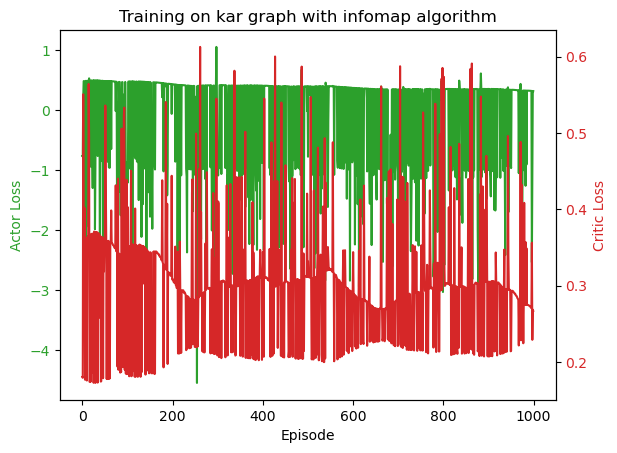

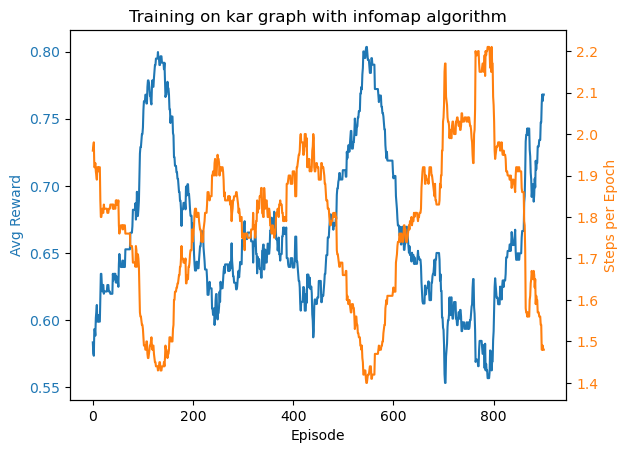

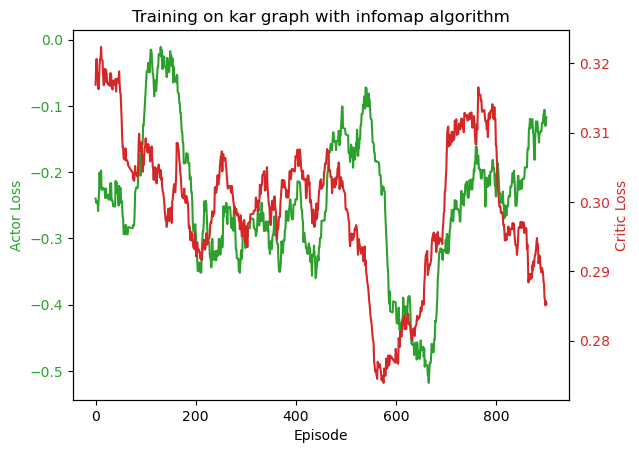

* ------------------ Model Hyperparameters ------------------
* Learning rate:  0.0001
* Gamma parameter:  0.3
* Lambda Metric:  0.1
* Alpha Metric:  0.9
* Value for clipping the loss function:  1.1920928955078125e-07


* Episode 1000 | Avg Reward: 0.97 | Avg Steps: 1 | Actor Loss: 0.23 | Critic Loss: 0.20: 100%|██████████| 1000/1000 [00:52<00:00, 19.06it/s]


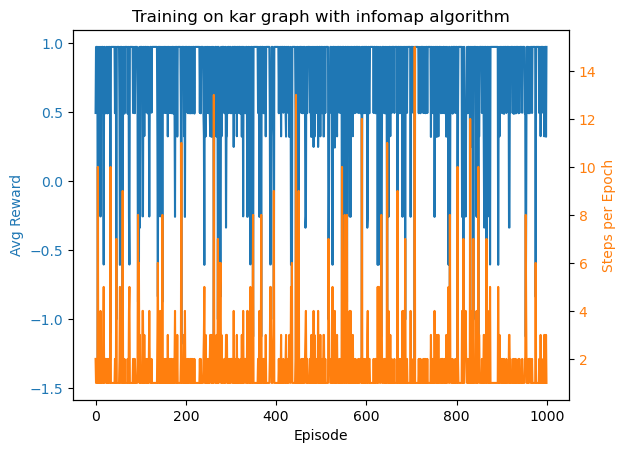

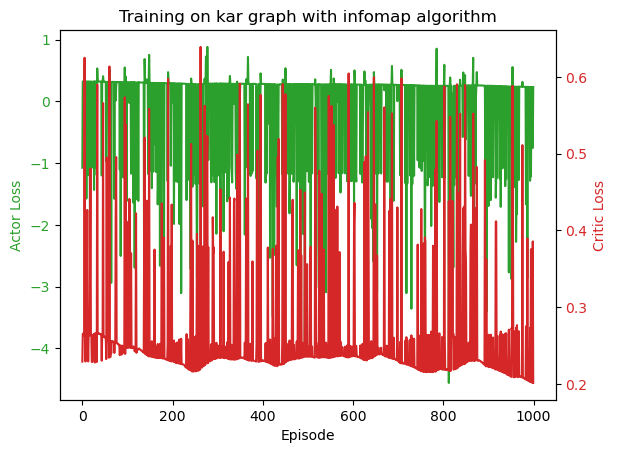

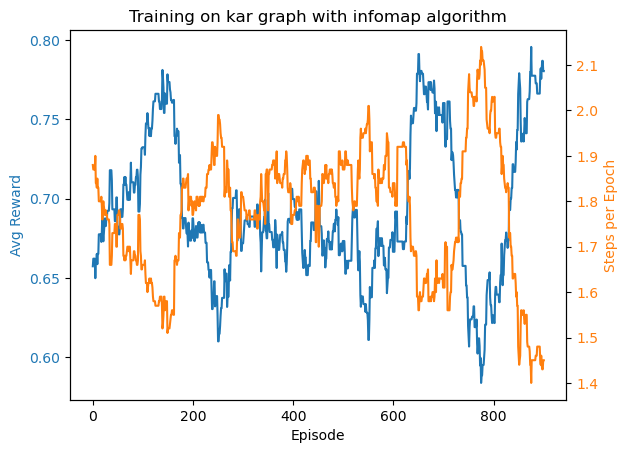

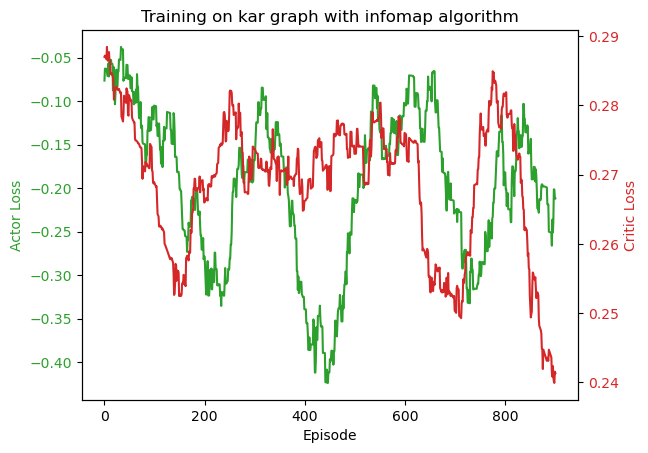

* ------------------ Model Hyperparameters ------------------
* Learning rate:  0.0001
* Gamma parameter:  0.3
* Lambda Metric:  1
* Alpha Metric:  0.1
* Value for clipping the loss function:  1.1920928955078125e-07


* Episode 1000 | Avg Reward: 0.96 | Avg Steps: 1 | Actor Loss: 0.16 | Critic Loss: 0.15: 100%|██████████| 1000/1000 [00:50<00:00, 19.78it/s] 


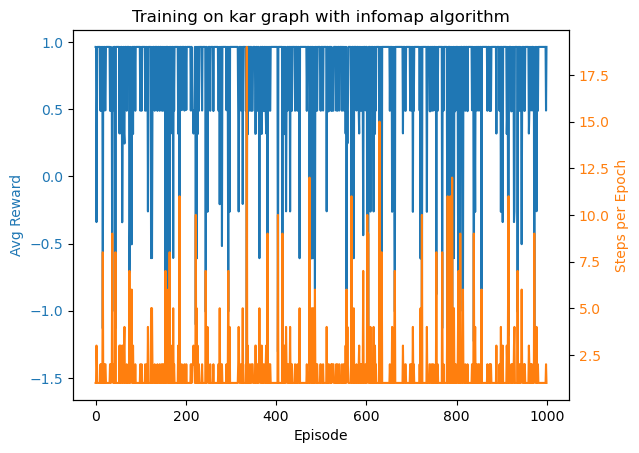

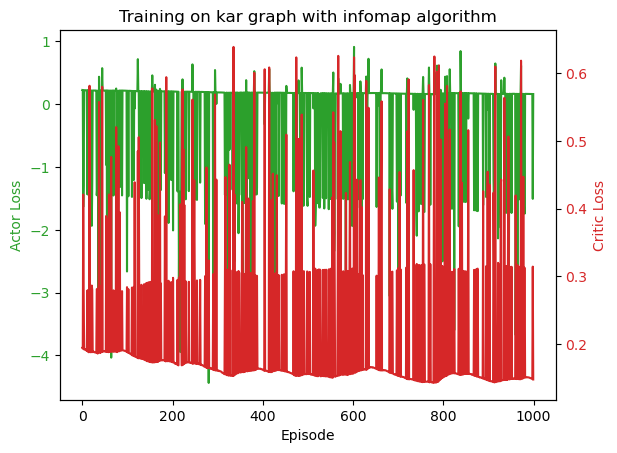

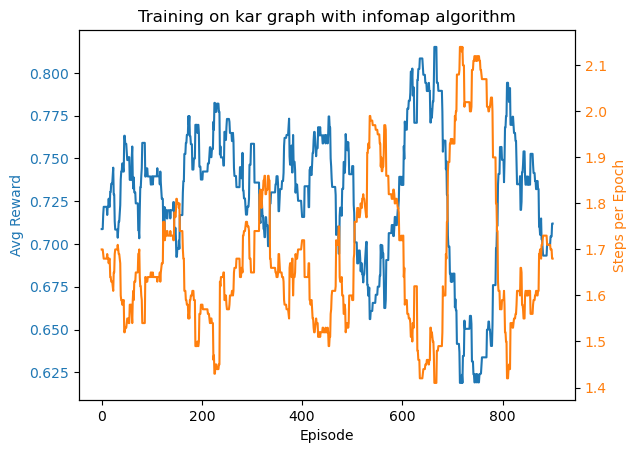

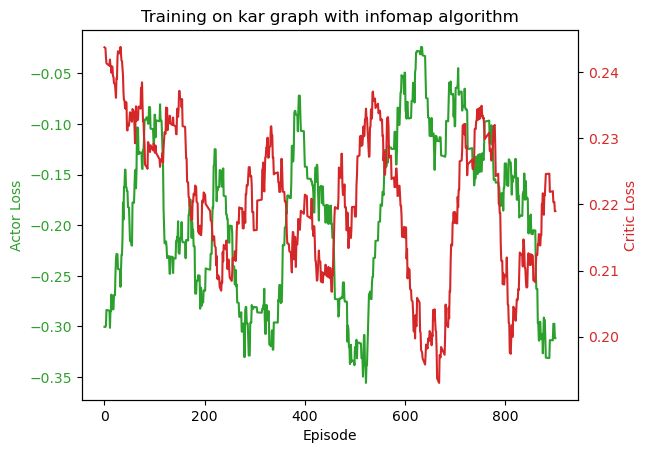

* ------------------ Model Hyperparameters ------------------
* Learning rate:  0.0001
* Gamma parameter:  0.3
* Lambda Metric:  1
* Alpha Metric:  0.3
* Value for clipping the loss function:  1.1920928955078125e-07


* Episode 1000 | Avg Reward: -1.25 | Avg Steps: 12 | Actor Loss: 0.75 | Critic Loss: 0.57: 100%|██████████| 1000/1000 [00:53<00:00, 18.86it/s]


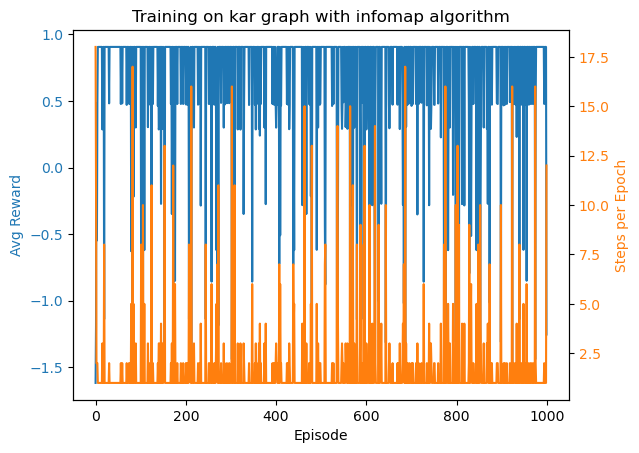

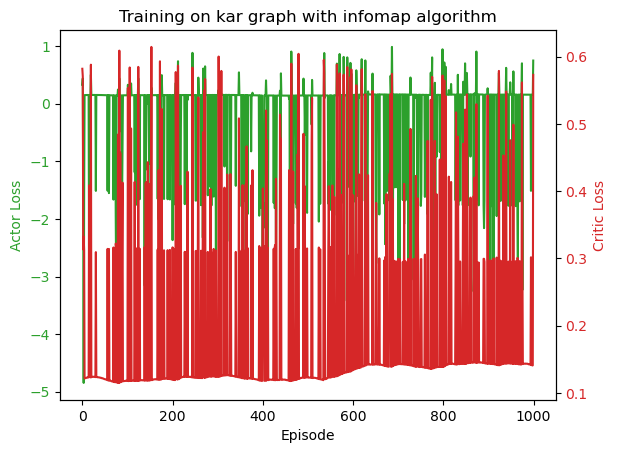

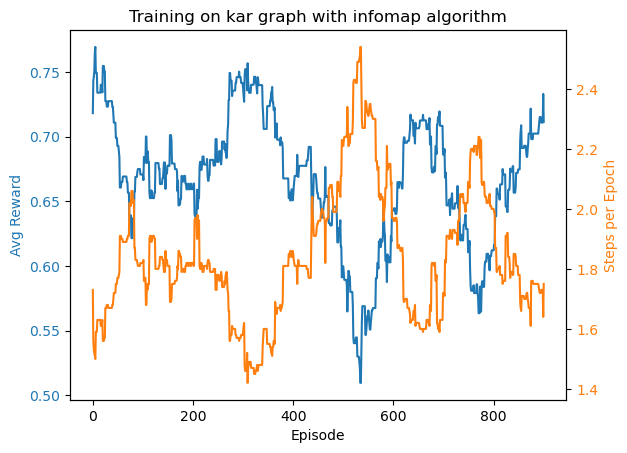

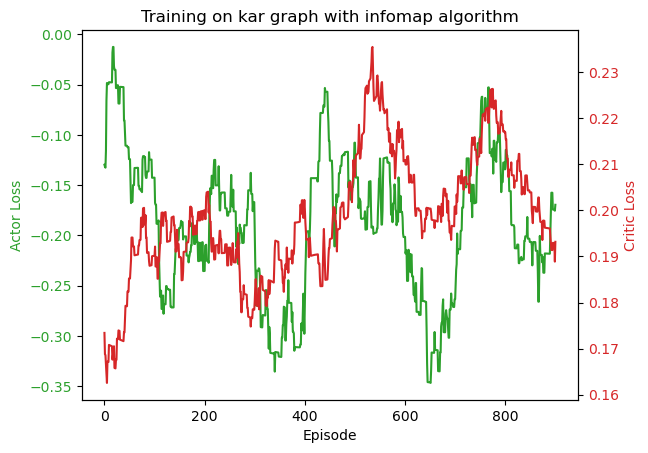

* ------------------ Model Hyperparameters ------------------
* Learning rate:  0.0001
* Gamma parameter:  0.3
* Lambda Metric:  1
* Alpha Metric:  0.5
* Value for clipping the loss function:  1.1920928955078125e-07


* Episode 1000 | Avg Reward: 0.85 | Avg Steps: 1 | Actor Loss: 0.17 | Critic Loss: 0.14: 100%|██████████| 1000/1000 [00:57<00:00, 17.46it/s]


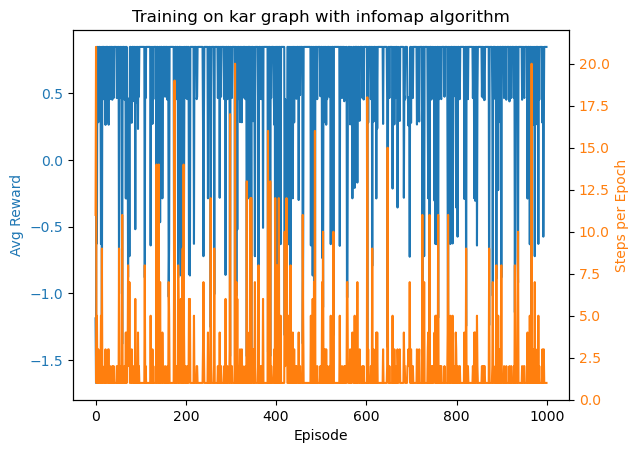

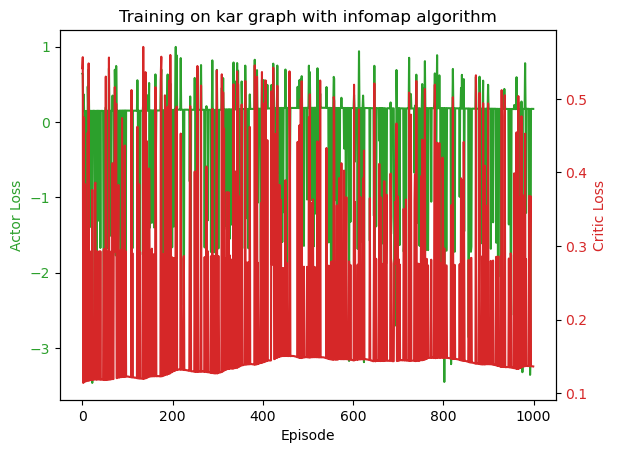

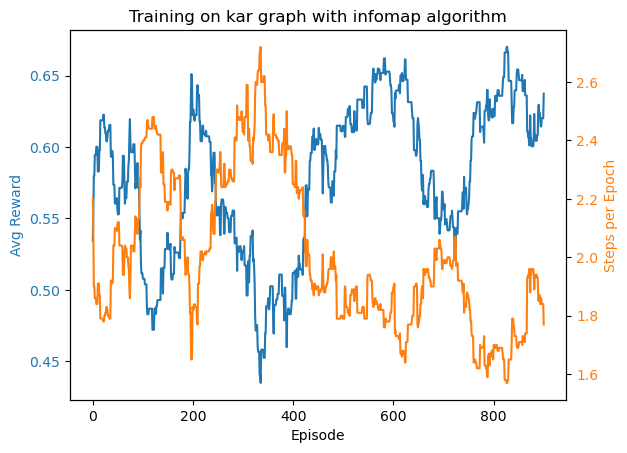

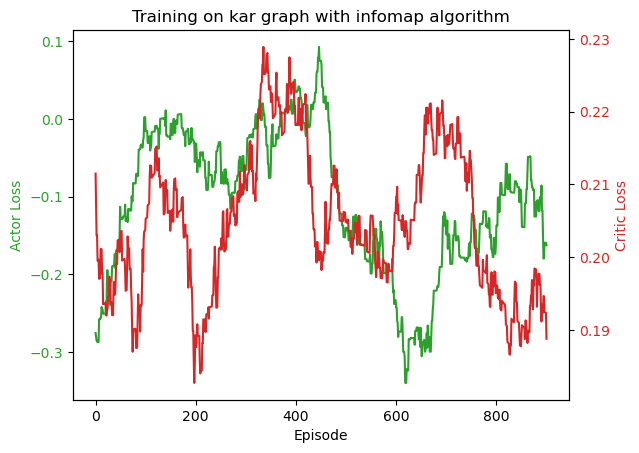

* ------------------ Model Hyperparameters ------------------
* Learning rate:  0.0001
* Gamma parameter:  0.3
* Lambda Metric:  1
* Alpha Metric:  0.7
* Value for clipping the loss function:  1.1920928955078125e-07


* Episode 1000 | Avg Reward: 0.79 | Avg Steps: 1 | Actor Loss: 0.18 | Critic Loss: 0.13: 100%|██████████| 1000/1000 [00:58<00:00, 17.08it/s]


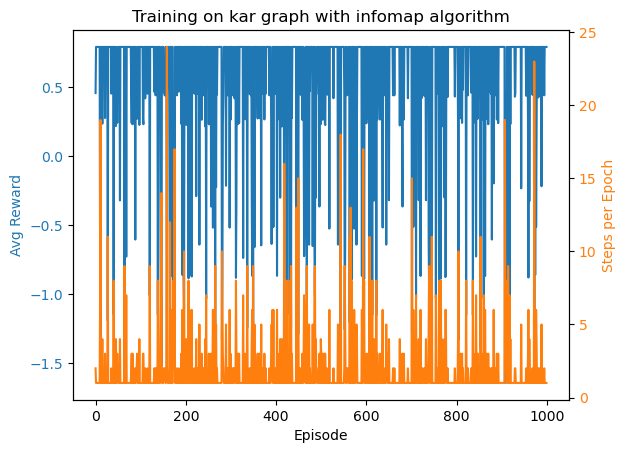

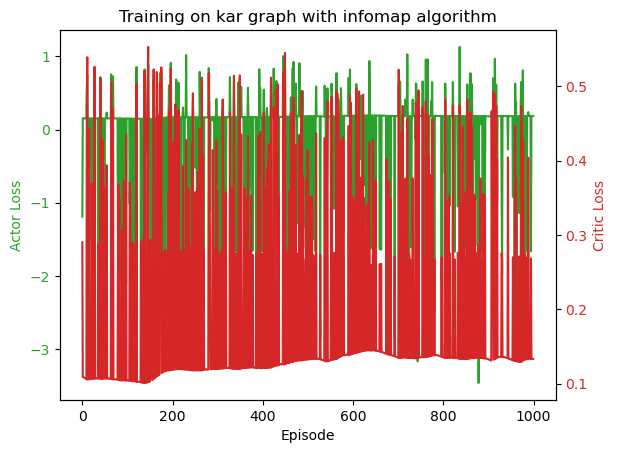

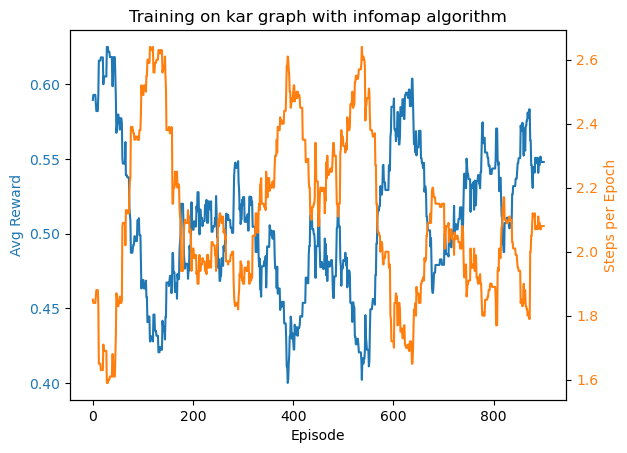

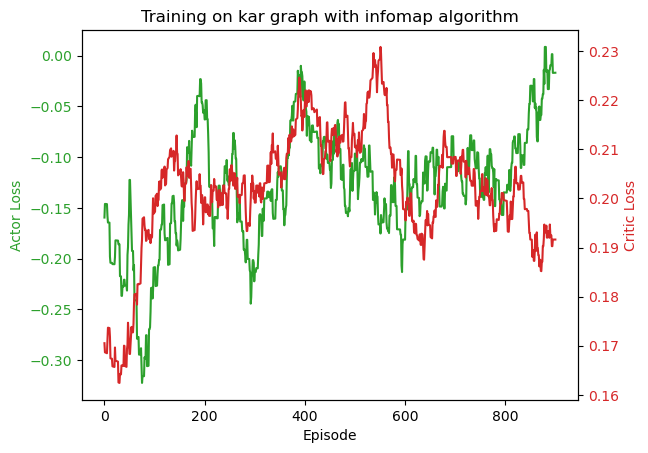

* ------------------ Model Hyperparameters ------------------
* Learning rate:  0.0001
* Gamma parameter:  0.3
* Lambda Metric:  1
* Alpha Metric:  0.9
* Value for clipping the loss function:  1.1920928955078125e-07


* Episode 1000 | Avg Reward: 0.74 | Avg Steps: 1 | Actor Loss: 0.15 | Critic Loss: 0.10: 100%|██████████| 1000/1000 [00:53<00:00, 18.58it/s]


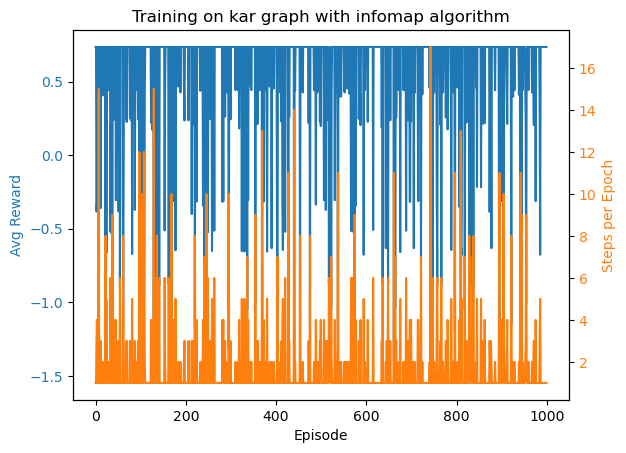

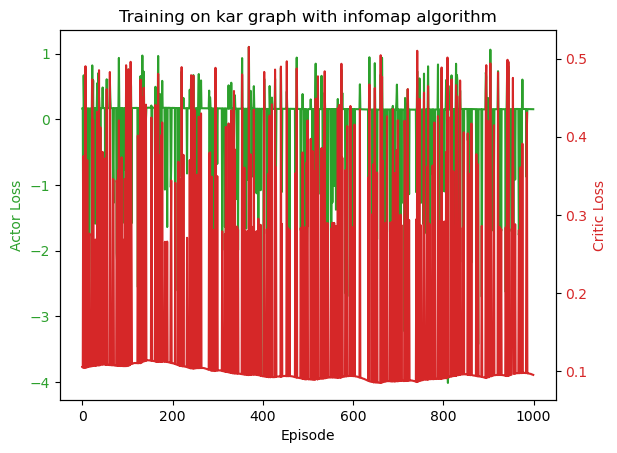

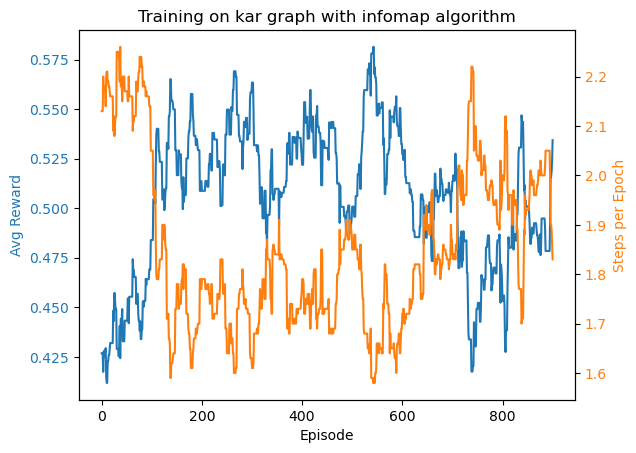

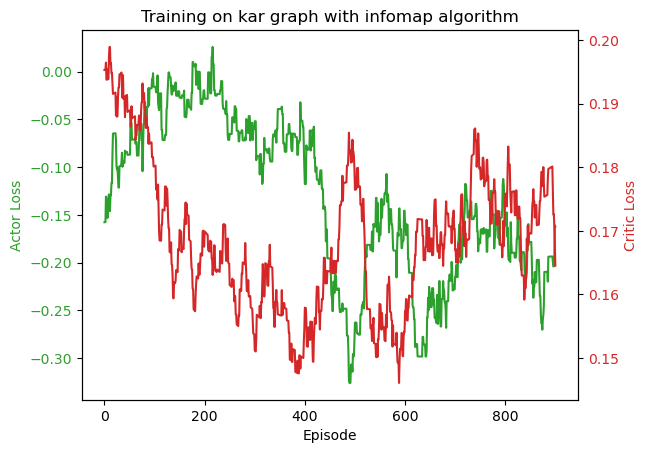

* ------------------ Model Hyperparameters ------------------
* Learning rate:  0.0001
* Gamma parameter:  0.3
* Lambda Metric:  10
* Alpha Metric:  0.1
* Value for clipping the loss function:  1.1920928955078125e-07


* Episode 1000 | Avg Reward: 0.63 | Avg Steps: 1 | Actor Loss: 0.17 | Critic Loss: 0.09: 100%|██████████| 1000/1000 [01:01<00:00, 16.31it/s]


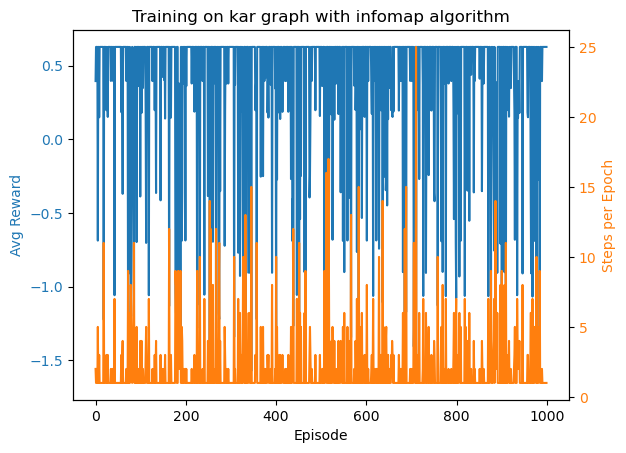

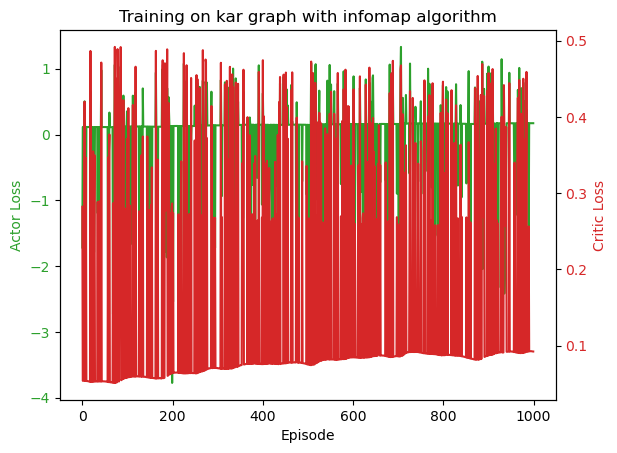

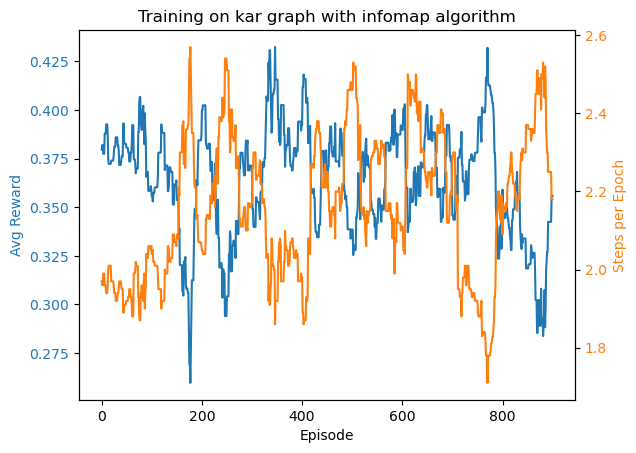

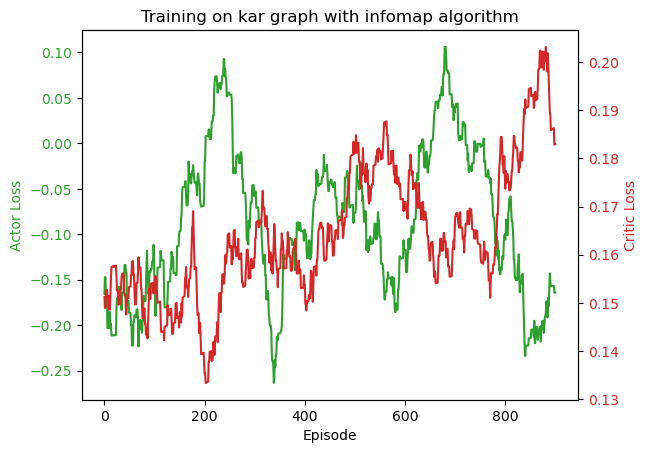

* ------------------ Model Hyperparameters ------------------
* Learning rate:  0.0001
* Gamma parameter:  0.3
* Lambda Metric:  10
* Alpha Metric:  0.3
* Value for clipping the loss function:  1.1920928955078125e-07


* Episode 1000 | Avg Reward: 0.06 | Avg Steps: 1 | Actor Loss: 0.04 | Critic Loss: 0.00: 100%|██████████| 1000/1000 [01:04<00:00, 15.62it/s]


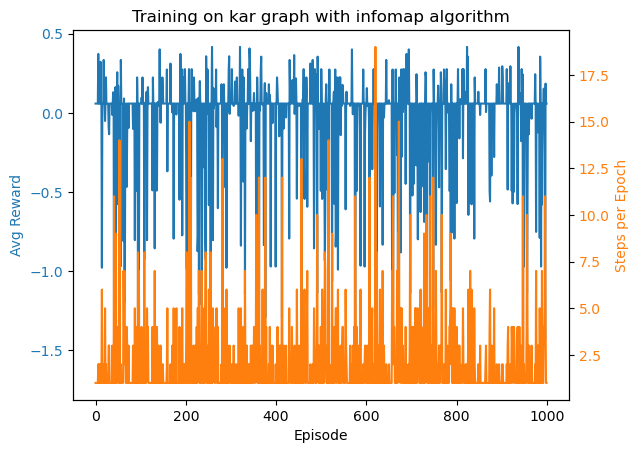

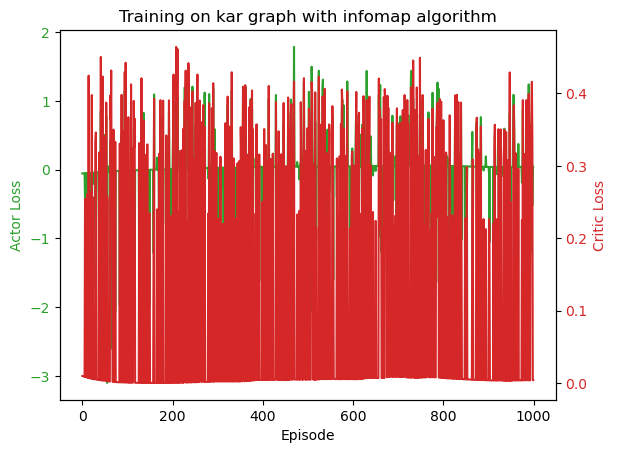

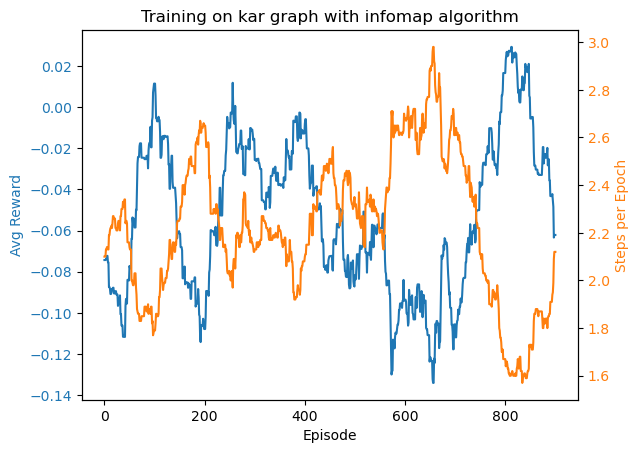

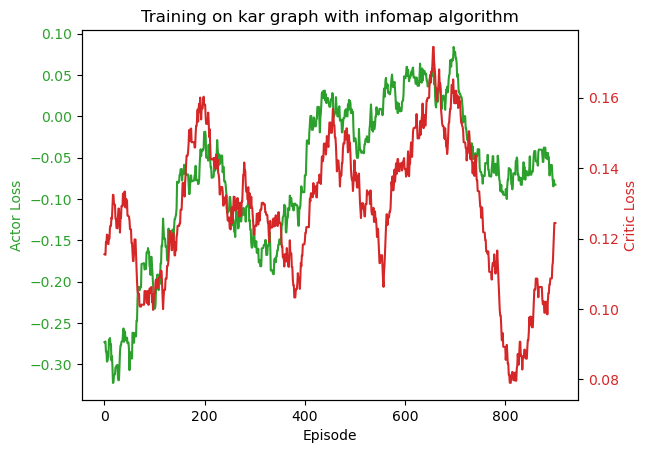

* ------------------ Model Hyperparameters ------------------
* Learning rate:  0.0001
* Gamma parameter:  0.3
* Lambda Metric:  10
* Alpha Metric:  0.5
* Value for clipping the loss function:  1.1920928955078125e-07


* Episode 1000 | Avg Reward: -0.51 | Avg Steps: 1 | Actor Loss: -0.16 | Critic Loss: 0.03: 100%|██████████| 1000/1000 [01:05<00:00, 15.20it/s]


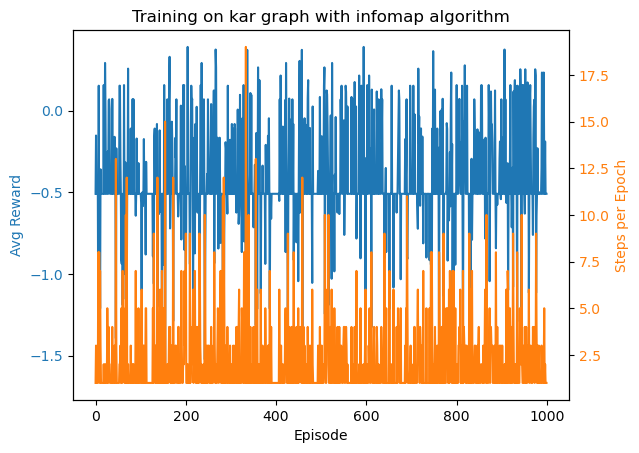

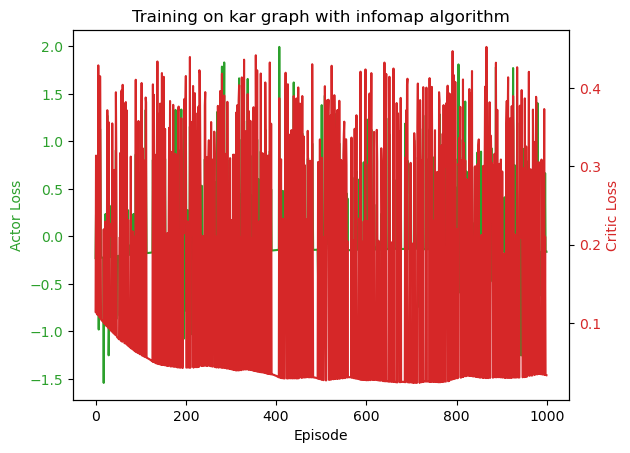

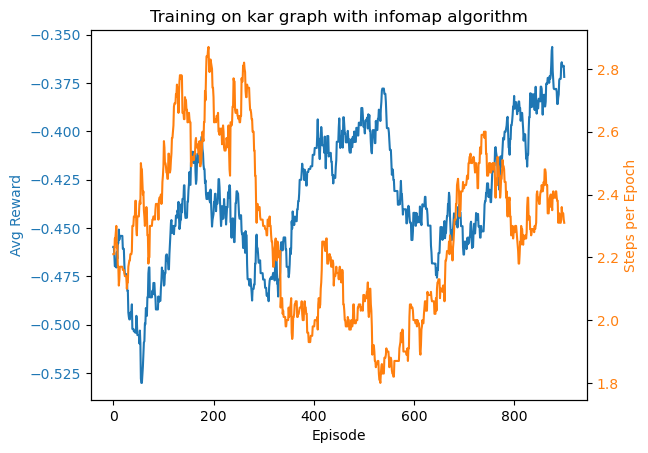

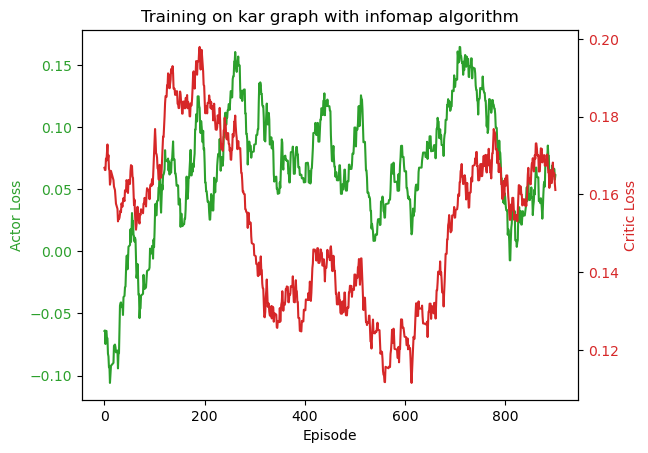

* ------------------ Model Hyperparameters ------------------
* Learning rate:  0.0001
* Gamma parameter:  0.3
* Lambda Metric:  10
* Alpha Metric:  0.7
* Value for clipping the loss function:  1.1920928955078125e-07


* Episode 1000 | Avg Reward: -1.08 | Avg Steps: 1 | Actor Loss: -0.49 | Critic Loss: 0.18: 100%|██████████| 1000/1000 [01:09<00:00, 14.39it/s]


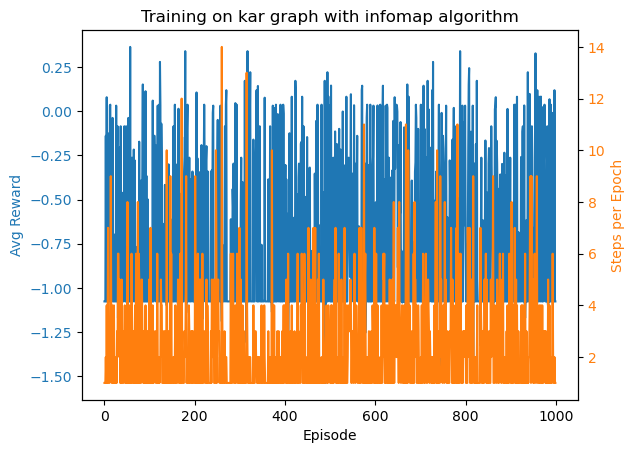

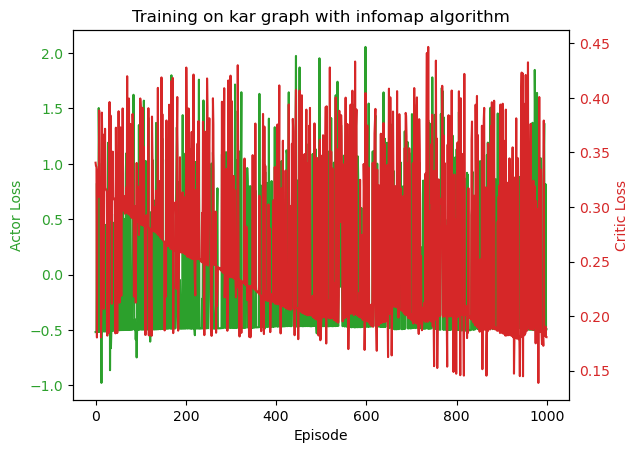

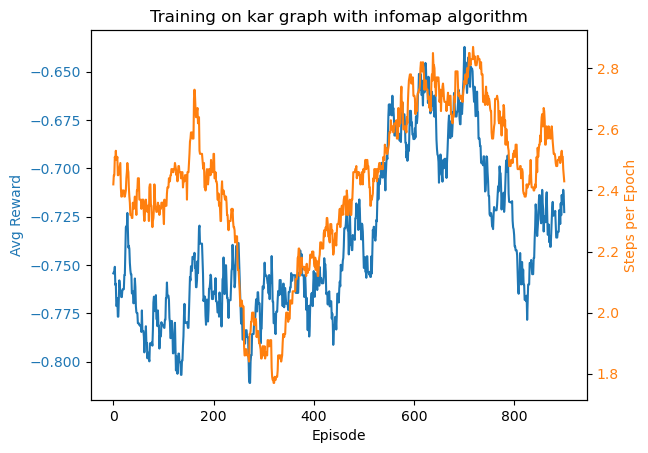

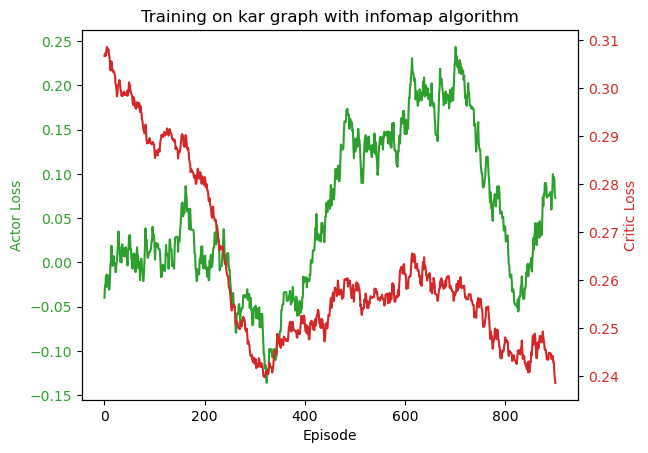

* ------------------ Model Hyperparameters ------------------
* Learning rate:  0.0001
* Gamma parameter:  0.3
* Lambda Metric:  10
* Alpha Metric:  0.9
* Value for clipping the loss function:  1.1920928955078125e-07


* Episode 1000 | Avg Reward: -0.46 | Avg Steps: 5 | Actor Loss: 0.84 | Critic Loss: 0.35: 100%|██████████| 1000/1000 [01:12<00:00, 13.80it/s]


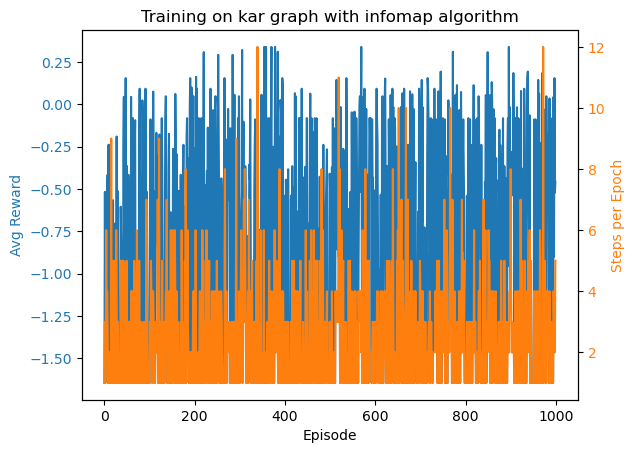

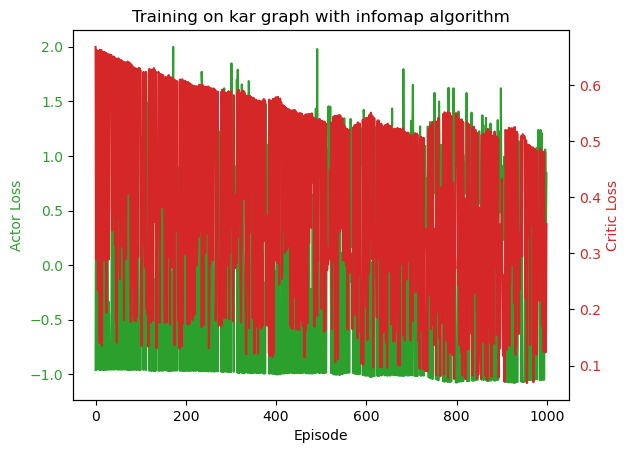

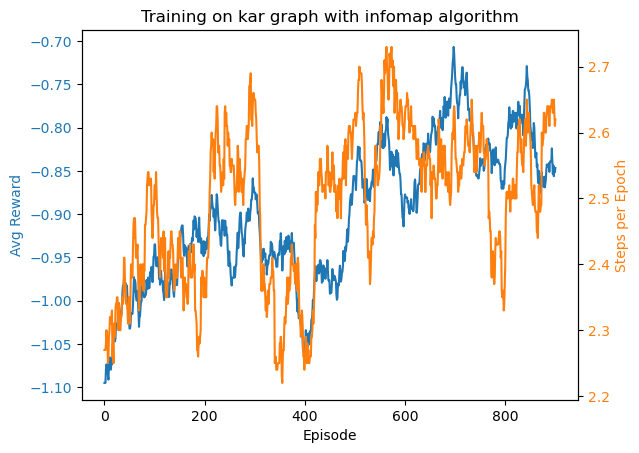

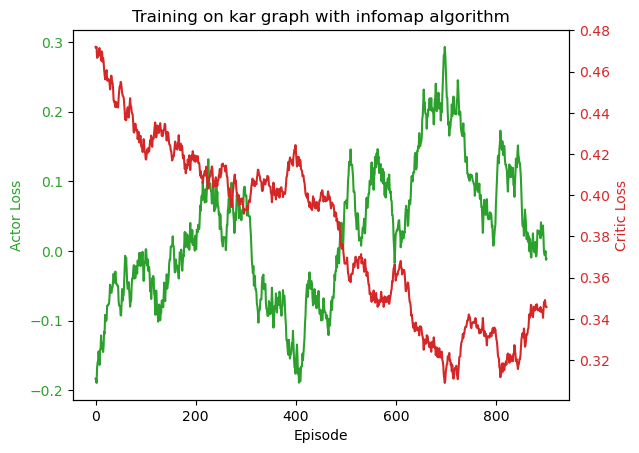

* ------------------ Model Hyperparameters ------------------
* Learning rate:  0.0001
* Gamma parameter:  0.5
* Lambda Metric:  0.001
* Alpha Metric:  0.1
* Value for clipping the loss function:  1.1920928955078125e-07


* Episode 1000 | Avg Reward: 0.25 | Avg Steps: 4 | Actor Loss: 0.00 | Critic Loss: 0.31: 100%|██████████| 1000/1000 [01:11<00:00, 13.90it/s] 


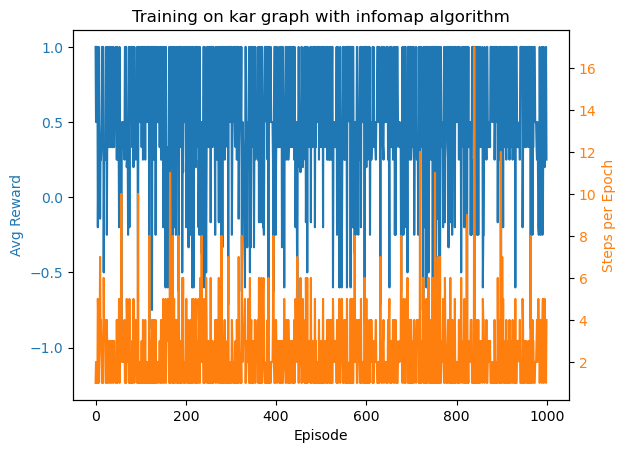

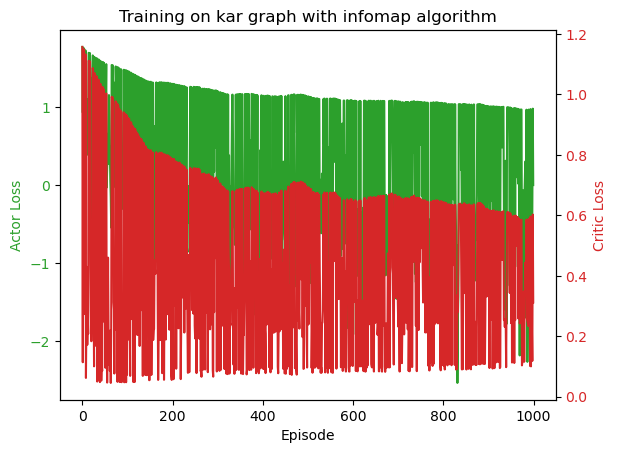

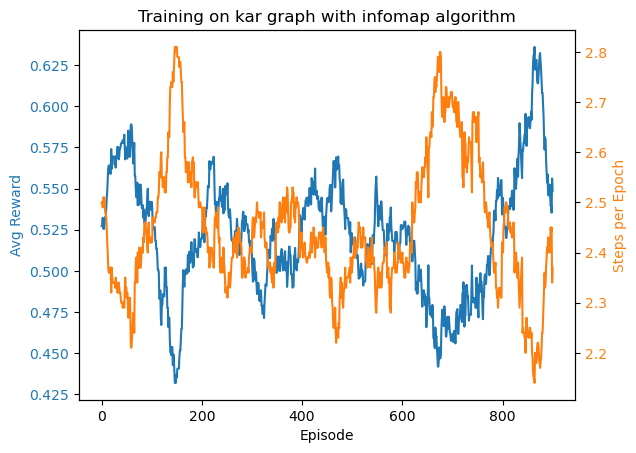

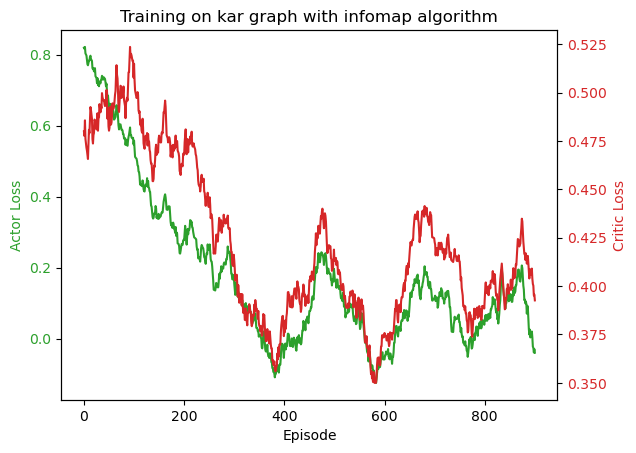

* ------------------ Model Hyperparameters ------------------
* Learning rate:  0.0001
* Gamma parameter:  0.5
* Lambda Metric:  0.001
* Alpha Metric:  0.3
* Value for clipping the loss function:  1.1920928955078125e-07


* Episode 1000 | Avg Reward: 0.33 | Avg Steps: 3 | Actor Loss: -0.30 | Critic Loss: 0.30: 100%|██████████| 1000/1000 [01:08<00:00, 14.69it/s]


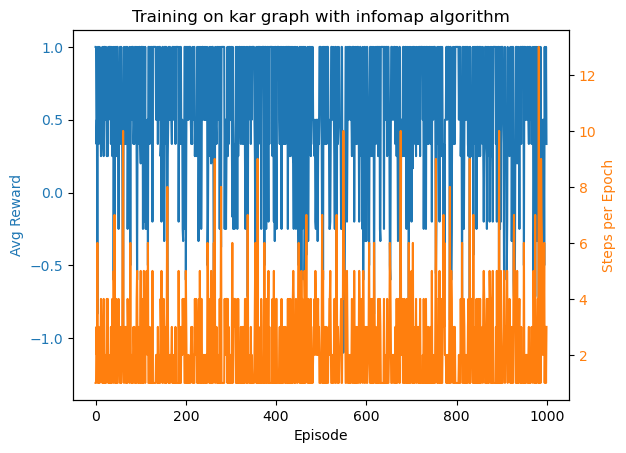

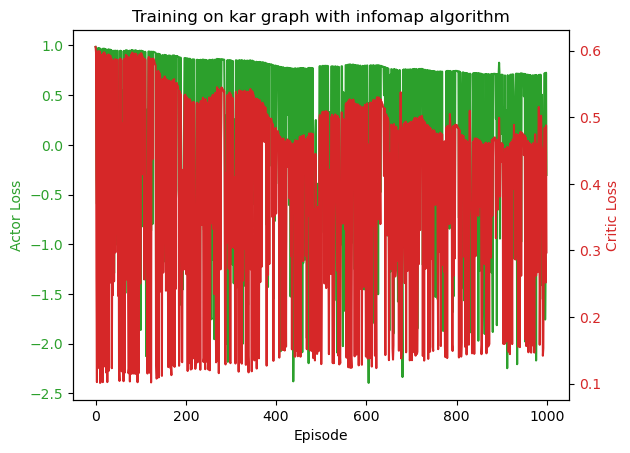

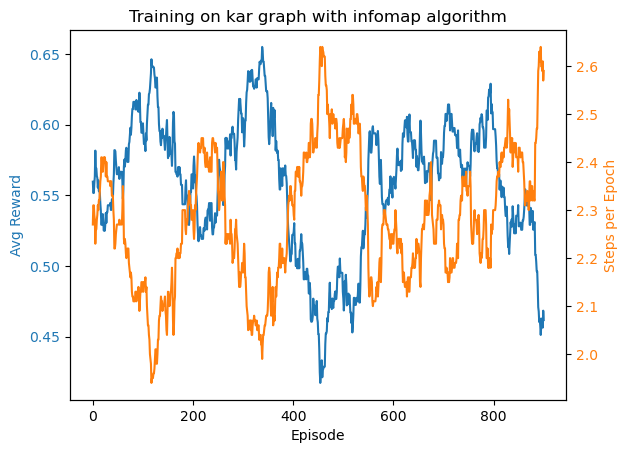

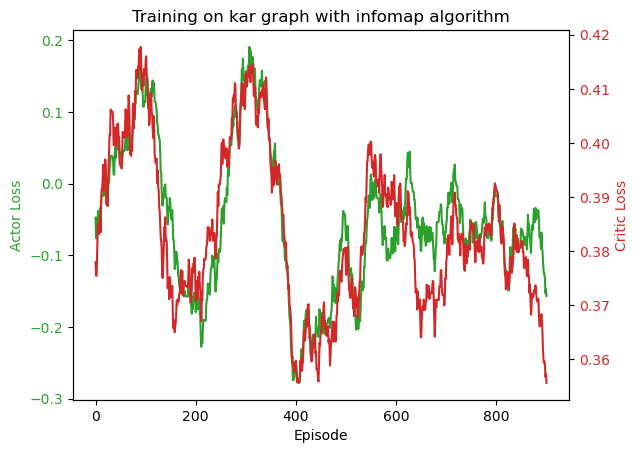

* ------------------ Model Hyperparameters ------------------
* Learning rate:  0.0001
* Gamma parameter:  0.5
* Lambda Metric:  0.001
* Alpha Metric:  0.5
* Value for clipping the loss function:  1.1920928955078125e-07


* Episode 1000 | Avg Reward: -1.00 | Avg Steps: 7 | Actor Loss: 0.56 | Critic Loss: 0.47: 100%|██████████| 1000/1000 [01:07<00:00, 14.76it/s]


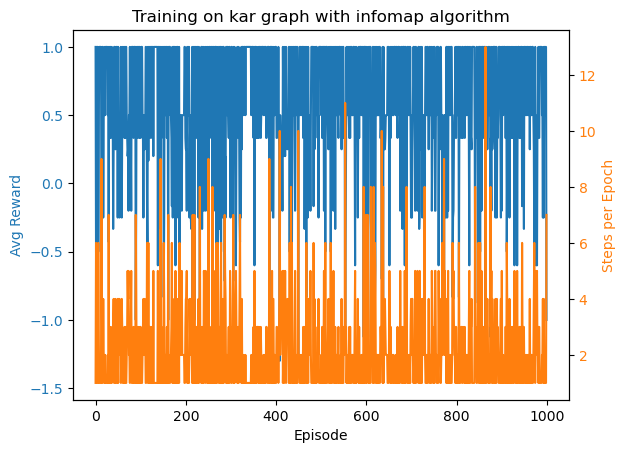

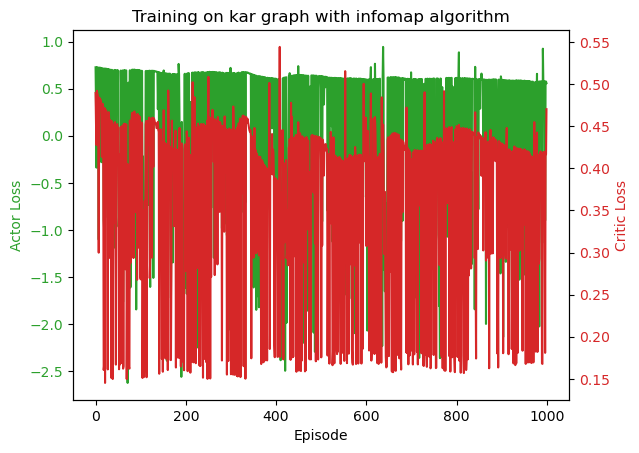

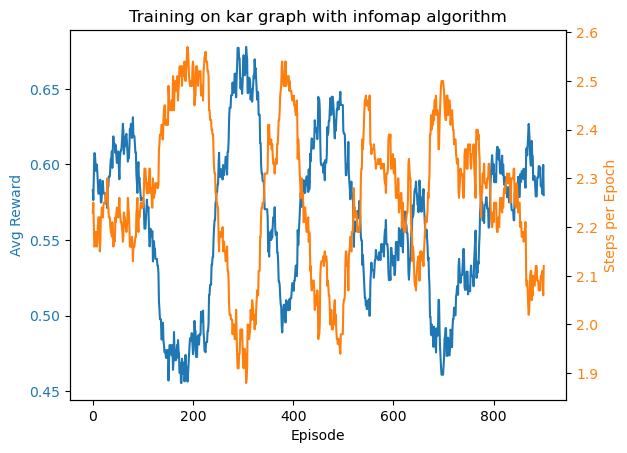

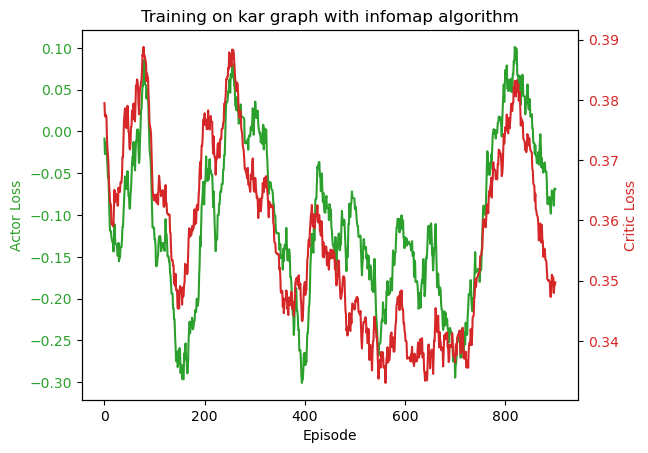

* ------------------ Model Hyperparameters ------------------
* Learning rate:  0.0001
* Gamma parameter:  0.5
* Lambda Metric:  0.001
* Alpha Metric:  0.7
* Value for clipping the loss function:  1.1920928955078125e-07


* Episode 1000 | Avg Reward: 0.33 | Avg Steps: 3 | Actor Loss: -1.17 | Critic Loss: 0.34: 100%|██████████| 1000/1000 [01:07<00:00, 14.81it/s]


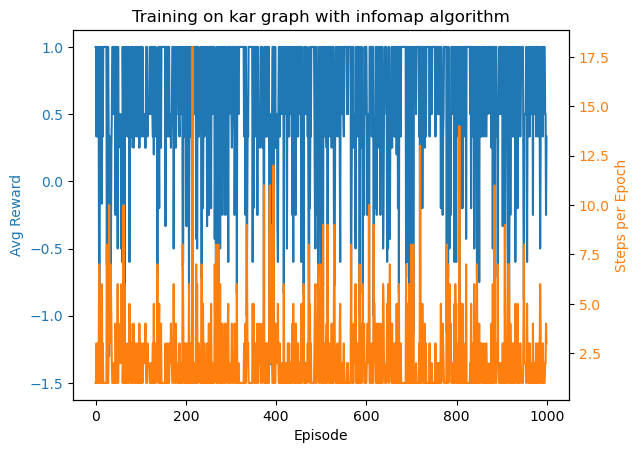

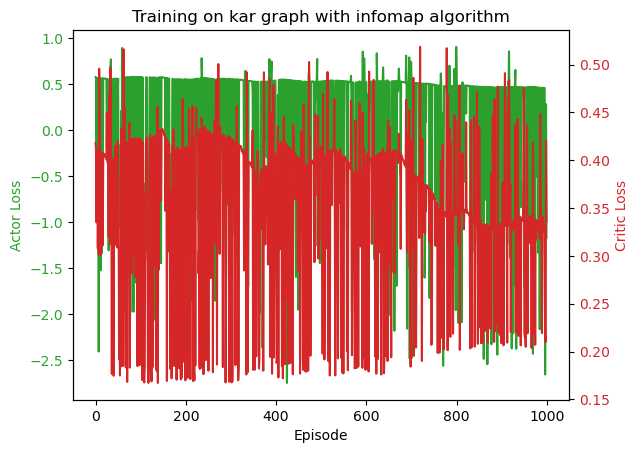

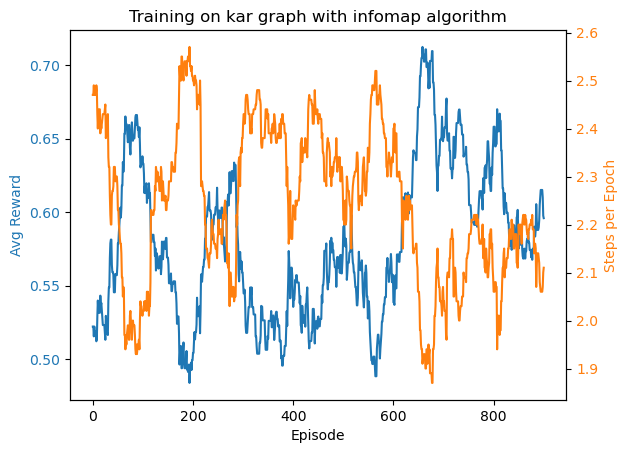

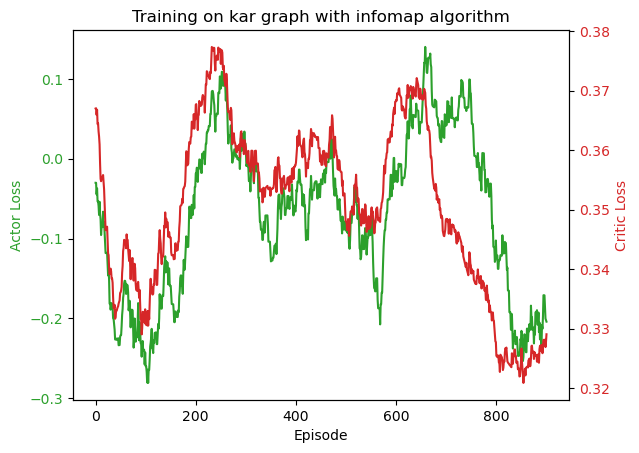

* ------------------ Model Hyperparameters ------------------
* Learning rate:  0.0001
* Gamma parameter:  0.5
* Lambda Metric:  0.001
* Alpha Metric:  0.9
* Value for clipping the loss function:  1.1920928955078125e-07


* Episode 1000 | Avg Reward: 1.00 | Avg Steps: 1 | Actor Loss: 0.36 | Critic Loss: 0.28: 100%|██████████| 1000/1000 [01:03<00:00, 15.68it/s] 


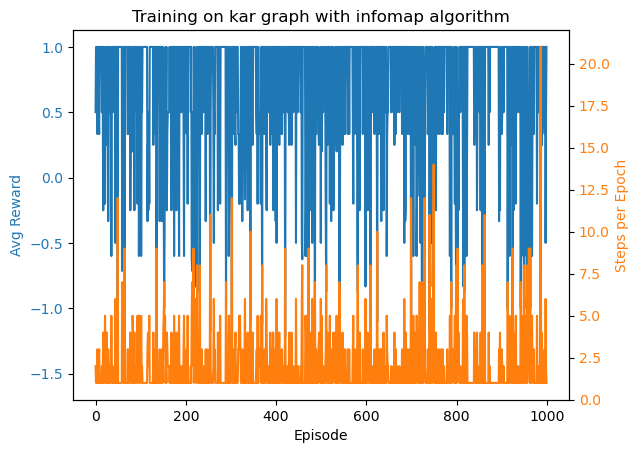

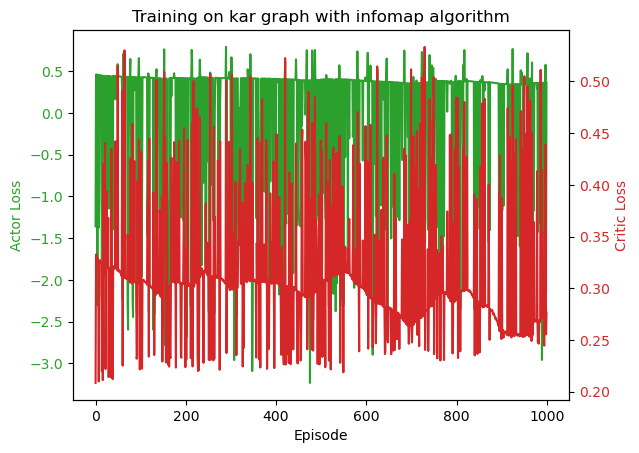

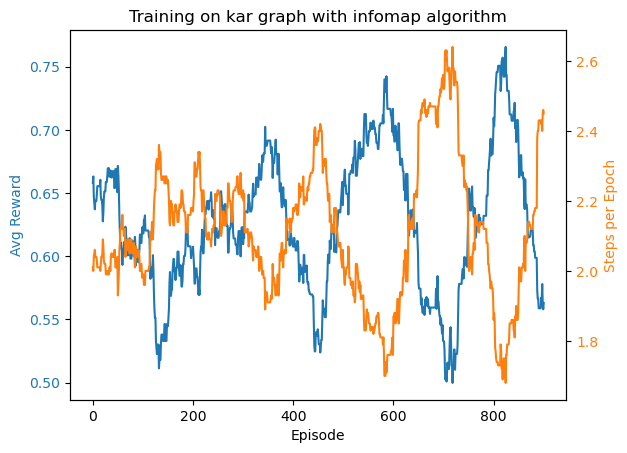

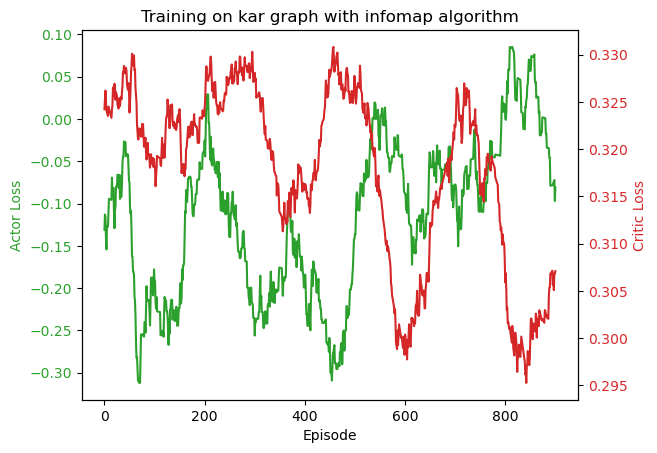

* ------------------ Model Hyperparameters ------------------
* Learning rate:  0.0001
* Gamma parameter:  0.5
* Lambda Metric:  0.01
* Alpha Metric:  0.1
* Value for clipping the loss function:  1.1920928955078125e-07


* Episode 1000 | Avg Reward: 1.00 | Avg Steps: 1 | Actor Loss: 0.30 | Critic Loss: 0.24: 100%|██████████| 1000/1000 [01:01<00:00, 16.20it/s] 


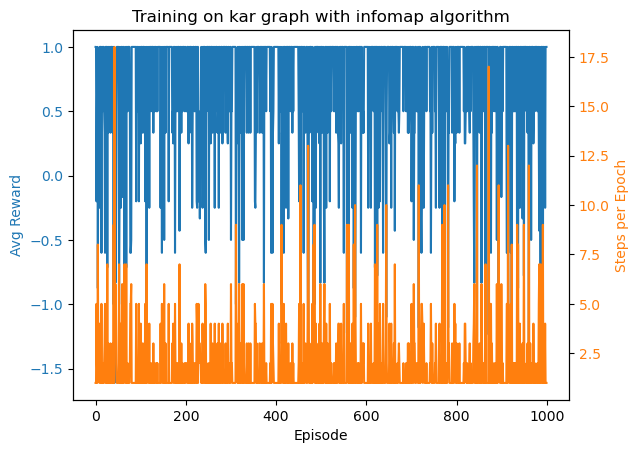

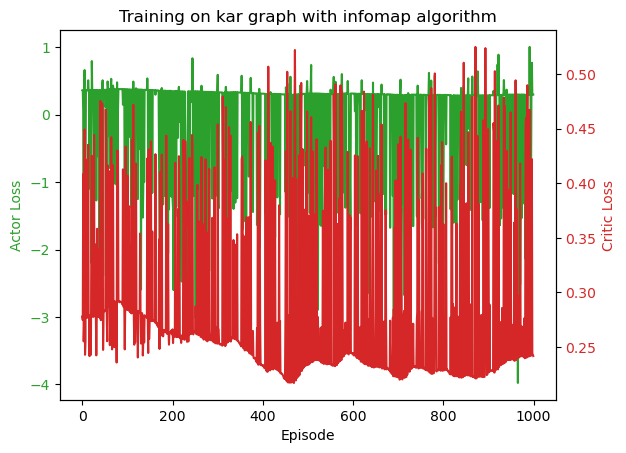

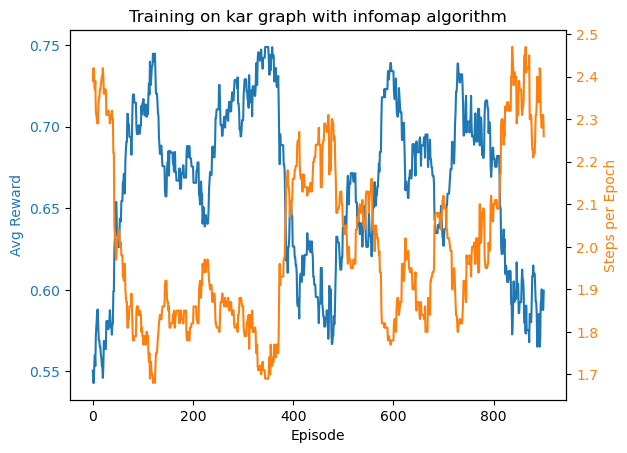

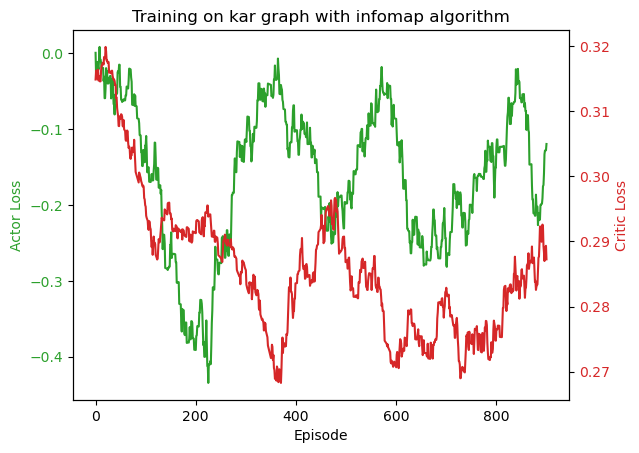

* ------------------ Model Hyperparameters ------------------
* Learning rate:  0.0001
* Gamma parameter:  0.5
* Lambda Metric:  0.01
* Alpha Metric:  0.3
* Value for clipping the loss function:  1.1920928955078125e-07


* Episode 1000 | Avg Reward: 1.00 | Avg Steps: 1 | Actor Loss: 0.22 | Critic Loss: 0.18: 100%|██████████| 1000/1000 [00:58<00:00, 17.03it/s] 


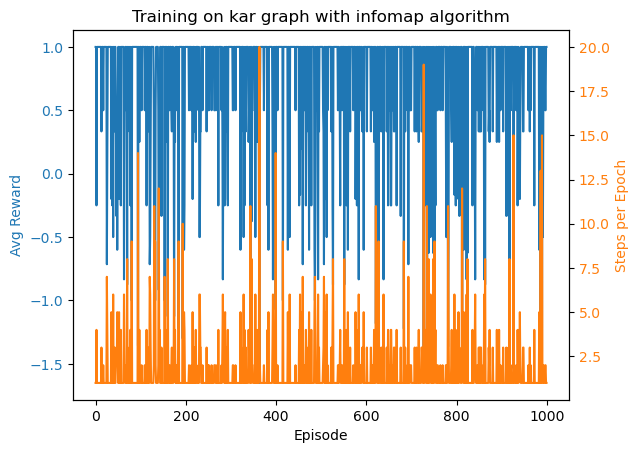

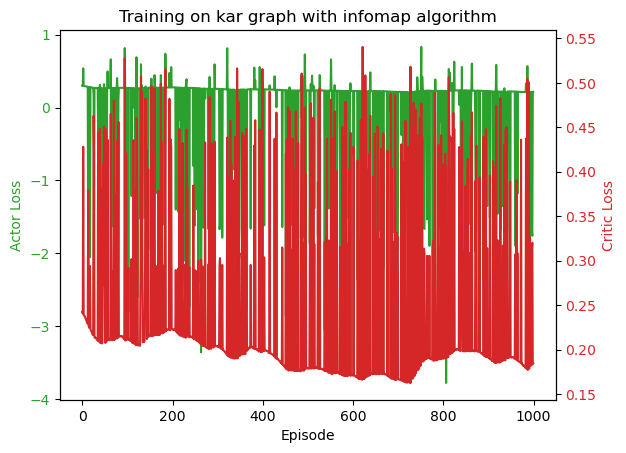

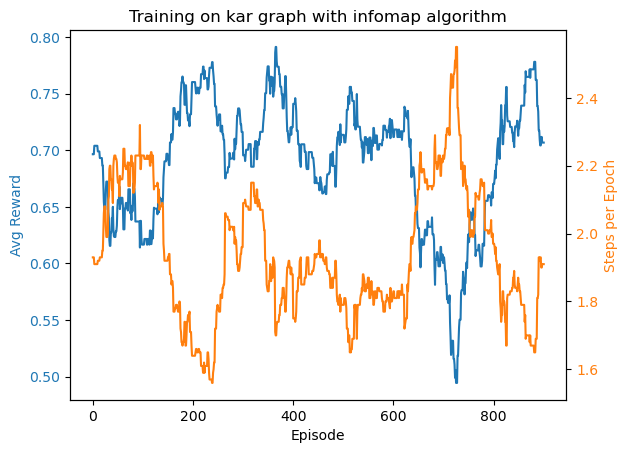

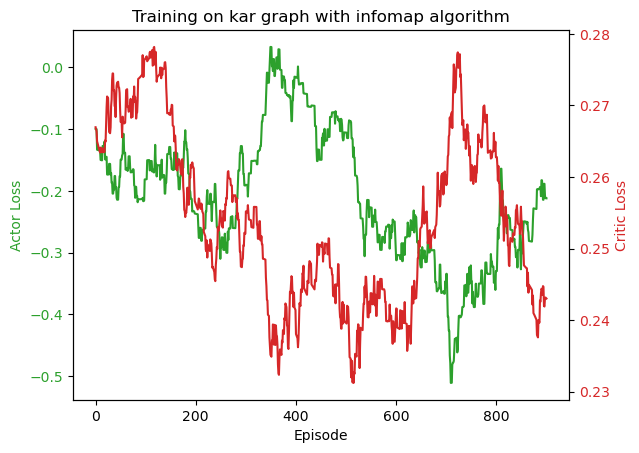

* ------------------ Model Hyperparameters ------------------
* Learning rate:  0.0001
* Gamma parameter:  0.5
* Lambda Metric:  0.01
* Alpha Metric:  0.5
* Value for clipping the loss function:  1.1920928955078125e-07


* Episode 1000 | Avg Reward: 0.50 | Avg Steps: 2 | Actor Loss: -1.55 | Critic Loss: 0.34: 100%|██████████| 1000/1000 [00:58<00:00, 17.18it/s]


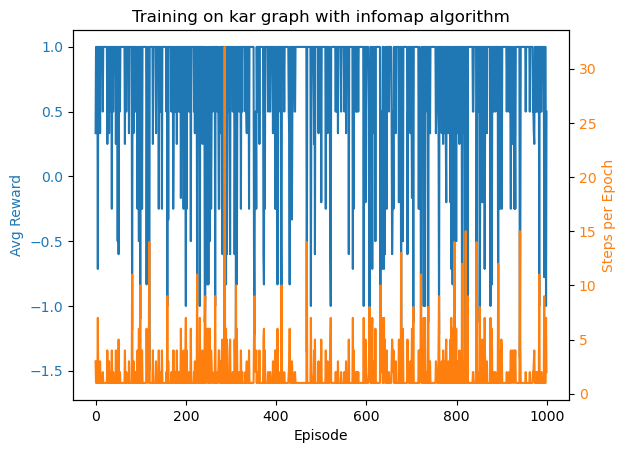

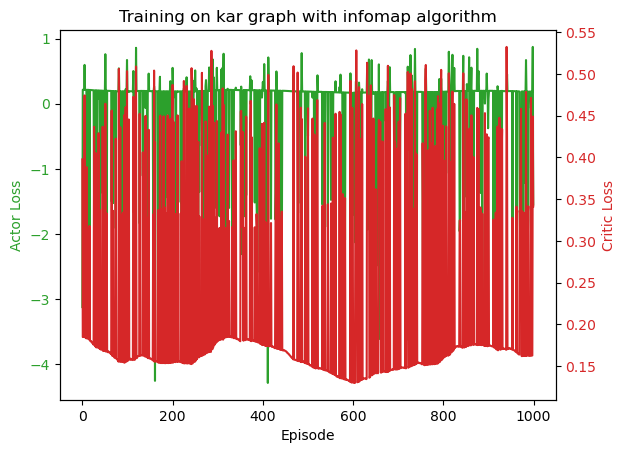

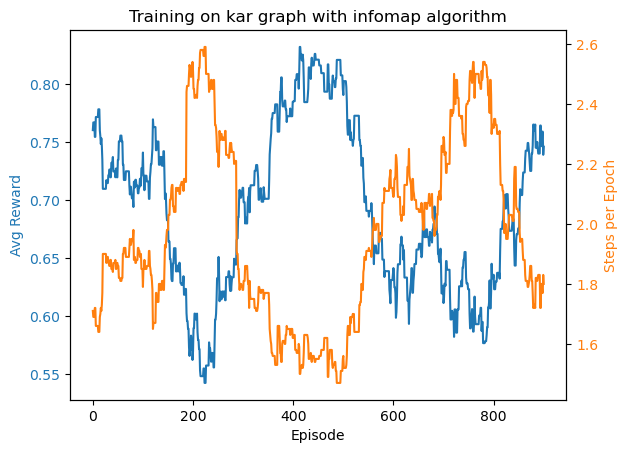

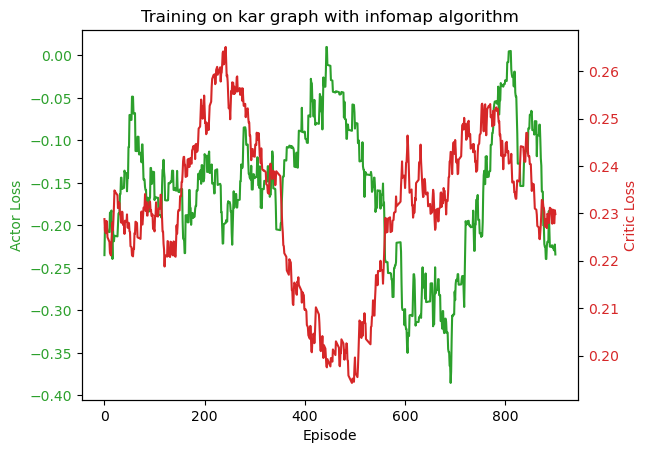

* ------------------ Model Hyperparameters ------------------
* Learning rate:  0.0001
* Gamma parameter:  0.5
* Lambda Metric:  0.01
* Alpha Metric:  0.7
* Value for clipping the loss function:  1.1920928955078125e-07


* Episode 1000 | Avg Reward: 1.00 | Avg Steps: 1 | Actor Loss: 0.16 | Critic Loss: 0.14: 100%|██████████| 1000/1000 [00:57<00:00, 17.28it/s] 


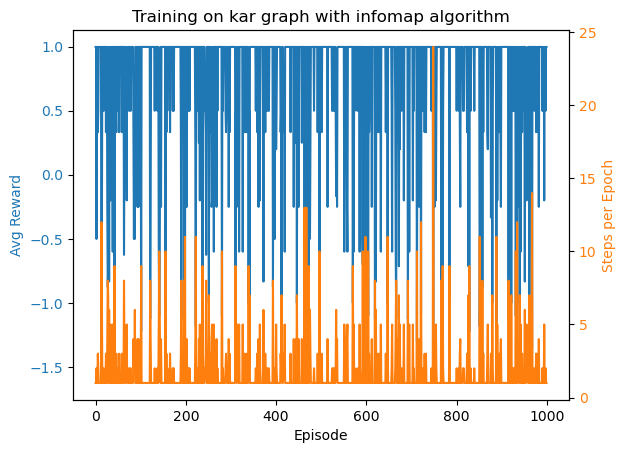

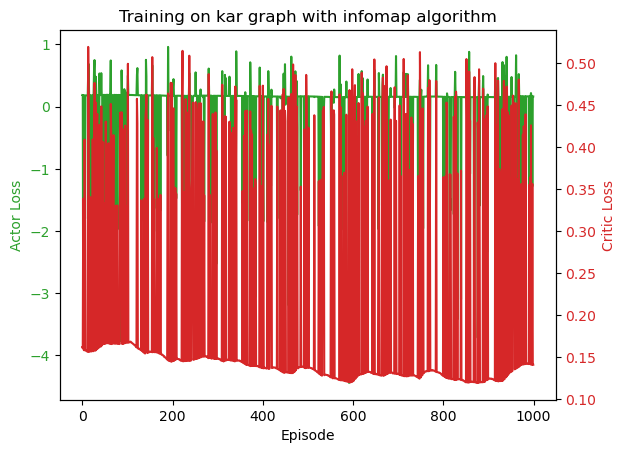

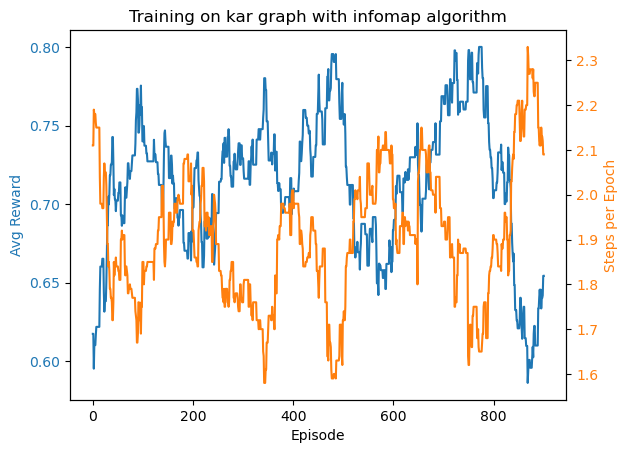

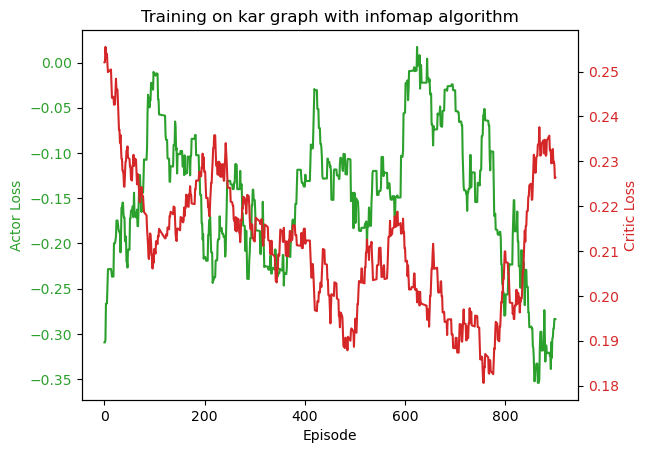

* ------------------ Model Hyperparameters ------------------
* Learning rate:  0.0001
* Gamma parameter:  0.5
* Lambda Metric:  0.01
* Alpha Metric:  0.9
* Value for clipping the loss function:  1.1920928955078125e-07


* Episode 1000 | Avg Reward: 1.00 | Avg Steps: 1 | Actor Loss: 0.14 | Critic Loss: 0.13: 100%|██████████| 1000/1000 [00:55<00:00, 18.01it/s] 


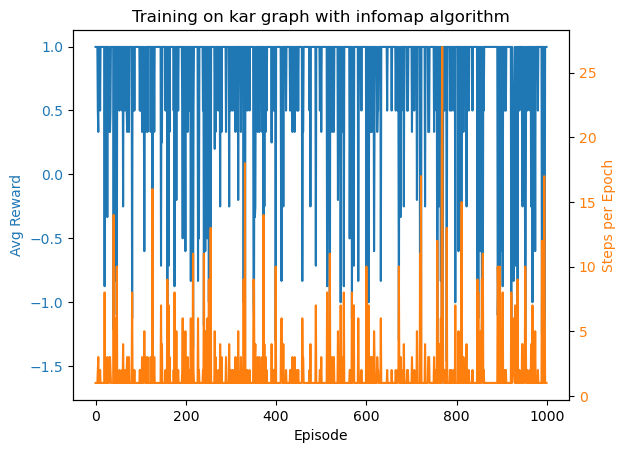

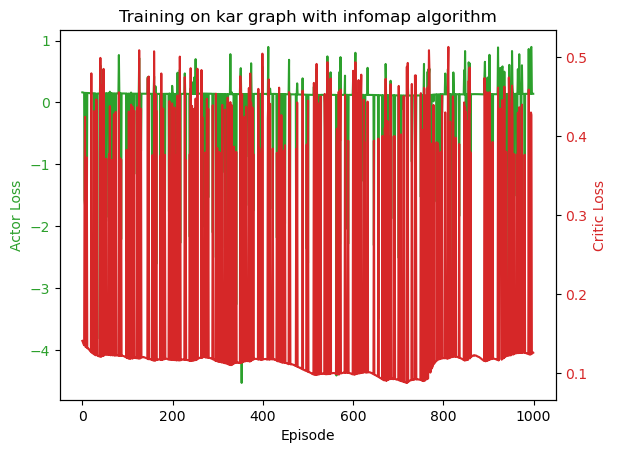

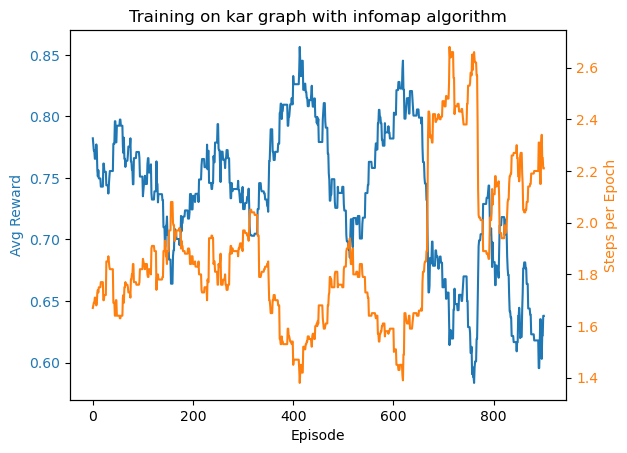

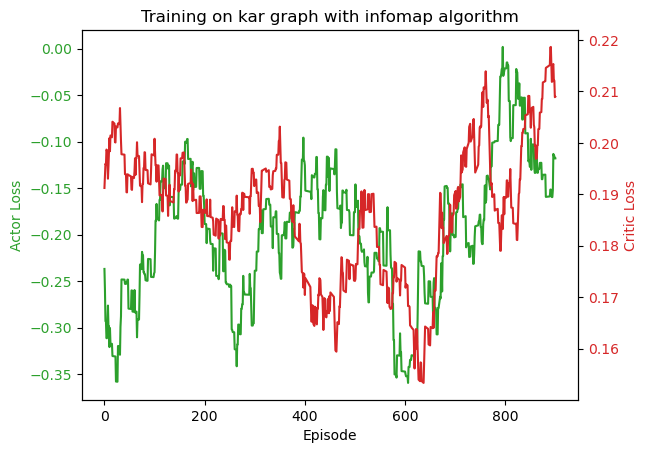

* ------------------ Model Hyperparameters ------------------
* Learning rate:  0.0001
* Gamma parameter:  0.5
* Lambda Metric:  0.1
* Alpha Metric:  0.1
* Value for clipping the loss function:  1.1920928955078125e-07


* Episode 1000 | Avg Reward: 1.00 | Avg Steps: 1 | Actor Loss: 0.13 | Critic Loss: 0.11: 100%|██████████| 1000/1000 [00:56<00:00, 17.83it/s] 


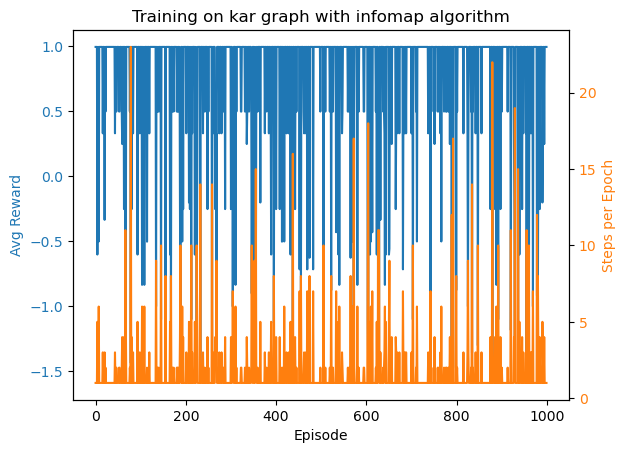

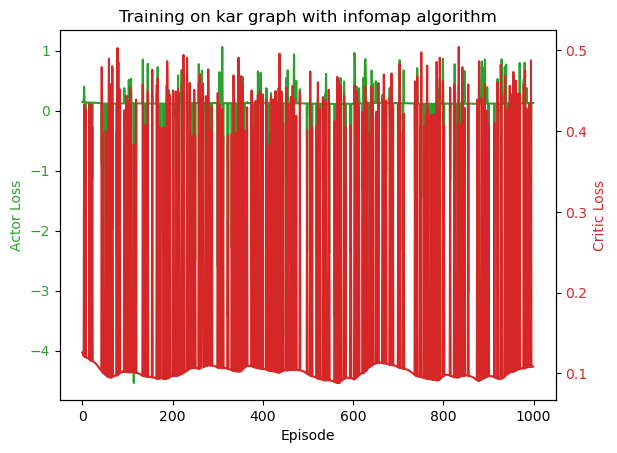

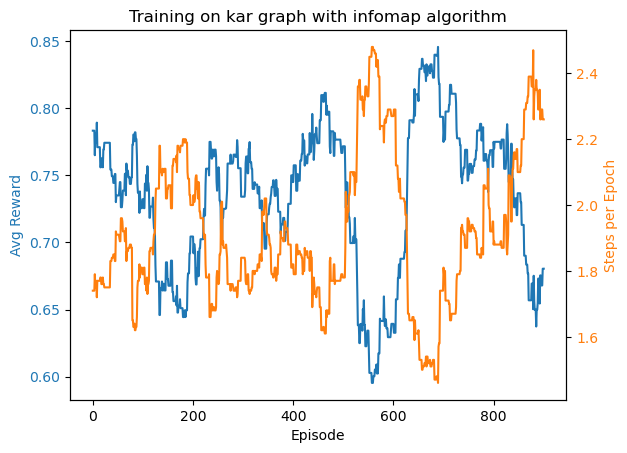

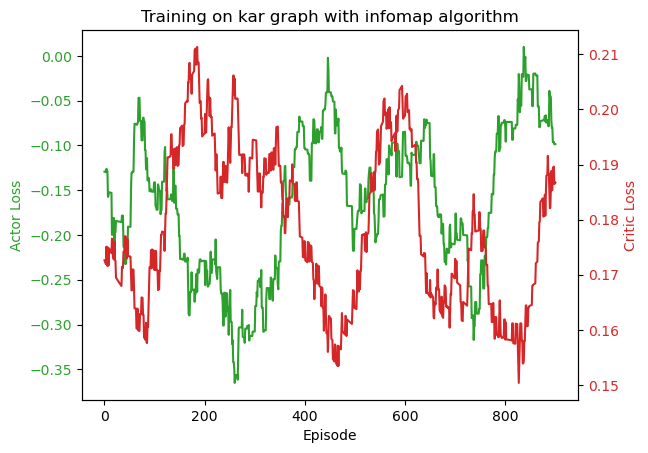

* ------------------ Model Hyperparameters ------------------
* Learning rate:  0.0001
* Gamma parameter:  0.5
* Lambda Metric:  0.1
* Alpha Metric:  0.3
* Value for clipping the loss function:  1.1920928955078125e-07


* Episode 1000 | Avg Reward: 0.99 | Avg Steps: 1 | Actor Loss: 0.11 | Critic Loss: 0.09: 100%|██████████| 1000/1000 [00:57<00:00, 17.32it/s] 


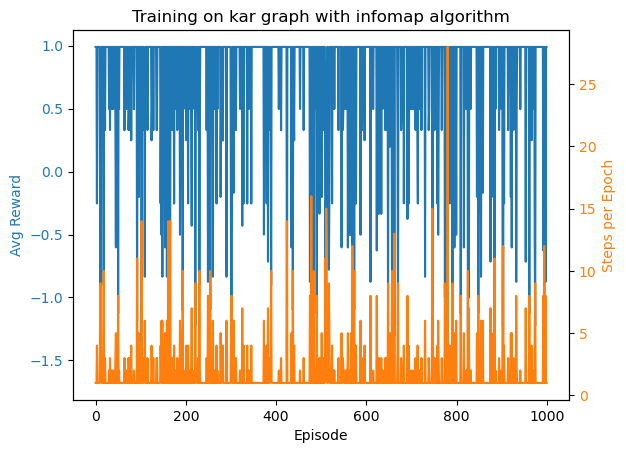

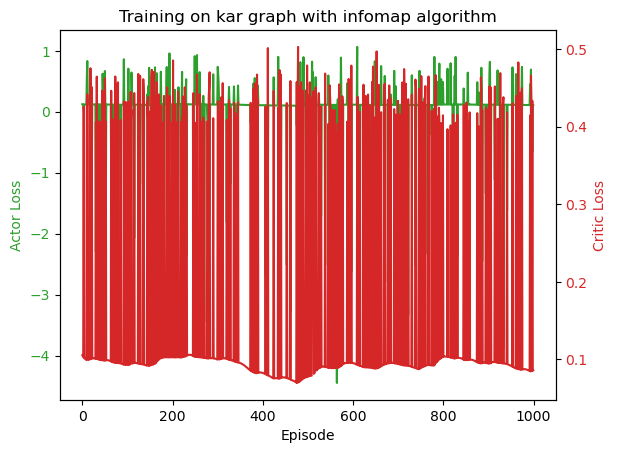

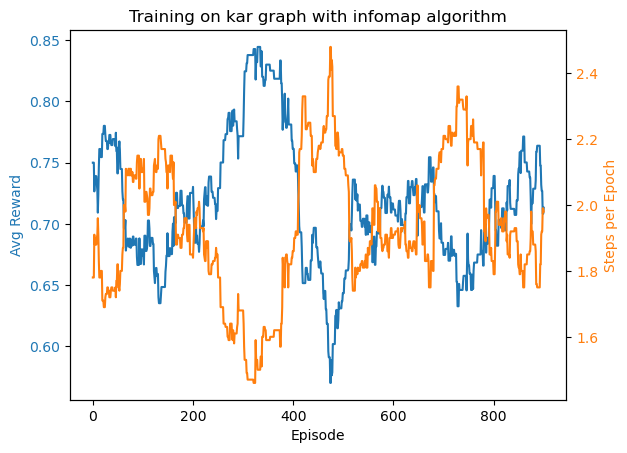

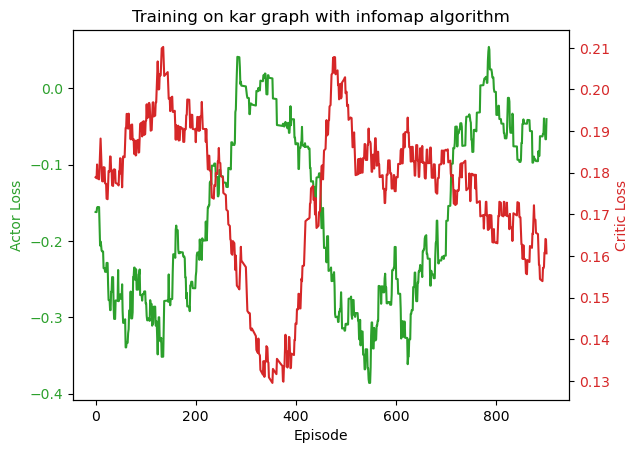

* ------------------ Model Hyperparameters ------------------
* Learning rate:  0.0001
* Gamma parameter:  0.5
* Lambda Metric:  0.1
* Alpha Metric:  0.5
* Value for clipping the loss function:  1.1920928955078125e-07


* Episode 1000 | Avg Reward: 0.98 | Avg Steps: 1 | Actor Loss: 0.09 | Critic Loss: 0.06: 100%|██████████| 1000/1000 [00:57<00:00, 17.52it/s]


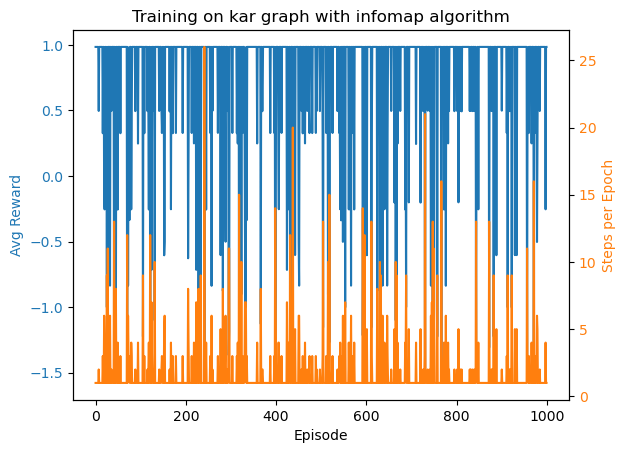

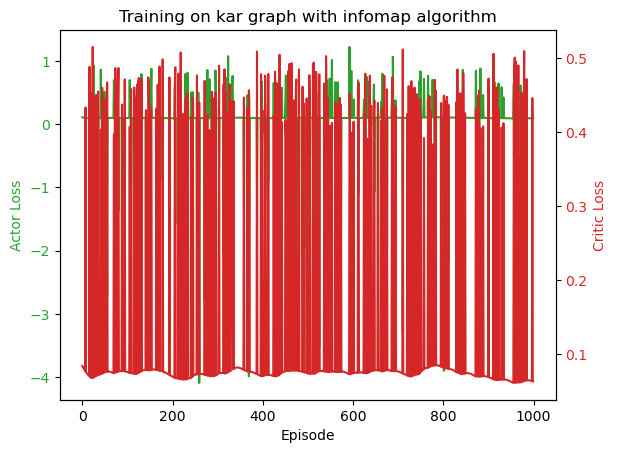

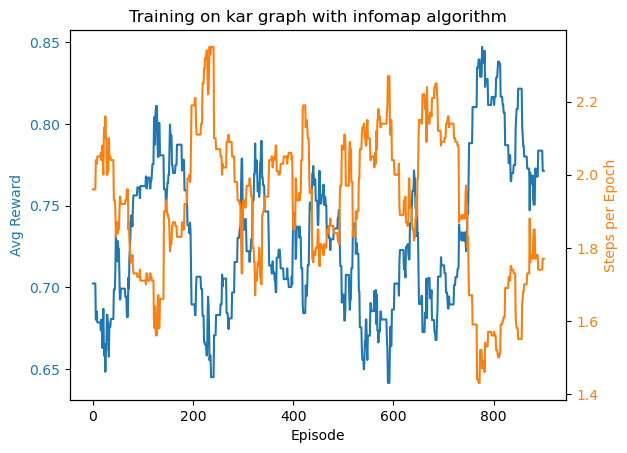

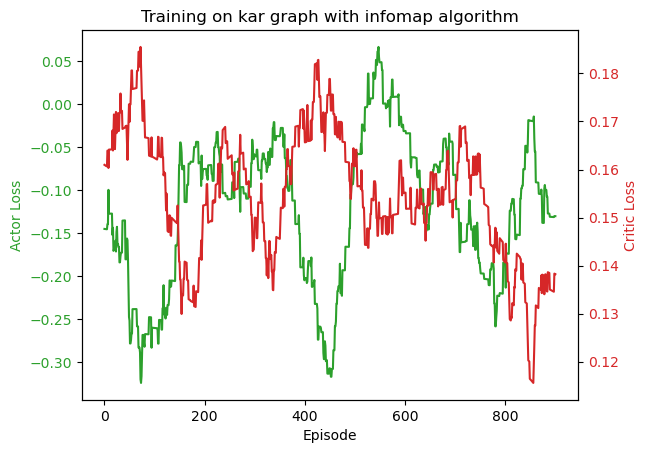

* ------------------ Model Hyperparameters ------------------
* Learning rate:  0.0001
* Gamma parameter:  0.5
* Lambda Metric:  0.1
* Alpha Metric:  0.7
* Value for clipping the loss function:  1.1920928955078125e-07


* Episode 1000 | Avg Reward: 0.98 | Avg Steps: 1 | Actor Loss: 0.10 | Critic Loss: 0.06: 100%|██████████| 1000/1000 [00:59<00:00, 16.84it/s]


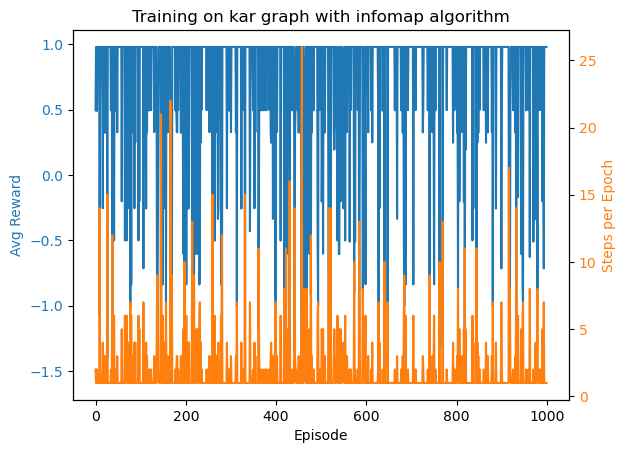

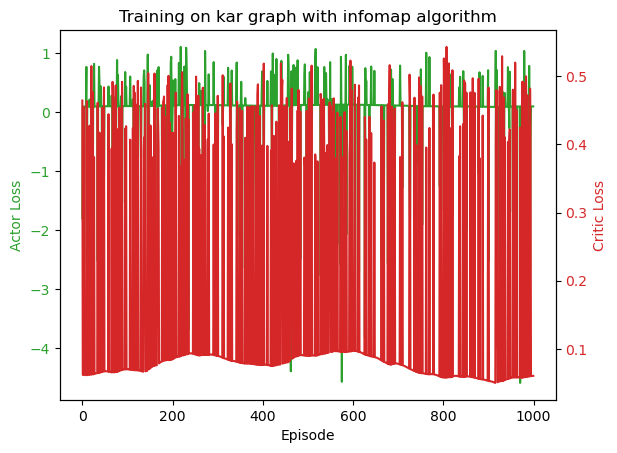

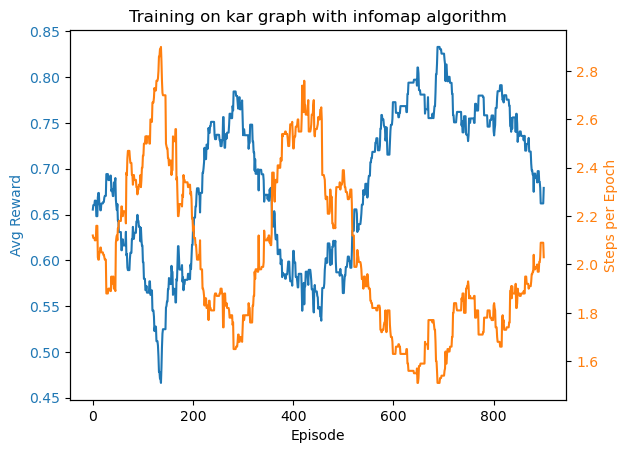

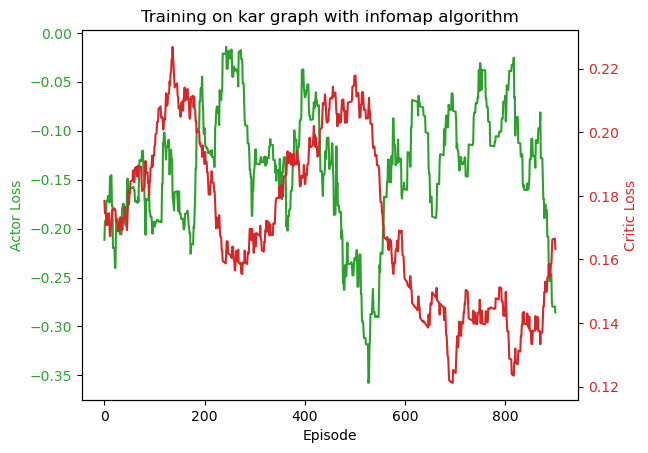

* ------------------ Model Hyperparameters ------------------
* Learning rate:  0.0001
* Gamma parameter:  0.5
* Lambda Metric:  0.1
* Alpha Metric:  0.9
* Value for clipping the loss function:  1.1920928955078125e-07


* Episode 1000 | Avg Reward: -0.60 | Avg Steps: 5 | Actor Loss: 0.48 | Critic Loss: 0.41: 100%|██████████| 1000/1000 [00:54<00:00, 18.24it/s]


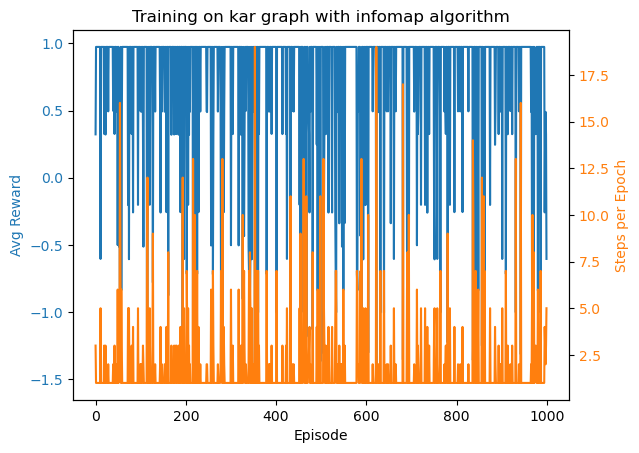

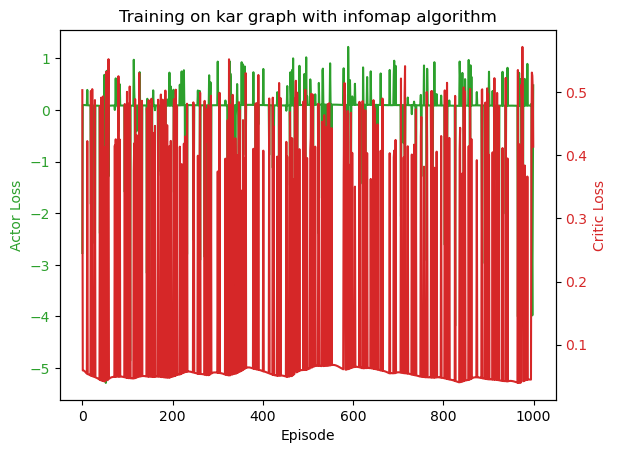

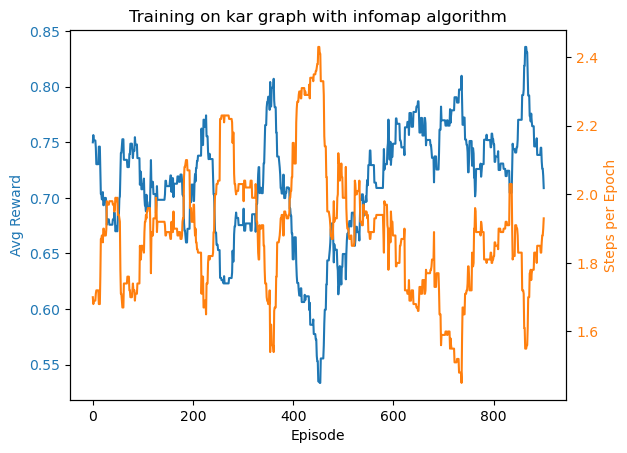

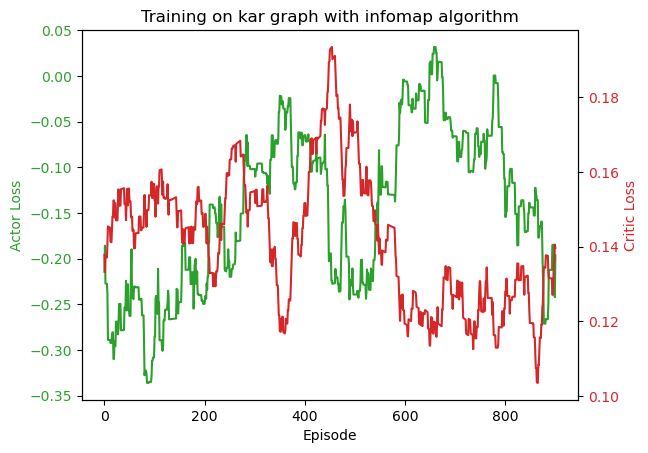

* ------------------ Model Hyperparameters ------------------
* Learning rate:  0.0001
* Gamma parameter:  0.5
* Lambda Metric:  1
* Alpha Metric:  0.1
* Value for clipping the loss function:  1.1920928955078125e-07


* Episode 1000 | Avg Reward: 0.96 | Avg Steps: 1 | Actor Loss: 0.09 | Critic Loss: 0.05: 100%|██████████| 1000/1000 [00:56<00:00, 17.86it/s]


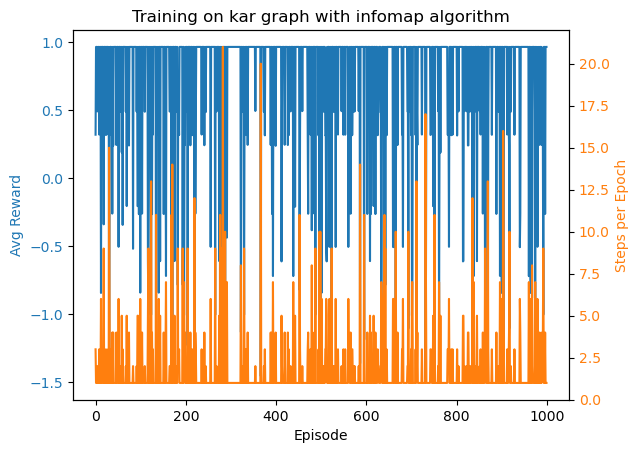

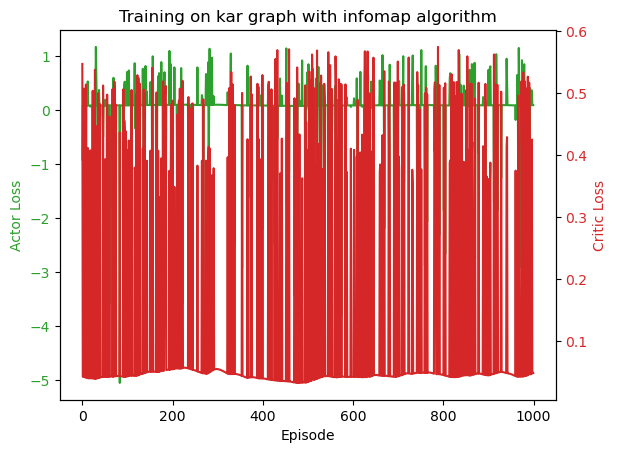

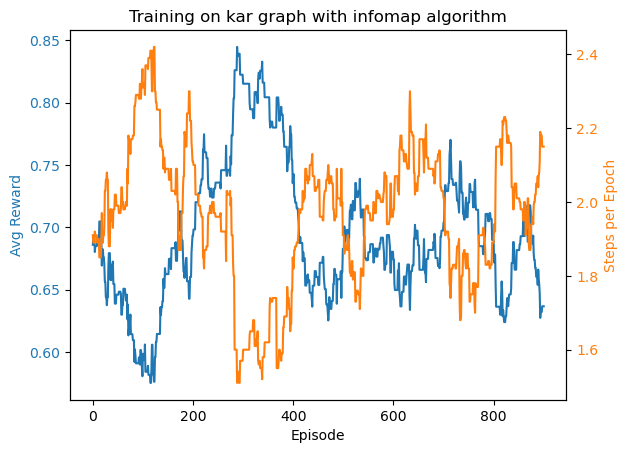

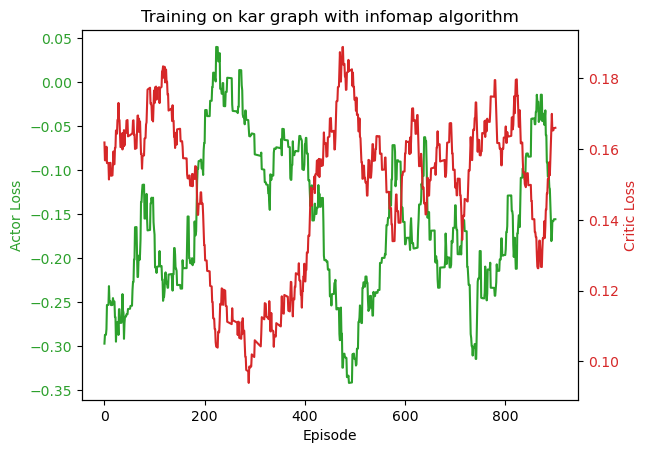

* ------------------ Model Hyperparameters ------------------
* Learning rate:  0.0001
* Gamma parameter:  0.5
* Lambda Metric:  1
* Alpha Metric:  0.3
* Value for clipping the loss function:  1.1920928955078125e-07


* Episode 1000 | Avg Reward: 0.29 | Avg Steps: 3 | Actor Loss: -0.61 | Critic Loss: 0.56: 100%|██████████| 1000/1000 [00:53<00:00, 18.85it/s]


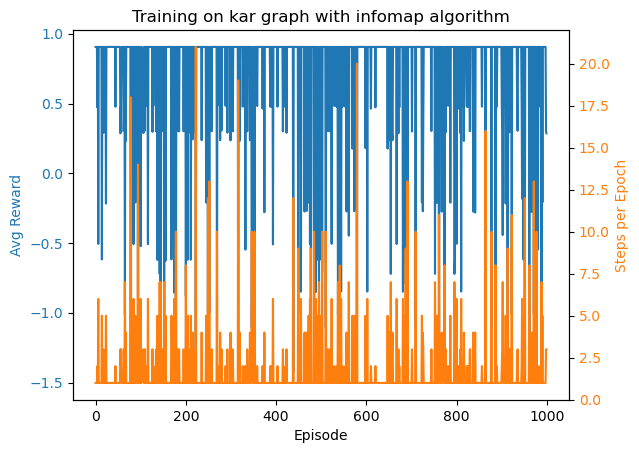

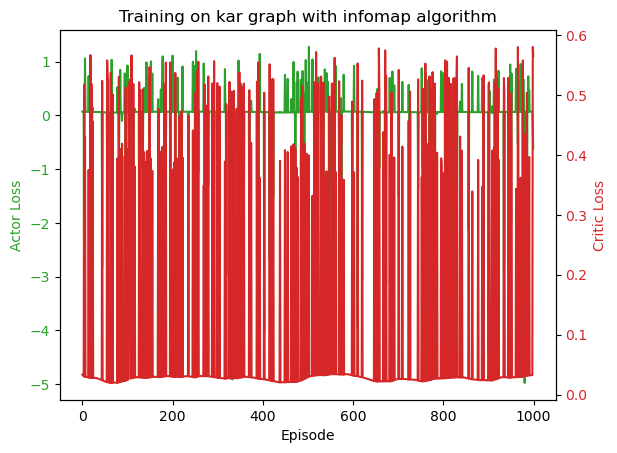

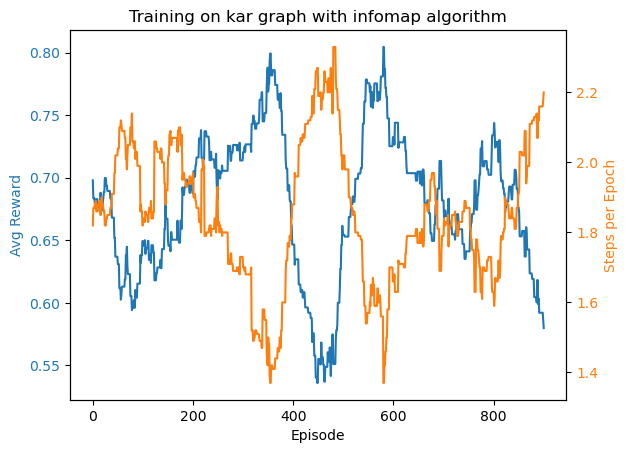

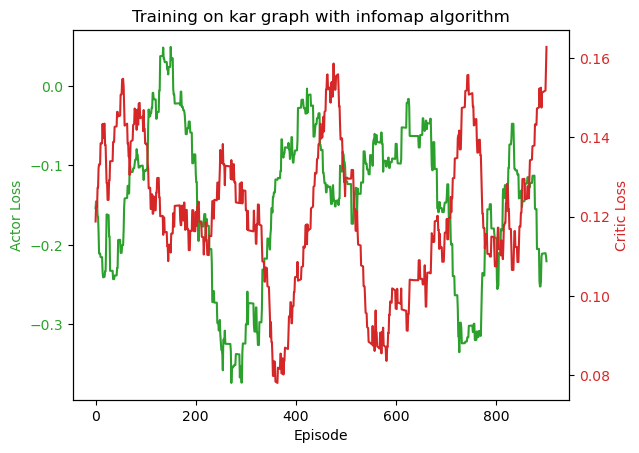

* ------------------ Model Hyperparameters ------------------
* Learning rate:  0.0001
* Gamma parameter:  0.5
* Lambda Metric:  1
* Alpha Metric:  0.5
* Value for clipping the loss function:  1.1920928955078125e-07


* Episode 1000 | Avg Reward: 0.85 | Avg Steps: 1 | Actor Loss: 0.06 | Critic Loss: 0.02: 100%|██████████| 1000/1000 [00:54<00:00, 18.19it/s]


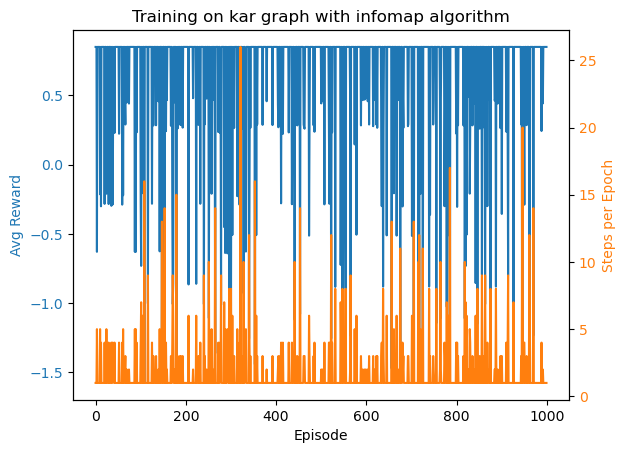

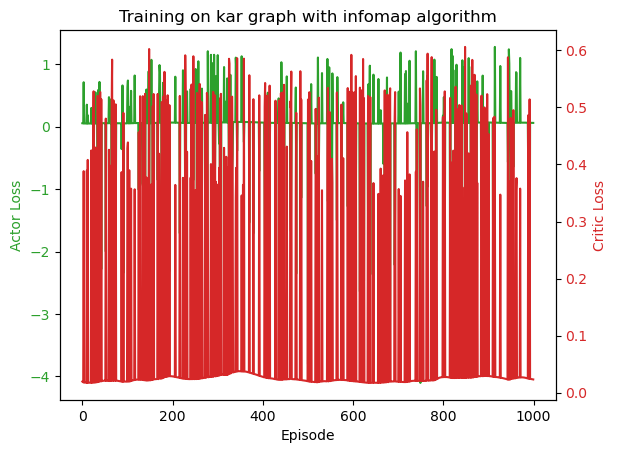

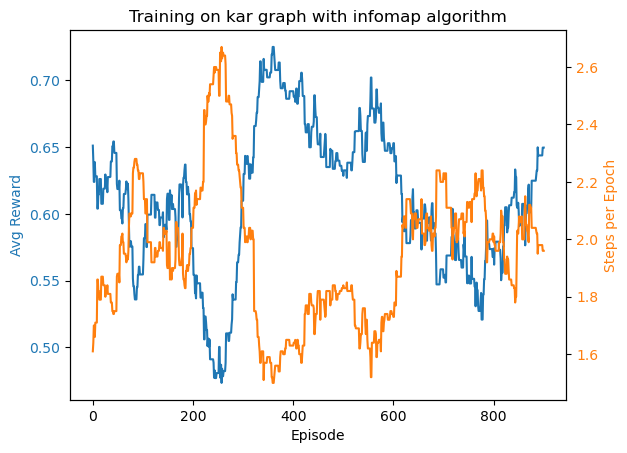

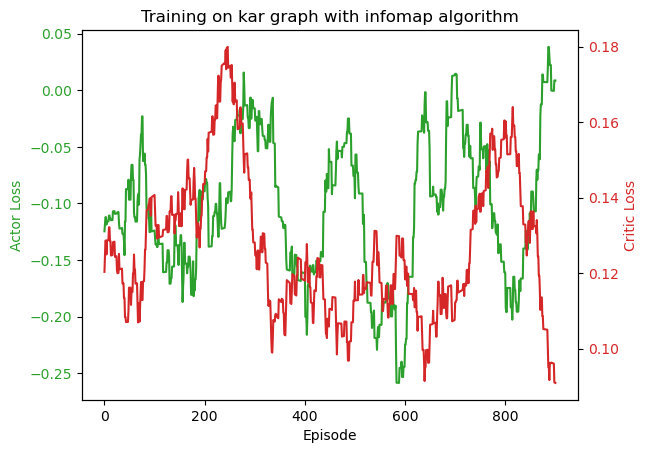

* ------------------ Model Hyperparameters ------------------
* Learning rate:  0.0001
* Gamma parameter:  0.5
* Lambda Metric:  1
* Alpha Metric:  0.7
* Value for clipping the loss function:  1.1920928955078125e-07


* Episode 1000 | Avg Reward: 0.79 | Avg Steps: 1 | Actor Loss: 0.06 | Critic Loss: 0.02: 100%|██████████| 1000/1000 [01:00<00:00, 16.55it/s]


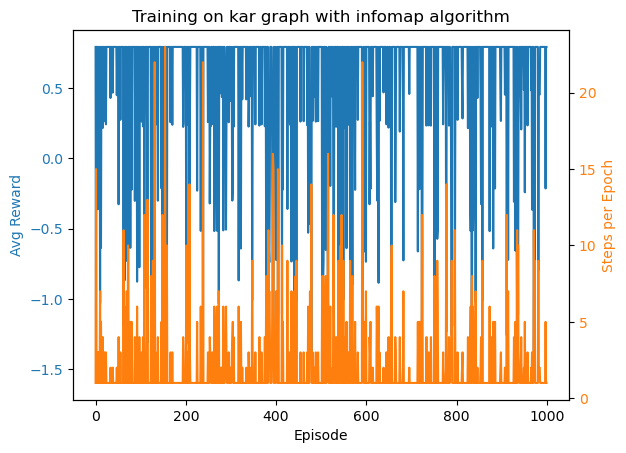

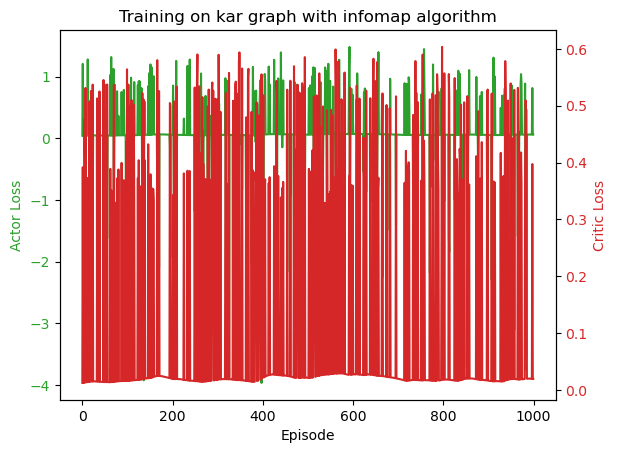

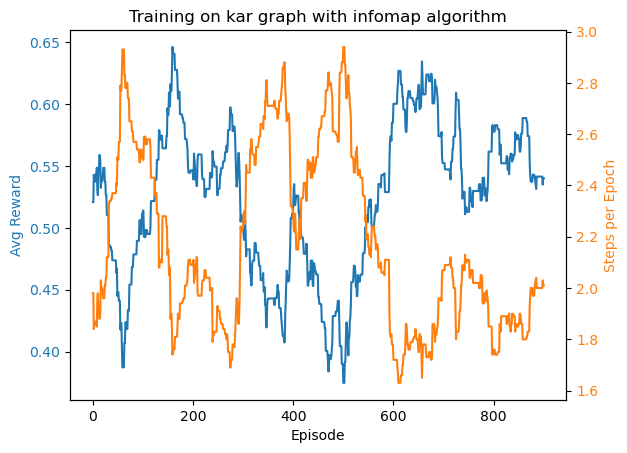

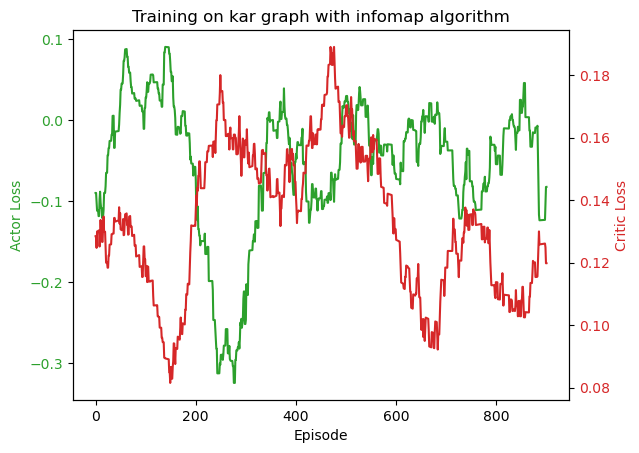

* ------------------ Model Hyperparameters ------------------
* Learning rate:  0.0001
* Gamma parameter:  0.5
* Lambda Metric:  1
* Alpha Metric:  0.9
* Value for clipping the loss function:  1.1920928955078125e-07


* Episode 1000 | Avg Reward: 0.74 | Avg Steps: 1 | Actor Loss: 0.06 | Critic Loss: 0.02: 100%|██████████| 1000/1000 [00:57<00:00, 17.48it/s]


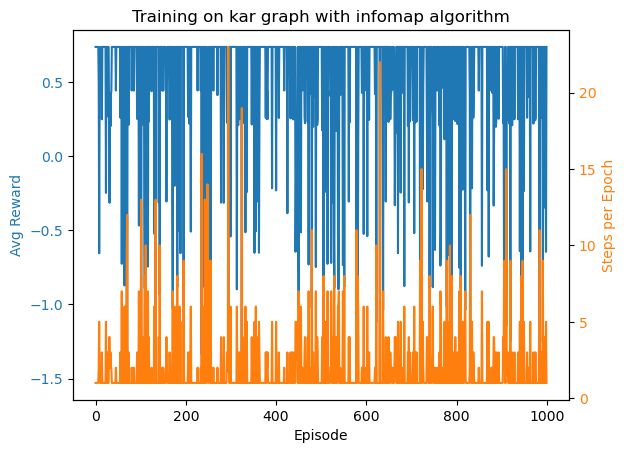

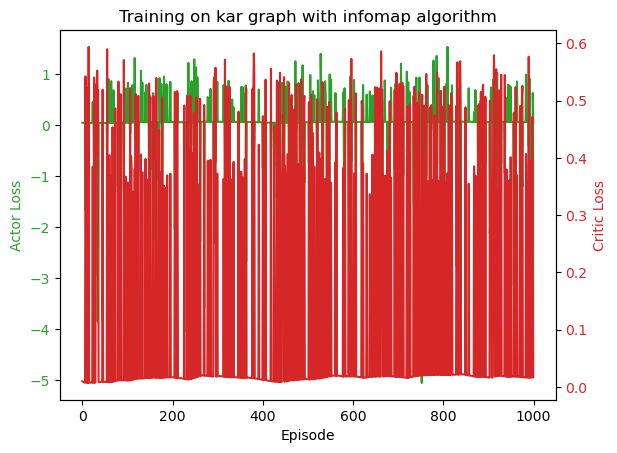

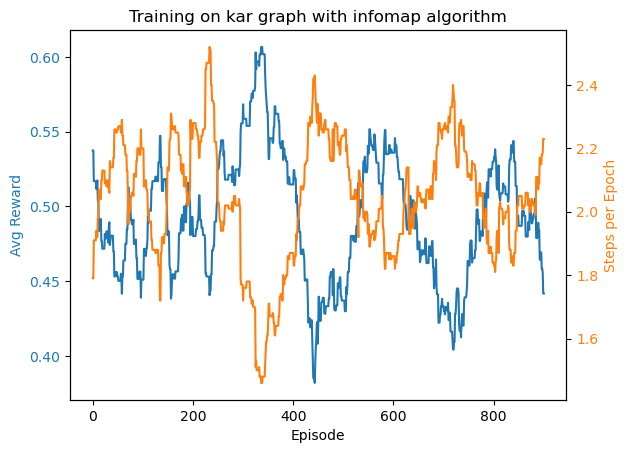

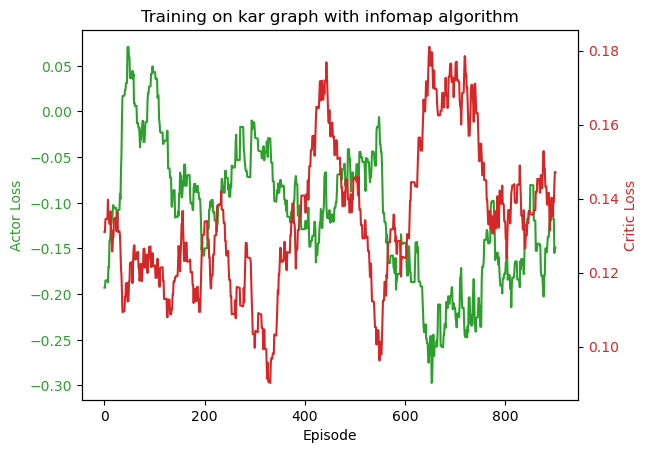

* ------------------ Model Hyperparameters ------------------
* Learning rate:  0.0001
* Gamma parameter:  0.5
* Lambda Metric:  10
* Alpha Metric:  0.1
* Value for clipping the loss function:  1.1920928955078125e-07


* Episode 1000 | Avg Reward: 0.63 | Avg Steps: 1 | Actor Loss: 0.06 | Critic Loss: 0.02: 100%|██████████| 1000/1000 [00:57<00:00, 17.34it/s]


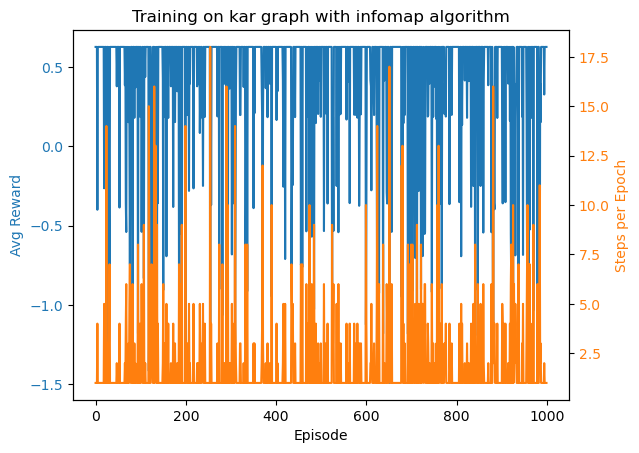

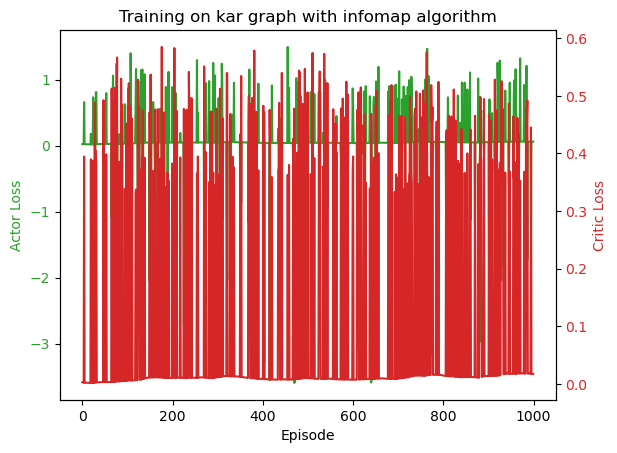

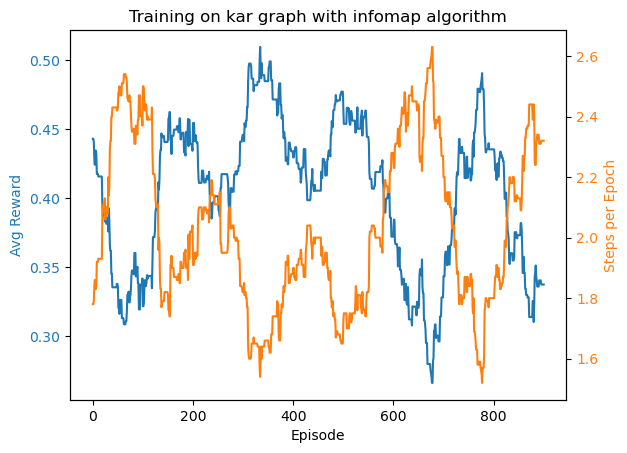

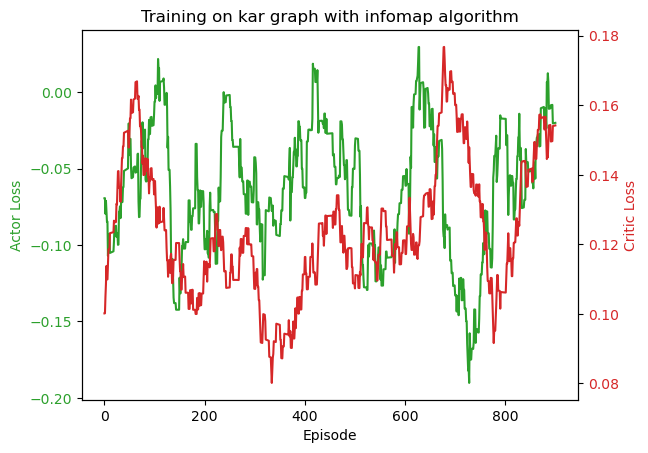

* ------------------ Model Hyperparameters ------------------
* Learning rate:  0.0001
* Gamma parameter:  0.5
* Lambda Metric:  10
* Alpha Metric:  0.3
* Value for clipping the loss function:  1.1920928955078125e-07


* Episode 1000 | Avg Reward: 0.06 | Avg Steps: 1 | Actor Loss: -0.03 | Critic Loss: 0.00: 100%|██████████| 1000/1000 [01:02<00:00, 16.06it/s]


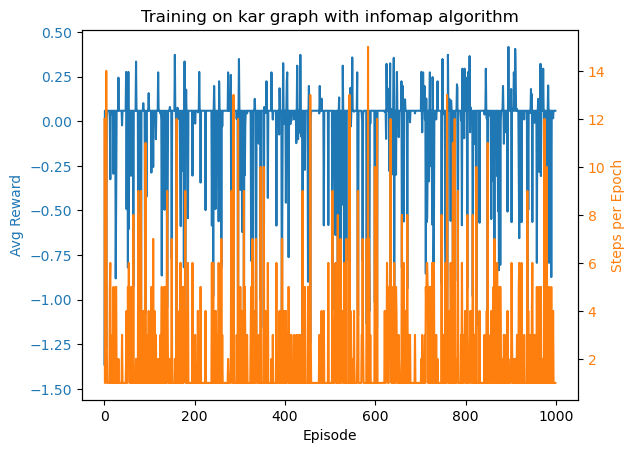

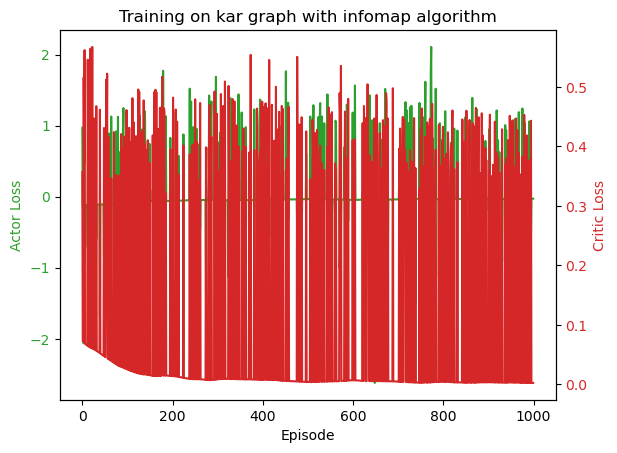

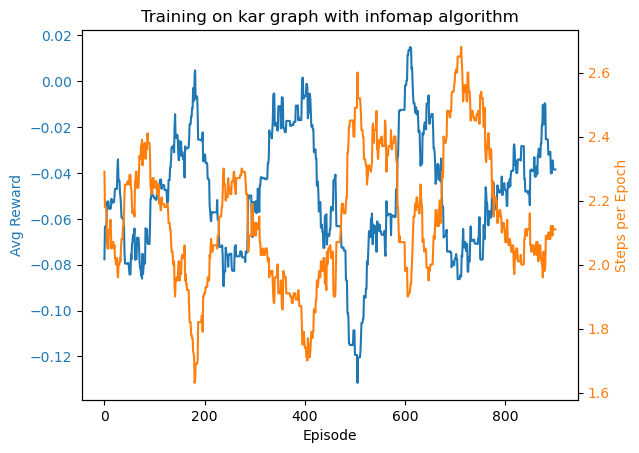

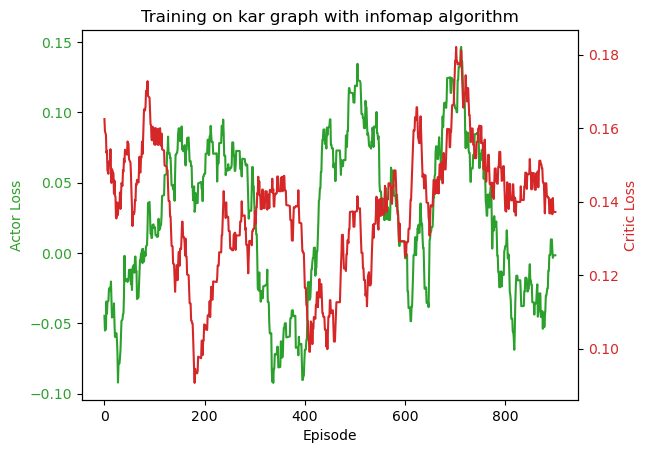

* ------------------ Model Hyperparameters ------------------
* Learning rate:  0.0001
* Gamma parameter:  0.5
* Lambda Metric:  10
* Alpha Metric:  0.5
* Value for clipping the loss function:  1.1920928955078125e-07


* Episode 1000 | Avg Reward: -0.23 | Avg Steps: 3 | Actor Loss: -0.63 | Critic Loss: 0.40: 100%|██████████| 1000/1000 [01:04<00:00, 15.62it/s]


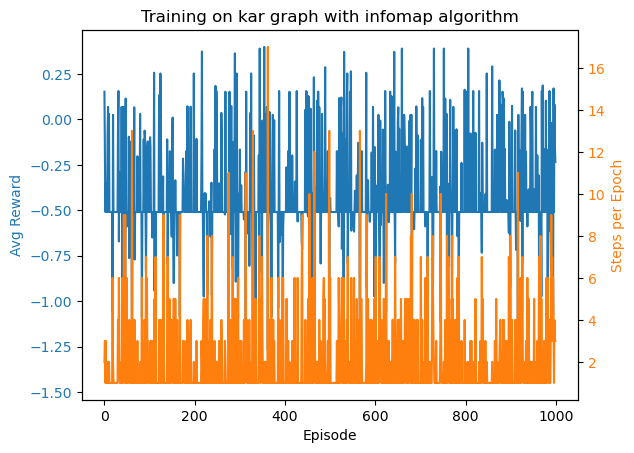

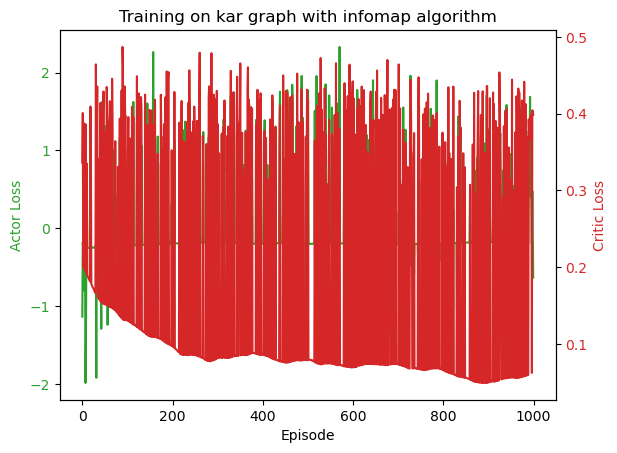

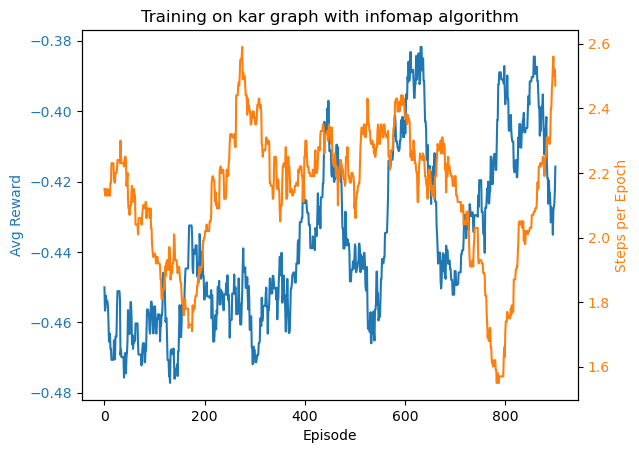

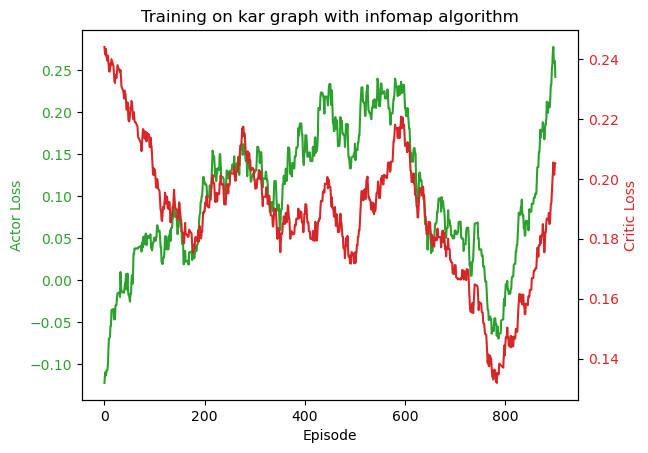

* ------------------ Model Hyperparameters ------------------
* Learning rate:  0.0001
* Gamma parameter:  0.5
* Lambda Metric:  10
* Alpha Metric:  0.7
* Value for clipping the loss function:  1.1920928955078125e-07


* Episode 1000 | Avg Reward: -1.08 | Avg Steps: 1 | Actor Loss: -0.58 | Critic Loss: 0.28: 100%|██████████| 1000/1000 [01:12<00:00, 13.72it/s]


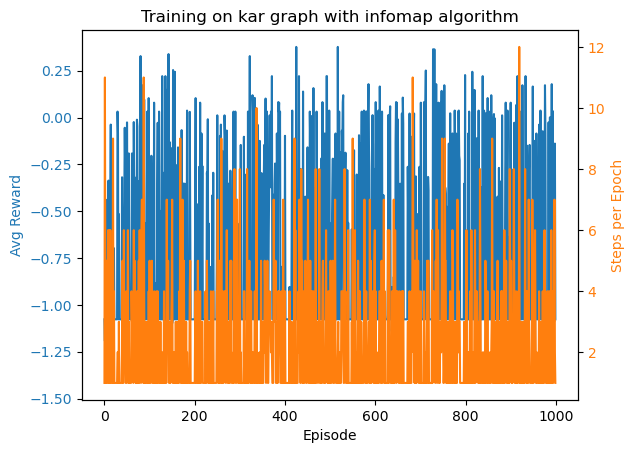

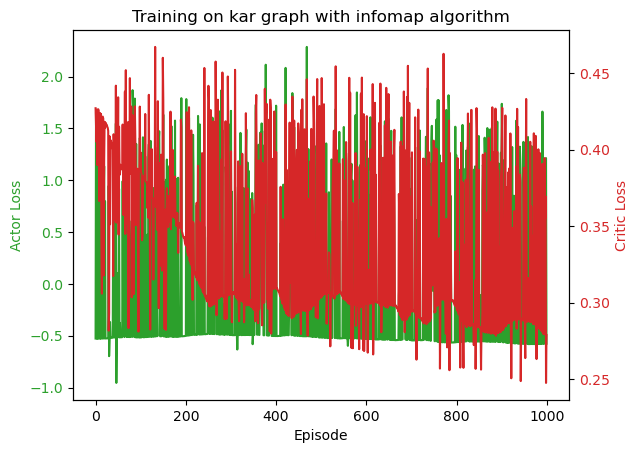

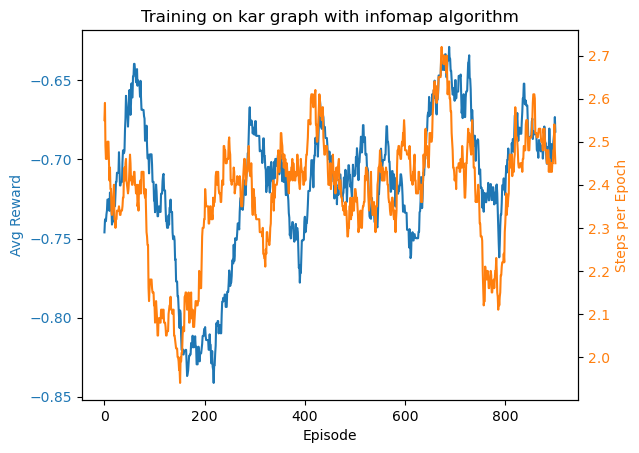

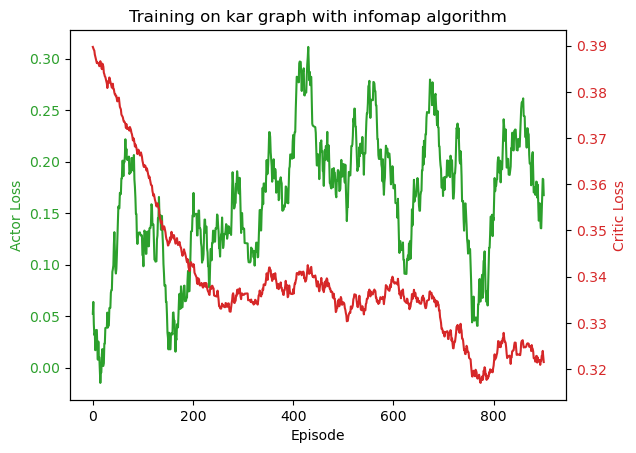

* ------------------ Model Hyperparameters ------------------
* Learning rate:  0.0001
* Gamma parameter:  0.5
* Lambda Metric:  10
* Alpha Metric:  0.9
* Value for clipping the loss function:  1.1920928955078125e-07


* Episode 1000 | Avg Reward: -0.29 | Avg Steps: 5 | Actor Loss: 0.27 | Critic Loss: 0.37: 100%|██████████| 1000/1000 [01:20<00:00, 12.42it/s]


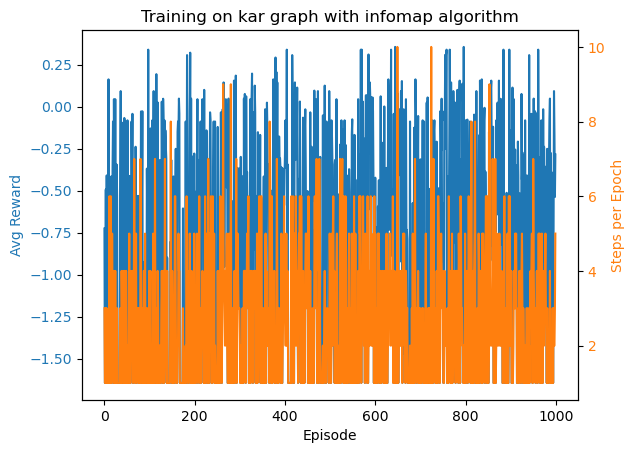

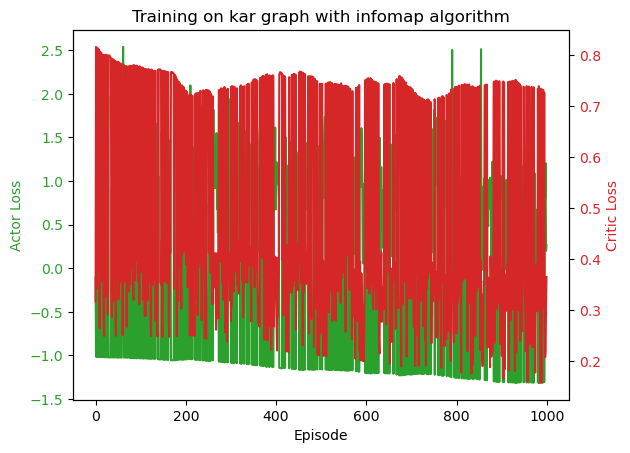

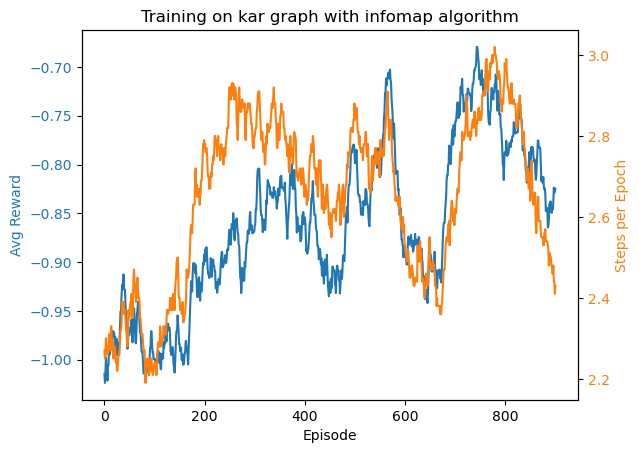

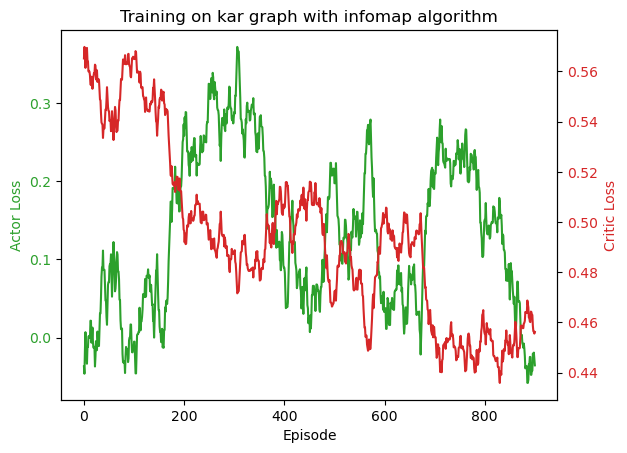

* ------------------ Model Hyperparameters ------------------
* Learning rate:  0.0001
* Gamma parameter:  0.7
* Lambda Metric:  0.001
* Alpha Metric:  0.1
* Value for clipping the loss function:  1.1920928955078125e-07


* Episode 1000 | Avg Reward: 1.00 | Avg Steps: 1 | Actor Loss: 0.66 | Critic Loss: 0.37: 100%|██████████| 1000/1000 [01:14<00:00, 13.37it/s] 


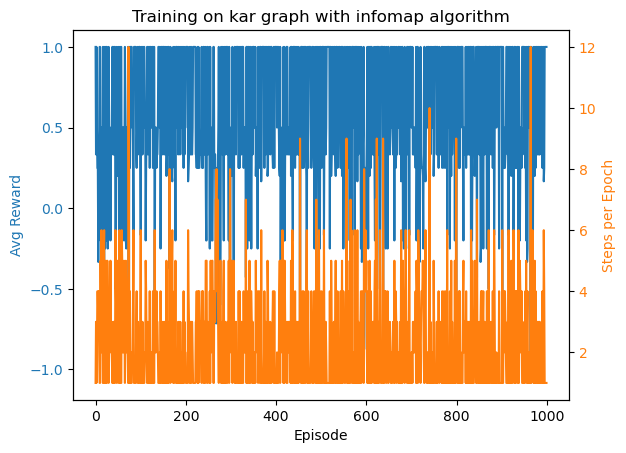

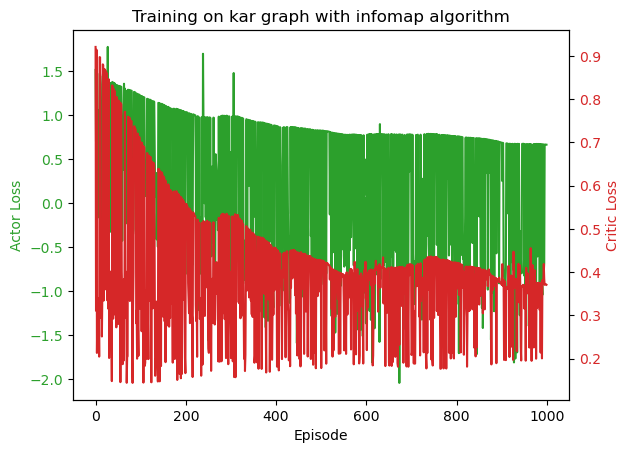

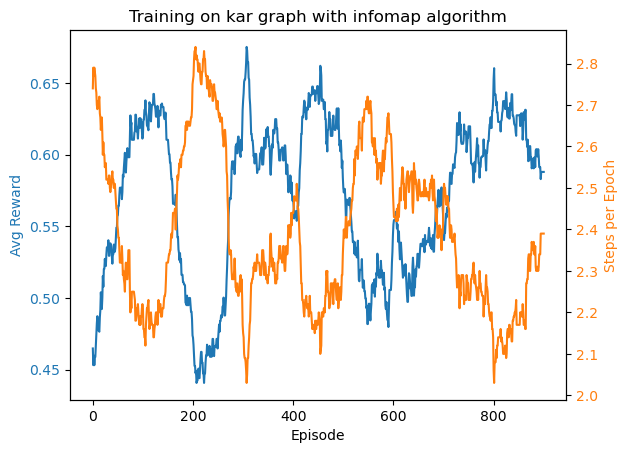

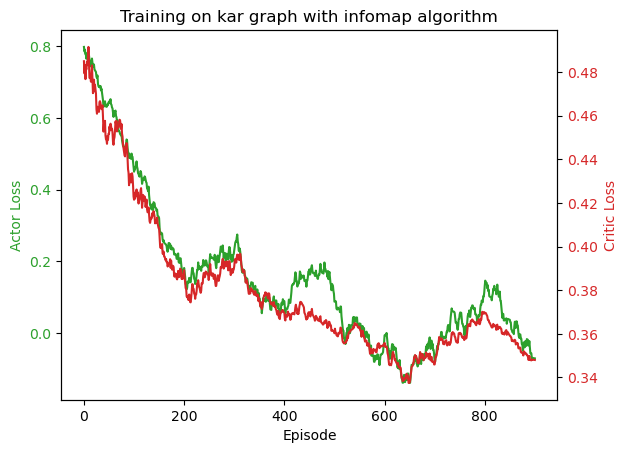

* ------------------ Model Hyperparameters ------------------
* Learning rate:  0.0001
* Gamma parameter:  0.7
* Lambda Metric:  0.001
* Alpha Metric:  0.3
* Value for clipping the loss function:  1.1920928955078125e-07


* Episode 1000 | Avg Reward: 1.00 | Avg Steps: 1 | Actor Loss: 0.45 | Critic Loss: 0.32: 100%|██████████| 1000/1000 [01:08<00:00, 14.51it/s] 


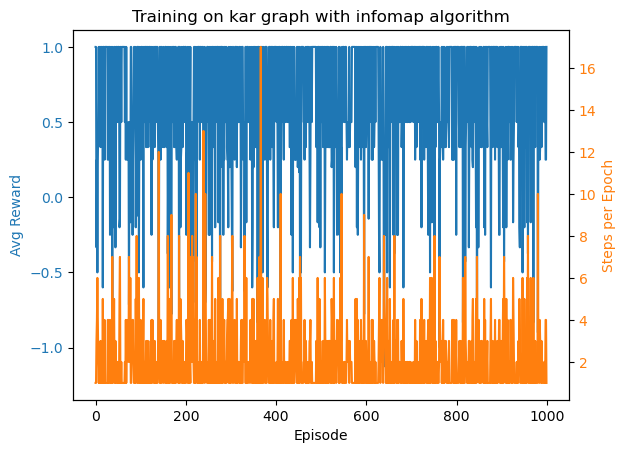

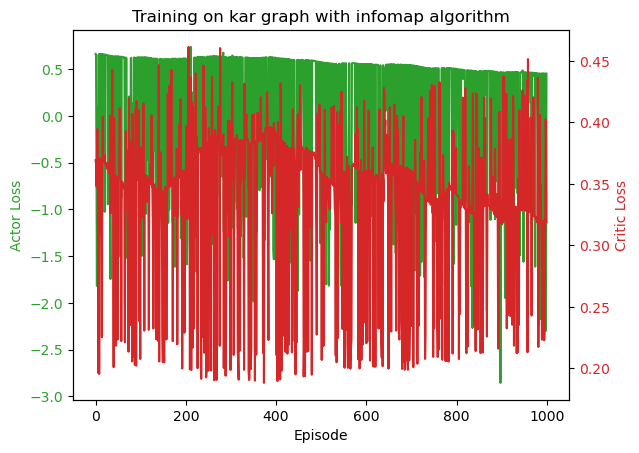

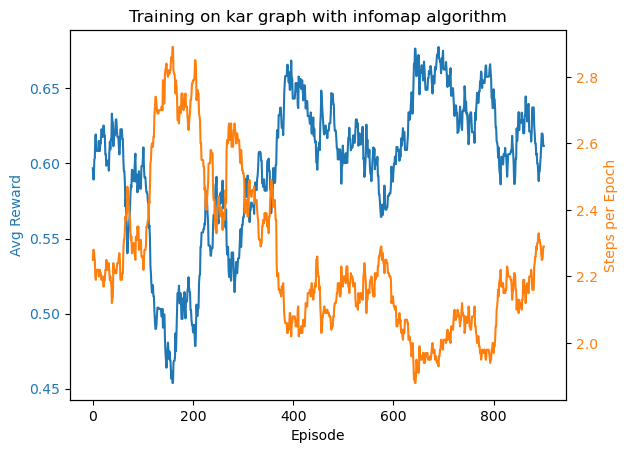

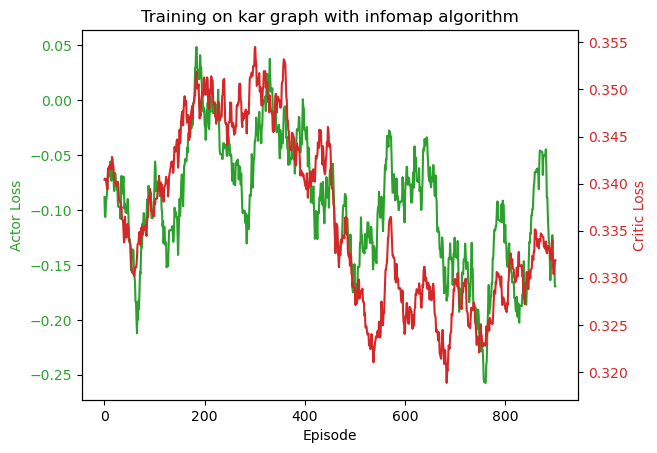

* ------------------ Model Hyperparameters ------------------
* Learning rate:  0.0001
* Gamma parameter:  0.7
* Lambda Metric:  0.001
* Alpha Metric:  0.5
* Value for clipping the loss function:  1.1920928955078125e-07


* Episode 1000 | Avg Reward: 1.00 | Avg Steps: 1 | Actor Loss: 0.25 | Critic Loss: 0.20: 100%|██████████| 1000/1000 [01:00<00:00, 16.39it/s] 


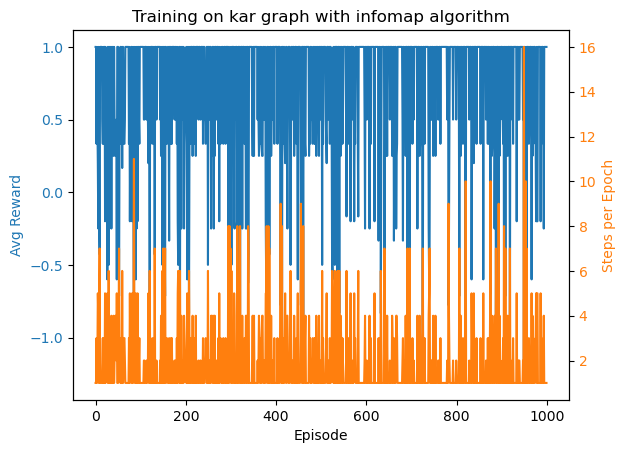

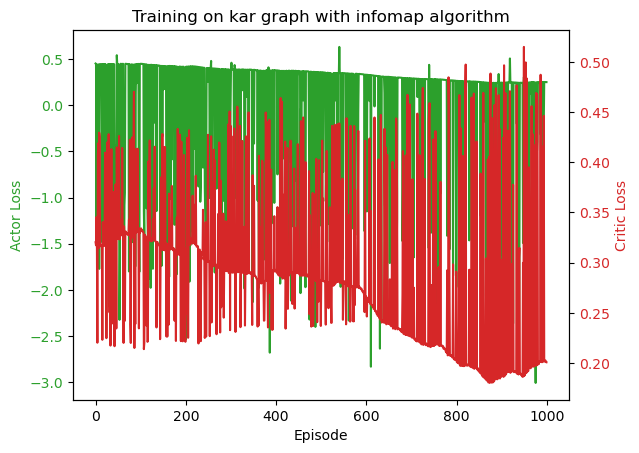

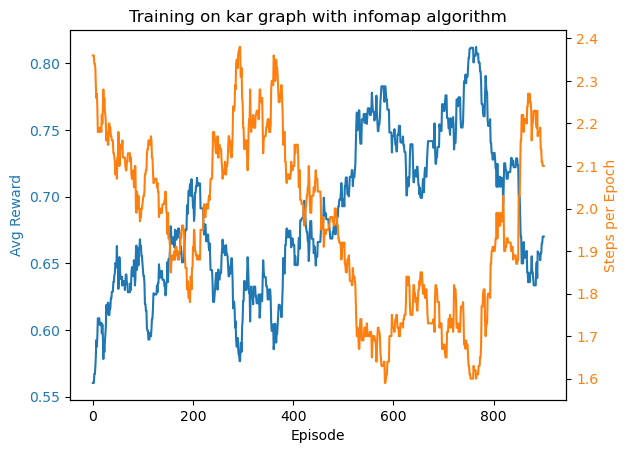

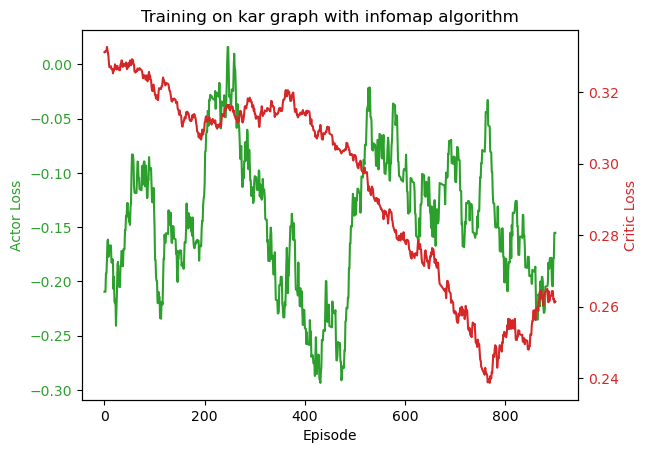

* ------------------ Model Hyperparameters ------------------
* Learning rate:  0.0001
* Gamma parameter:  0.7
* Lambda Metric:  0.001
* Alpha Metric:  0.7
* Value for clipping the loss function:  1.1920928955078125e-07


* Episode 1000 | Avg Reward: 1.00 | Avg Steps: 1 | Actor Loss: 0.13 | Critic Loss: 0.12: 100%|██████████| 1000/1000 [00:55<00:00, 17.96it/s] 


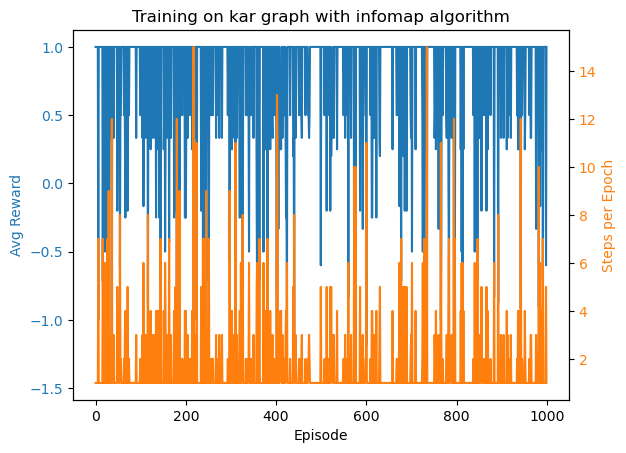

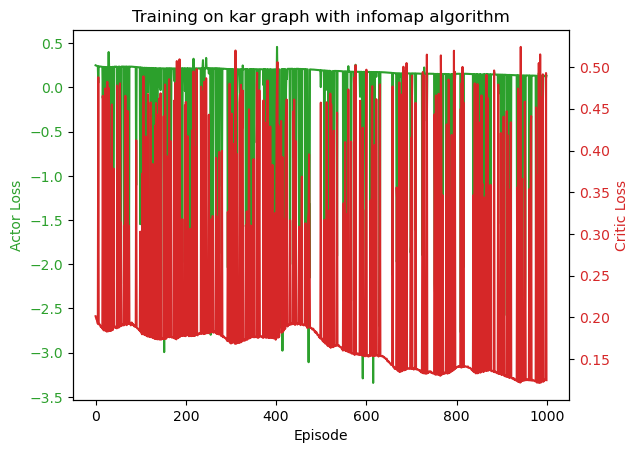

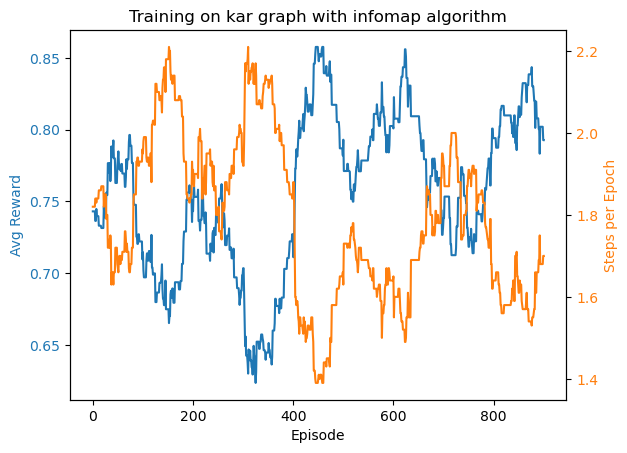

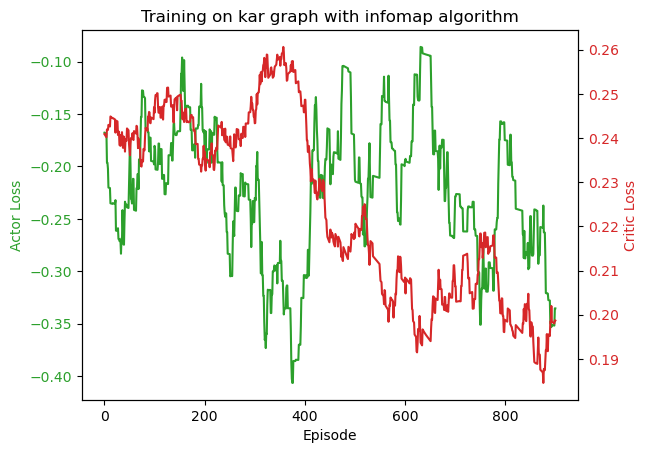

* ------------------ Model Hyperparameters ------------------
* Learning rate:  0.0001
* Gamma parameter:  0.7
* Lambda Metric:  0.001
* Alpha Metric:  0.9
* Value for clipping the loss function:  1.1920928955078125e-07


* Episode 1000 | Avg Reward: 1.00 | Avg Steps: 1 | Actor Loss: 0.08 | Critic Loss: 0.08: 100%|██████████| 1000/1000 [00:53<00:00, 18.71it/s] 


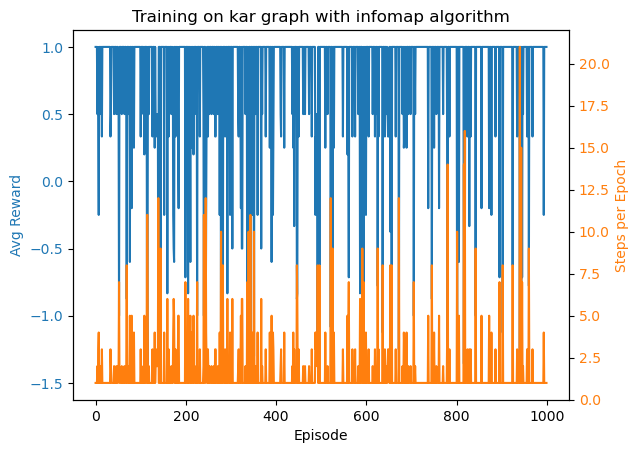

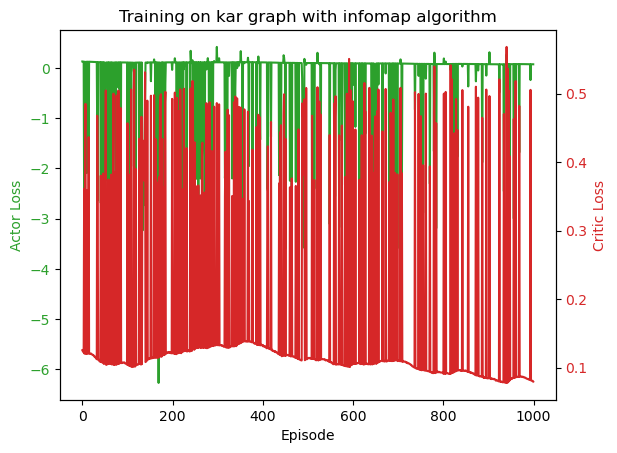

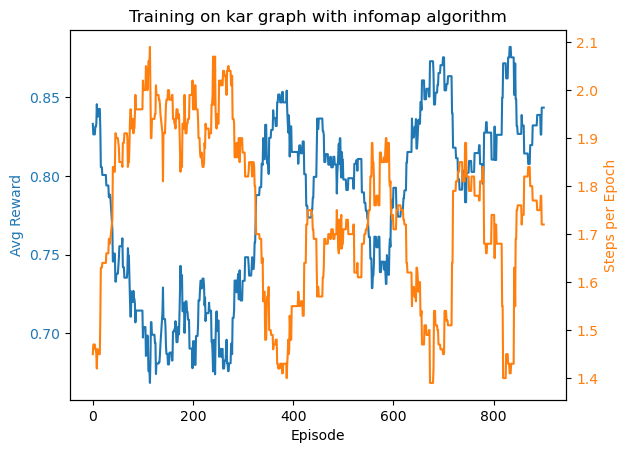

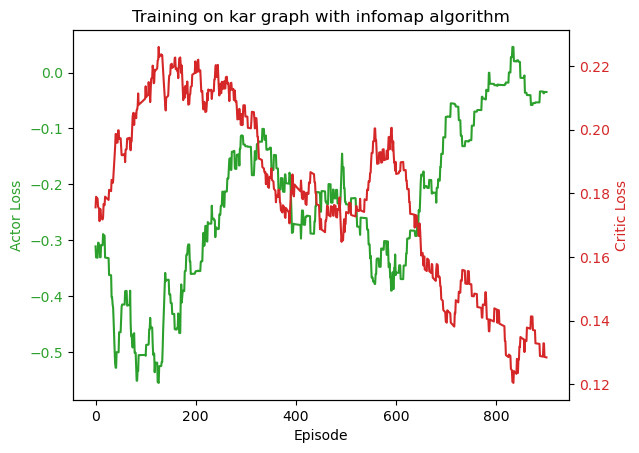

* ------------------ Model Hyperparameters ------------------
* Learning rate:  0.0001
* Gamma parameter:  0.7
* Lambda Metric:  0.01
* Alpha Metric:  0.1
* Value for clipping the loss function:  1.1920928955078125e-07


* Episode 903 | Avg Reward: -0.78 | Avg Steps: 9 | Actor Loss: -0.05 | Critic Loss: 0.49:  90%|█████████ | 902/1000 [00:47<00:03, 25.71it/s] 

In [ ]:
print("*"*20, "Setup Information", "*"*20)

# ° ------ Graph Setup ------ ° #
# ! REAL GRAPH Graph path (change the following line to change the graph)
graph_path = FilePaths.KAR.value
# Load the graph from the dataset folder
graph = Utils.import_mtx_graph(graph_path)
# ! SYNTHETIC GRAPH Graph path (change the following line to change the graph)
# graph, graph_path = Utils.generate_lfr_benchmark_graph()
# Set the environment name as the graph name
env_name = graph_path.split("/")[-1].split(".")[0]
# Print the number of nodes and edges
print("* Graph Name:", env_name)
print("*", graph)

# ° --- Environment Setup --- ° #
# ! Define the detection algorithm to use (change the following line to change the algorithm)
detection_alg = DetectionAlgorithms.INF.value
# Define the environment
env = GraphEnvironment(
    graph=graph,
    env_name=env_name,
    community_detection_algorithm=detection_alg)

# ° ------ Agent Setup ------ ° #
# Hyperparameters
lr_list = HyperParams.LR.value          # [1e-4, 1e-3, 1e-2, 1e-1]
gamma_list = HyperParams.GAMMA.value    # [0.3, 0.5, 0.7, 0.9]
lambda_list = HyperParams.LAMBDA.value  # [0.001, 0.01, 0.1, 1, 10]
alpha_list = HyperParams.ALPHA.value    # [0.001, 0.01, 0.1, 1, 10]
# Define the agent
agent = Agent(
    env=env,
    lr=lr_list,
    gamma=gamma_list,
    lambda_metrics=lambda_list,
    alpha_metrics=alpha_list)
# Training
agent.grid_search()

In [ ]:
!zip -r file.zip 

In [ ]:
from IPython.display import FileLink
FileLink(r'file.zip')